## Import das bibliotecas utilizadas


In [2]:
import pandas as pd
import numpy as np
import openpyxl

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import multimode


## Carregamento do dataframe e/ou conversão em outro formato

In [3]:
df_raw_file = pd.read_excel (r'Projeto/imf-dm-export-20230513.xls',sheet_name='NGDP_RPCH')
df_raw_file.head(5)

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
1,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
2,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5
4,Angola,2.4,-4.4,0,4.2,6,3.5,2.9,4.1,6.1,...,-0.7,-5.6,1.1,2.8,3.5,3.7,4,4.1,4.2,4.2


## Descrição dos dados

### Tipo dos dados

In [4]:
df = df_raw_file.copy()
df.shape
df.dtypes

Real GDP growth (Annual percent change)    object
1980                                       object
1981                                       object
1982                                       object
1983                                       object
1984                                       object
1985                                       object
1986                                       object
1987                                       object
1988                                       object
1989                                       object
1990                                       object
1991                                       object
1992                                       object
1993                                       object
1994                                       object
1995                                       object
1996                                       object
1997                                       object
1998                                       object


As colunas precisam ser convertidas para tipo numérico pois estamos tratando de valores numéricos (GDP)


### Transpose no dataframe

In [5]:
df_transpose = df.transpose()
new_columns = df_transpose.loc["Real GDP growth (Annual percent change)"]
df_transpose.columns = new_columns
df_transpose = df_transpose.iloc[1:]
df_transpose = df_transpose.reset_index().rename(columns={"index": "year"}) 
# rename index
df_transpose.rename_axis(None)
print(df_transpose)

Real GDP growth (Annual percent change)  year Afghanistan Albania Algeria  \
0                                        1980     no data     2.7    -5.4   
1                                        1981     no data     5.7       3   
2                                        1982     no data     2.9     6.4   
3                                        1983     no data     1.1     5.4   
4                                        1984     no data       2     5.6   
5                                        1985     no data    -1.5     5.6   
6                                        1986     no data     5.6    -0.2   
7                                        1987     no data    -0.8    -0.7   
8                                        1988     no data    -1.4    -1.9   
9                                        1989     no data     9.8     4.8   
10                                       1990     no data     -10     0.8   
11                                       1991     no data     -28    -1.2   

### Renomeando algumas colunas para nomes mais legíveis

In [6]:
replace_dict = {

    'Bahamas, The': 'The Bahamas',
    "China, People's Republic of": 'China',
    "Congo, Dem. Rep. of the": "Dem. Rep. of the Congo",
    "Congo, Republic of ": "Republic of Congo",
    "Gambia, The": "The Gambia",
    "Korea, Republic of": "Republic of Korea",
    "Micronesia, Fed. States of": "Fed. States of Micronesia",
    "South Sudan, Republic of": "Republic of South Sudan",
    "Türkiye, Republic of": "Republic of Turkiye",
    "North Macedonia ": "North Macedonia"  # Removed the space after the colon
}

# Rename columns using the replace_dict
df_transpose.rename(columns=replace_dict, inplace=True)

print(df_transpose.head(5))




Real GDP growth (Annual percent change)  year Afghanistan Albania Algeria  \
0                                        1980     no data     2.7    -5.4   
1                                        1981     no data     5.7       3   
2                                        1982     no data     2.9     6.4   
3                                        1983     no data     1.1     5.4   
4                                        1984     no data       2     5.6   

Real GDP growth (Annual percent change)  Andorra Angola Antigua and Barbuda  \
0                                        no data    2.4                 8.2   
1                                        no data   -4.4                 3.8   
2                                        no data      0                -0.1   
3                                        no data    4.2                 5.4   
4                                        no data      6                10.2   

Real GDP growth (Annual percent change) Argentina  Armenia    

### Verificando posição das colunas

In [7]:
for index, column_name in enumerate(df_transpose.columns):
    print(f"Column name: {column_name}, Position: {index}")


Column name: year, Position: 0
Column name: Afghanistan, Position: 1
Column name: Albania, Position: 2
Column name: Algeria, Position: 3
Column name: Andorra, Position: 4
Column name: Angola, Position: 5
Column name: Antigua and Barbuda, Position: 6
Column name: Argentina, Position: 7
Column name: Armenia, Position: 8
Column name: Aruba, Position: 9
Column name: Australia, Position: 10
Column name: Austria, Position: 11
Column name: Azerbaijan, Position: 12
Column name: The Bahamas, Position: 13
Column name: Bahrain, Position: 14
Column name: Bangladesh, Position: 15
Column name: Barbados, Position: 16
Column name: Belarus, Position: 17
Column name: Belgium, Position: 18
Column name: Belize, Position: 19
Column name: Benin, Position: 20
Column name: Bhutan, Position: 21
Column name: Bolivia, Position: 22
Column name: Bosnia and Herzegovina, Position: 23
Column name: Botswana, Position: 24
Column name: Brazil, Position: 25
Column name: Brunei Darussalam, Position: 26
Column name: Bulgar

### Alterando 'no data' para NaN

In [8]:
# replace "no data" with np.na
df_transpose_copy = df_transpose.copy()
df_transpose_copy = df_transpose_copy.replace('no data', np.nan)

### Verificando quantidade de dados faltantes em cada coluna

In [9]:
## counting the occurrencies of NaN values for each country

nan_counts = df_transpose_copy.isna().sum()
print(nan_counts)


Real GDP growth (Annual percent change)
year                              0
Afghanistan                      31
Albania                           0
Algeria                           0
Andorra                          21
                                 ..
Major advanced economies (G7)     0
Middle East and Central Asia      0
Other advanced economies          0
Sub-Saharan Africa               11
World                             0
Length: 229, dtype: int64


### Verificando quantidade de dados faltantes por País

In [10]:
country_nan = df_transpose_copy.isnull().sum().sort_values()
print(country_nan)


Real GDP growth (Annual percent change)
year                        0
Philippines                 0
Poland                      0
Portugal                    0
Qatar                       0
                           ..
Macao SAR                  22
Nauru                      25
Afghanistan                31
Republic of South Sudan    32
Somalia                    32
Length: 229, dtype: int64


### Veririficando quantidade de dados faltantes por grupos de países

#### Define os grupos de países através do dicionário 'groups'

In [11]:

# Define the groups of countries
groups = {
    "advanced_economies" : ["Andorra","Aruba","Australia","Austria","Bahrain","Belgium","Canada","Cyprus","Czech Republic","Denmark","Estonia","Finland","France","Germany","Greece","Hong Kong SAR","Iceland","Ireland","Israel","Italy","Japan","Republic of Korea","Kuwait","Latvia","Lithuania","Luxembourg","Macao SAR","Malta","Netherlands","New Zealand","Norway","Oman","Portugal","Puerto Rico","Qatar","San Marino","Singapore","Slovak Republic","Slovenia","Spain","Sweden","Switzerland","Taiwan Province of China","United Arab Emirates","United Kingdom","United States"],
    "emerging_and_developing_europe" : ["Bulgaria","Croatia","Hungary","Poland","Romania","Russian Federation","Republic of Turkiye","Ukraine"],
    "asean_5" : ["Indonesia","Malaysia","Philippines","Singapore","Thailand"],
    "sub_saharan_africa" : ["Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Chad","Comoros","Dem. Rep. of the Congo","Republic of Congo","Côte d'Ivoire","Djibouti","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","The Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mauritius","Mozambique","Namibia","Niger","Nigeria","Rwanda","São Tomé and Príncipe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","Republic of South Sudan","Sudan","Tanzania","Togo","Uganda","Zambia","Zimbabwe"],
    "north_africa" : ["Algeria","Egypt","Libya","Morocco","Sudan","Tunisia"],
    "africa" : ["Algeria","Egypt","Libya","Morocco","Sudan","Tunisia","Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Chad","Comoros","Dem. Rep. of the Congo","Republic of Congo","Côte d'Ivoire","Djibouti","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","The Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mauritius","Mozambique","Namibia","Niger","Nigeria","Rwanda","São Tomé and Príncipe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","Republic of South Sudan","Sudan","Tanzania","Togo","Uganda","Zambia","Zimbabwe"],
    "euro_area": ["Austria","Belgium","Cyprus","Estonia","Finland","France","Germany","Greece","Ireland","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Portugal","Slovak Republic","Slovenia","Spain"],
    "european_union": ["Austria","Belgium","Bulgaria","Croatia","Cyprus","Czech Republic","Denmark","Estonia","Finland","France","Germany","Greece","Hungary","Ireland","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Poland","Portugal","Romania","Slovak Republic","Slovenia","Spain","Sweden"],
    "europe": ["Albania","Andorra","Armenia","Austria","Azerbaijan","Belarus","Belgium","Bosnia and Herzegovina","Bulgaria","Croatia","Cyprus","Czech Republic","Denmark","Estonia","Finland","France","Georgia","Germany","Greece","Hungary","Iceland","Ireland","Italy","Kazakhstan","Kosovo","Latvia","Lithuania","Luxembourg","Malta","Moldova","Montenegro","Netherlands","North Macedonia","Norway","Poland","Portugal","Romania","Russian Federation","San Marino","Serbia","Slovak Republic","Slovenia","Spain","Sweden","Switzerland","Republic of Turkiye","Ukraine","United Kingdom"],
    "western_europe": ["Andorra","Austria","Belgium","France","Germany","Luxembourg","Netherlands","Switzerland"],
    "emerging_and_developing_asia": ["Bangladesh","China","India","Indonesia","Iran","Jordan","Lebanon","Malaysia","Pakistan","Philippines","Sri Lanka","Thailand","Republic of Turkiye","Vietnam"],
    "middle_east": ["Bahrain","Iran","Iraq","Israel","Jordan","Kuwait","Lebanon","Oman","Qatar","Saudi Arabia","Syria","United Arab Emirates","Yemen"],
    "southeast_asia": ["Brunei Darussalam","Cambodia","Indonesia","Lao P.D.R.","Malaysia","Myanmar","Philippines","Singapore","Thailand","Timor-Leste","Vietnam"],
    "south_asia": ["Afghanistan","Bangladesh","Bhutan","India","Nepal","Pakistan","Sri Lanka"],
    "east_asia": ["China","Japan","Republic of Korea","Taiwan Province of China"],
    "pacific_islands": ["Fiji","Kiribati","Marshall Islands","Fed. States of Micronesia","Nauru","Palau","Papua New Guinea","Solomon Islands","Tonga","Tuvalu","Vanuatu"],
    "australia_and_new_zealand": ["Australia","New Zealand"],
    "western_hemisphere": ["Argentina","The Bahamas","Barbados","Belize","Bolivia","Brazil","Canada","Chile","Colombia","Costa Rica","Dominica","Dominican Republic","Ecuador","El Salvador","Grenada","Guatemala","Guyana","Haiti","Honduras","Jamaica","Mexico","Nicaragua","Panama","Paraguay","Peru","Saint Kitts and Nevis","Saint Lucia","Saint Vincent and the Grenadines","Suriname","Trinidad and Tobago","United States","Uruguay","Venezuela"],
    "south_america": ["Antigua and Barbuda","Argentina","Bolivia","Brazil","Chile","Colombia","Ecuador","Guyana","Paraguay","Peru","Suriname","Uruguay","Venezuela"],
    "north_america": ["Canada","United States"],
    "central_america": ["Belize","Costa Rica","El Salvador","Guatemala","Honduras","Nicaragua","Panama"],
    "caribbean": ["Antigua and Barbuda","The Bahamas","Barbados","Dominica","Dominican Republic","Grenada","Haiti","Jamaica","Saint Kitts and Nevis","Saint Lucia","Saint Vincent and the Grenadines","Trinidad and Tobago"],
    "asia_and_pacific": ["Afghanistan","Bangladesh","Bhutan","Brunei Darussalam","Cambodia","China","Fiji","India","Indonesia","Iran","Japan","Kazakhstan","Kiribati","Kyrgyz Republic","Lao P.D.R.","Malaysia","Maldives","Marshall Islands","Fed. States of Micronesia","Mongolia","Myanmar","Nauru","Nepal","New Zealand","Pakistan","Palau","Papua New Guinea","Philippines","Samoa","Singapore","Solomon Islands","Republic of Korea","Sri Lanka","Taiwan Province of China","Tajikistan","Thailand","Timor-Leste","Tonga","Turkmenistan","Tuvalu","Uzbekistan","Vanuatu","Vietnam","Belize","Costa Rica","El Salvador","Guatemala","Honduras","Nicaragua","Panama"],
    "middle_east_and_central_asia": ["Afghanistan","Armenia","Azerbaijan","Bahrain","Iran","Iraq","Israel","Jordan","Kazakhstan","Kuwait","Kyrgyz Republic","Lebanon","Oman","Pakistan","Qatar","Saudi Arabia","Syria","Tajikistan","Turkmenistan","United Arab Emirates","Uzbekistan","Yemen"],
    "central_asia_and_the_caucasus": ["Armenia","Azerbaijan","Georgia","Kazakhstan","Kyrgyz Republic","Tajikistan","Turkmenistan","Uzbekistan"],
    "latin_america_and_the_caribbean": ["Antigua and Barbuda","Argentina","The Bahamas","Barbados","Belize","Bolivia","Brazil","Chile","Colombia","Costa Rica","Dominica","Dominican Republic","Ecuador","El Salvador","Grenada","Guatemala","Guyana","Haiti","Honduras","Jamaica","Mexico","Nicaragua","Panama","Paraguay","Peru","Saint Kitts and Nevis","Saint Lucia","Saint Vincent and the Grenadines","Suriname","Trinidad and Tobago","Uruguay","Venezuela"],
    "soviet_union_countries" : ["Armenia","Azerbaijan","Belarus","Estonia","Georgia","Kazakhstan","Kyrgyz Republic", "Latvia","Lithuania","Moldova","Russian Federation", "Tajikistan", "Turkmenistan","Ukraine","Uzbekistan"],
}


In [12]:

# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transpose_copy.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum().sum()  # Calculate the sum of NaN occurrences
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")

Sum of NaN occurrences for advanced_economies: 156
Sum of NaN occurrences for emerging_and_developing_europe: 41
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for sub_saharan_africa: 162
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for africa: 162
Sum of NaN occurrences for euro_area: 71
Sum of NaN occurrences for european_union: 100
Sum of NaN occurrences for europe: 318
Sum of NaN occurrences for western_europe: 22
Sum of NaN occurrences for emerging_and_developing_asia: 9
Sum of NaN occurrences for middle_east: 56
Sum of NaN occurrences for southeast_asia: 54
Sum of NaN occurrences for south_asia: 32
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for pacific_islands: 101
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 4
Sum of NaN occurrences for south_america: 4
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for

### Ocorrencias de valores nulos por grupos individuais

In [13]:
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    print(f"NaN counts for {group_name}:")
    print(nan_counts_group)
    print("\n")

NaN counts for advanced_economies:
Real GDP growth (Annual percent change)
Andorra                     21
Aruba                        7
Australia                    0
Austria                      0
Bahrain                      0
Belgium                      0
Canada                       0
Cyprus                       0
Czech Republic              16
Denmark                      0
Estonia                     14
Finland                      0
France                       0
Germany                      0
Greece                       0
Hong Kong SAR                0
Iceland                      0
Ireland                      0
Israel                       0
Italy                        0
Japan                        0
Republic of Korea            0
Kuwait                       0
Latvia                      13
Lithuania                   16
Luxembourg                   0
Macao SAR                   22
Malta                        0
Netherlands                  1
New Zealand               

### Graficos para visualizar a quantidade de dados faltantes por grupo

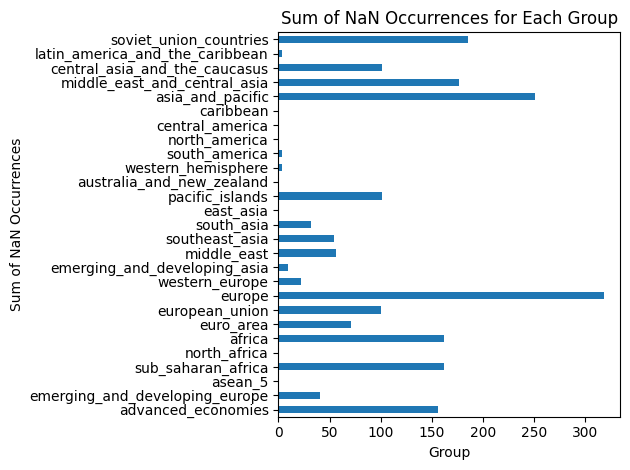

In [14]:

nan_counts = df_transpose_copy.isna().sum()
group_nan_sums = {}
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    group_nan_sums[group_name] = nan_sum

# Convert the dictionary to a DataFrame
nan_sums_df = pd.DataFrame.from_dict(group_nan_sums, orient='index', columns=['Sum of NaN Occurrences'])

# Create vertical bar plot
nan_sums_df.plot(kind='barh', legend=None)
plt.xlabel('Group')
plt.ylabel('Sum of NaN Occurrences')
plt.title('Sum of NaN Occurrences for Each Group')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()   

### Quantos países existem por grupos

In [15]:
group_data = []
# Iterate through the dictionary and calculate the number of countries in each group
for group_name, country_list in groups.items():
    num_countries = len(country_list)
    group_data.append({"Group": group_name, "Num_countries": num_countries})

# Create an empty DataFrame
df_groups= pd.DataFrame(group_data)
print(df_groups)


                              Group  Num_countries
0                advanced_economies             46
1    emerging_and_developing_europe              8
2                           asean_5              5
3                sub_saharan_africa             49
4                      north_africa              6
5                            africa             55
6                         euro_area             19
7                    european_union             27
8                            europe             48
9                    western_europe              8
10     emerging_and_developing_asia             14
11                      middle_east             13
12                   southeast_asia             11
13                       south_asia              7
14                        east_asia              4
15                  pacific_islands             11
16        australia_and_new_zealand              2
17               western_hemisphere             33
18                    south_ame

### Gerando os graficos temporais dos grupos

In [16]:
print(df_transpose_copy)
df_transpose_copy.dtypes


Real GDP growth (Annual percent change)  year  Afghanistan  Albania  Algeria  \
0                                        1980          NaN      2.7     -5.4   
1                                        1981          NaN      5.7      3.0   
2                                        1982          NaN      2.9      6.4   
3                                        1983          NaN      1.1      5.4   
4                                        1984          NaN      2.0      5.6   
5                                        1985          NaN     -1.5      5.6   
6                                        1986          NaN      5.6     -0.2   
7                                        1987          NaN     -0.8     -0.7   
8                                        1988          NaN     -1.4     -1.9   
9                                        1989          NaN      9.8      4.8   
10                                       1990          NaN    -10.0      0.8   
11                                      

Real GDP growth (Annual percent change)
year                               int64
Afghanistan                      float64
Albania                          float64
Algeria                          float64
Andorra                          float64
                                  ...   
Major advanced economies (G7)    float64
Middle East and Central Asia     float64
Other advanced economies         float64
Sub-Saharan Africa               float64
World                            float64
Length: 229, dtype: object

### Explorando as infos. em gráficos

#### Ver gráficos de todos os grupos

Altera-se o index do dataframe para os anos, entretanto manteve-se o formato int64, uma vez que vamos usar o comando plot e nele é utilizado o índice para compor o eixo x.

In [17]:
df_transpose_copy.set_index('year', inplace = True)

In [18]:
df_transpose_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49 entries, 1980 to 2028
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB


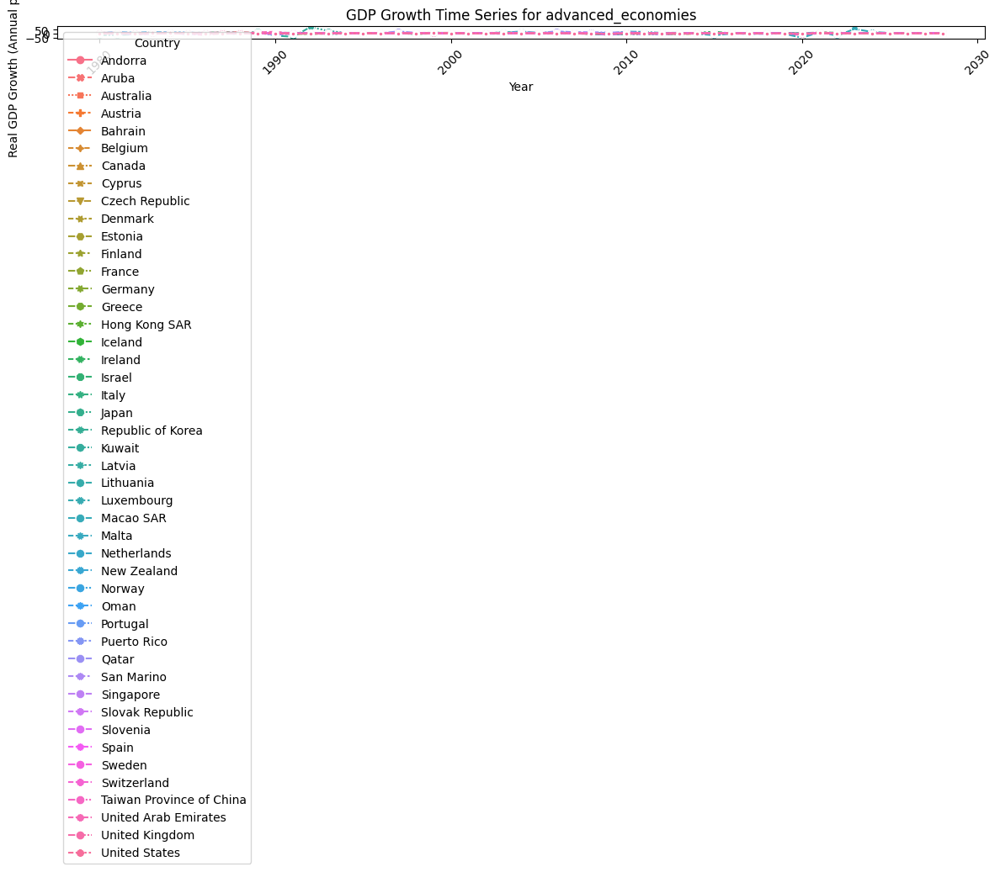

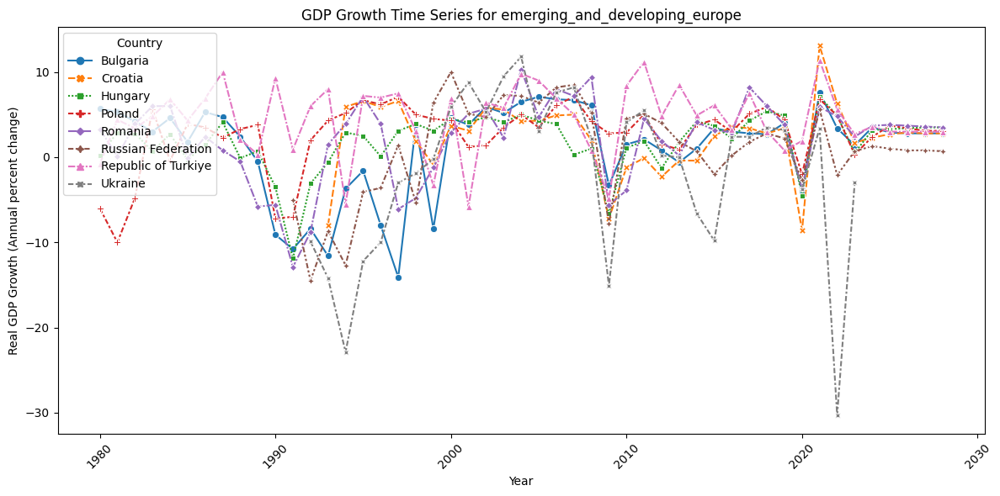

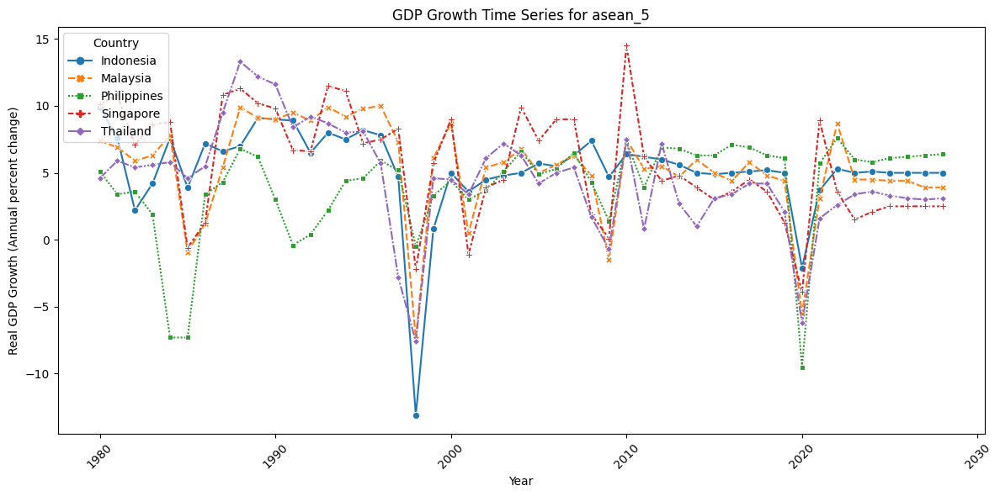

/tmp/ipykernel_303398/297580711.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


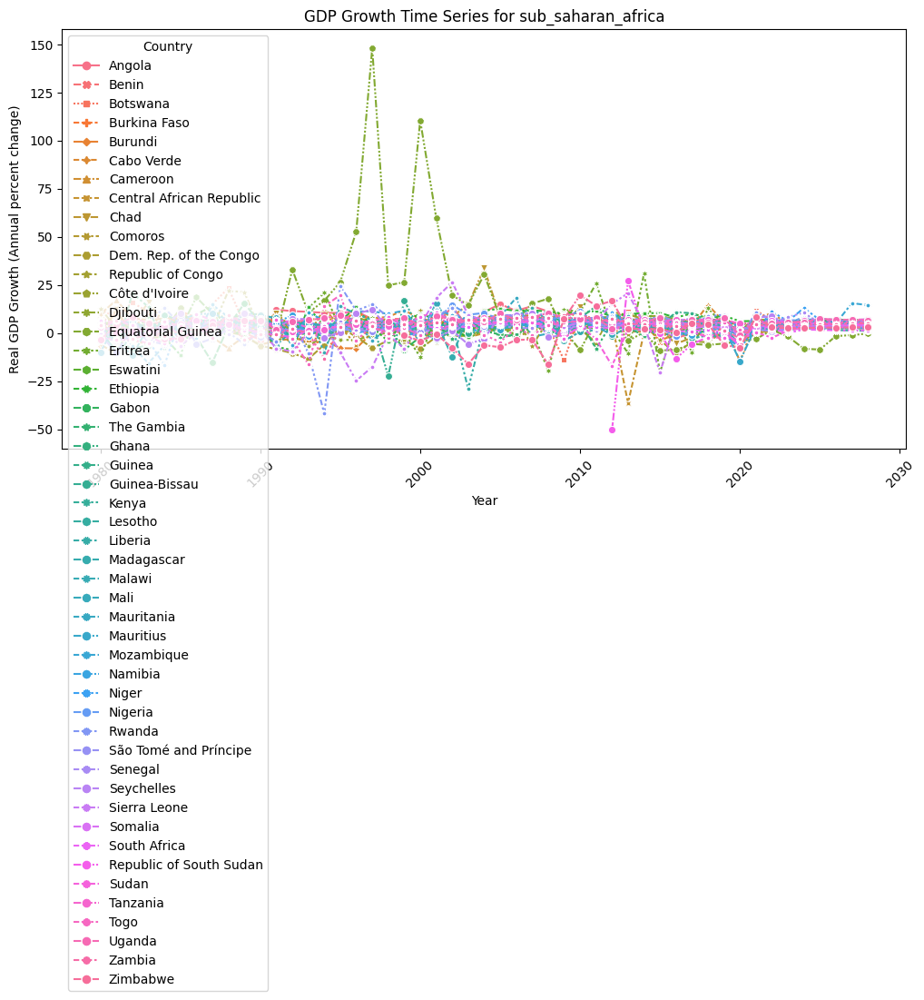

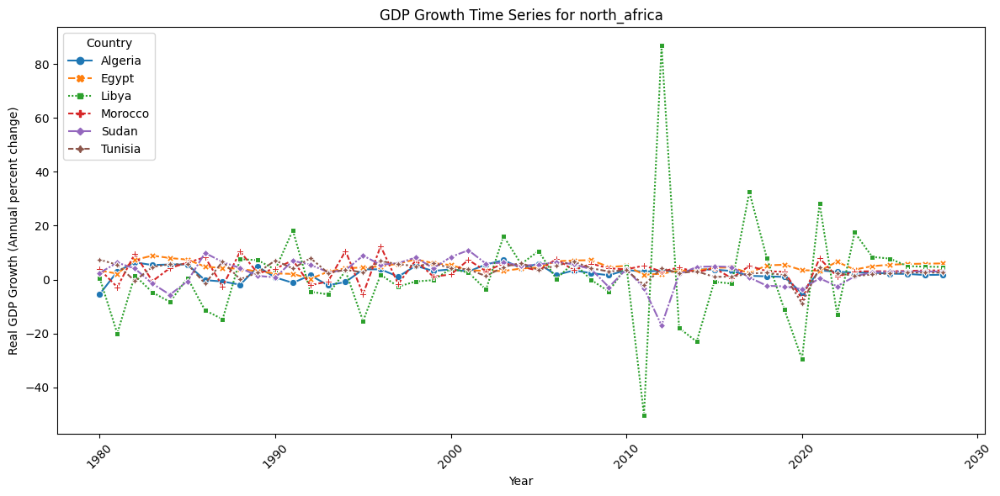

/tmp/ipykernel_303398/297580711.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


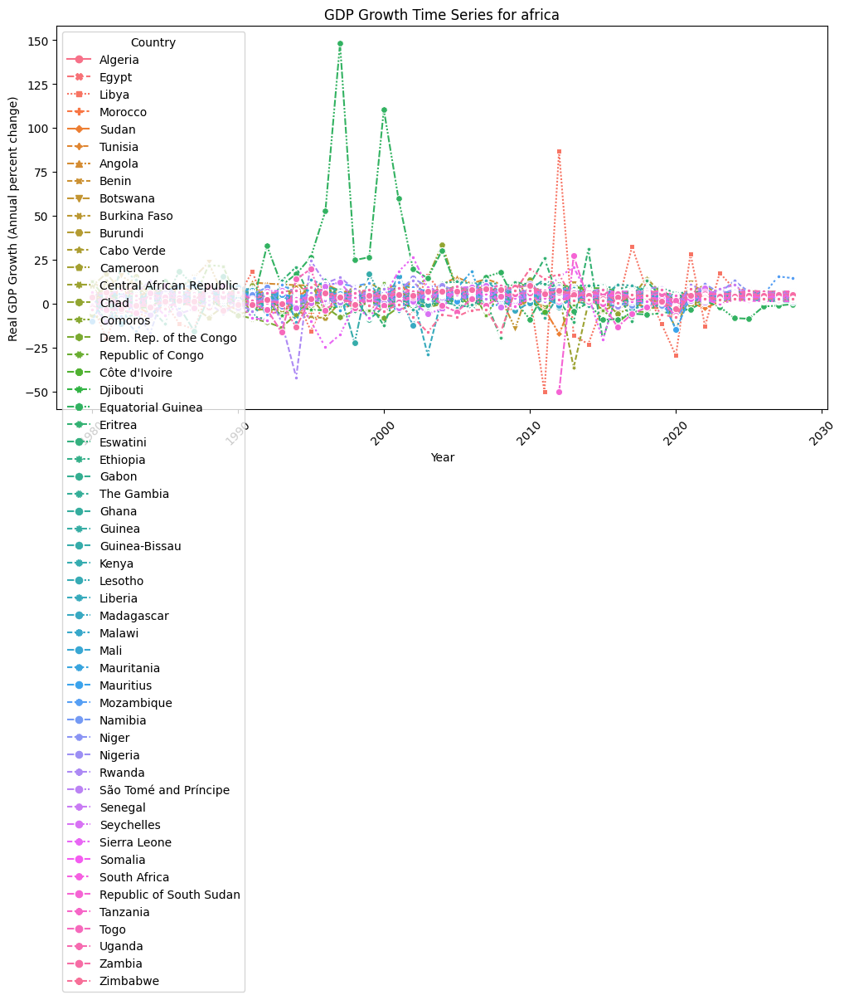

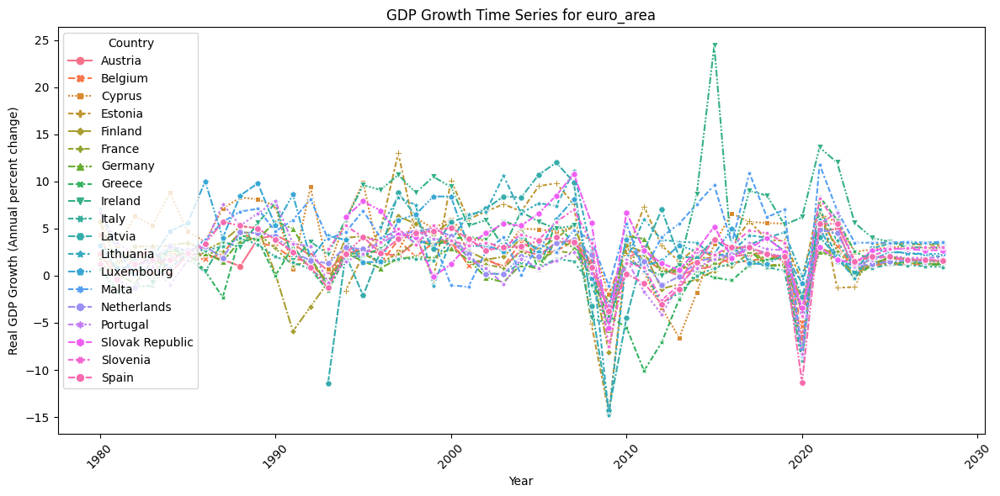

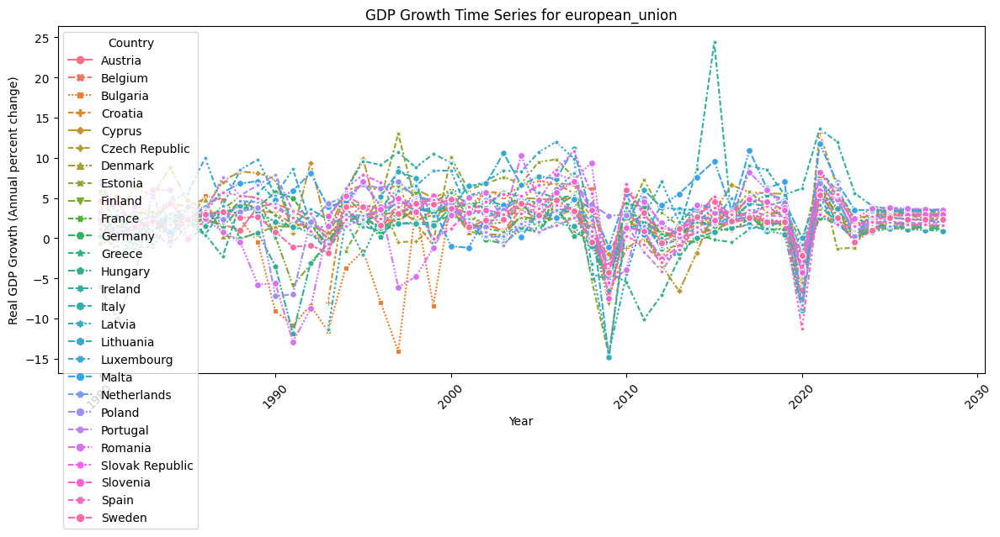

/tmp/ipykernel_303398/297580711.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


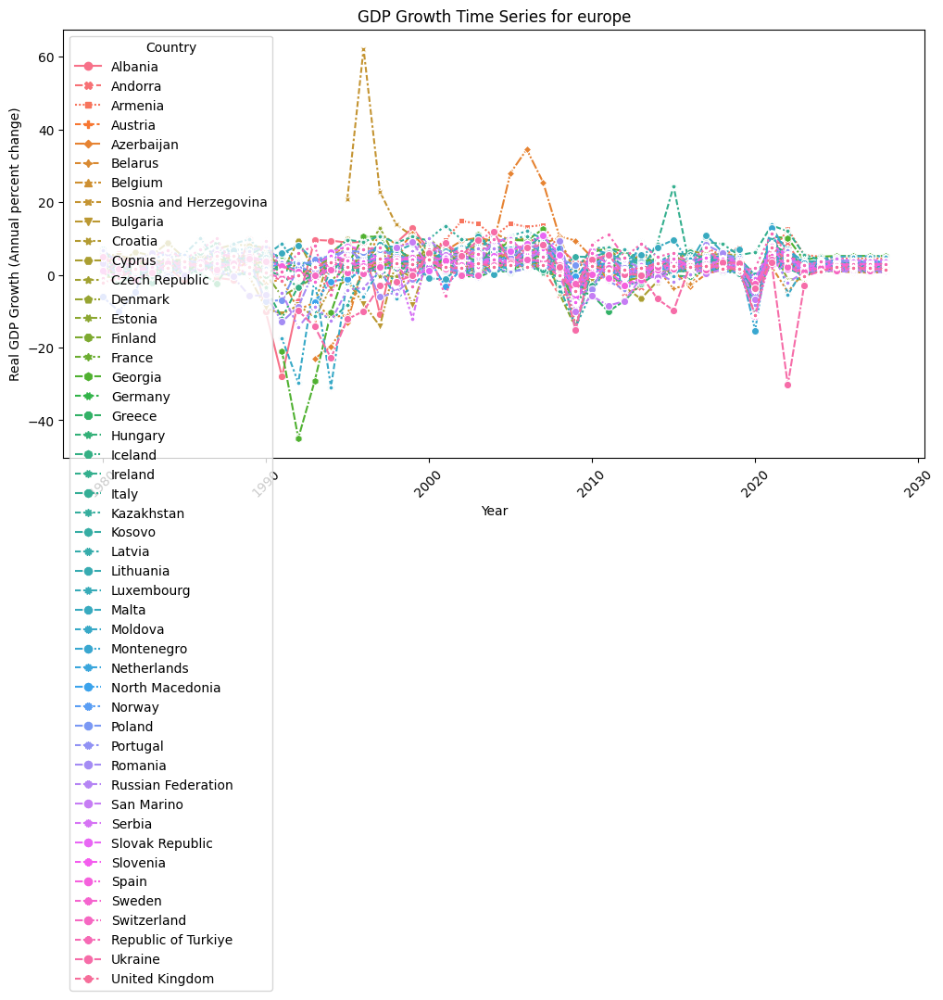

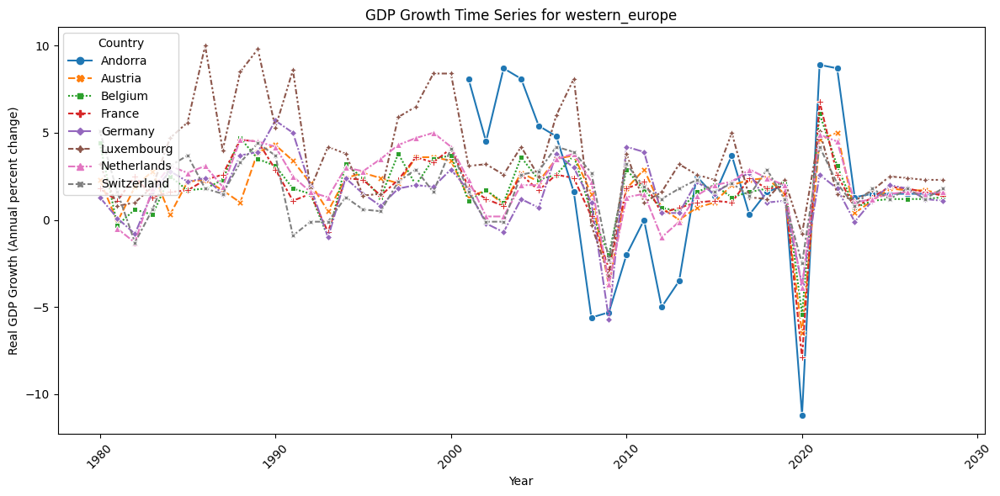

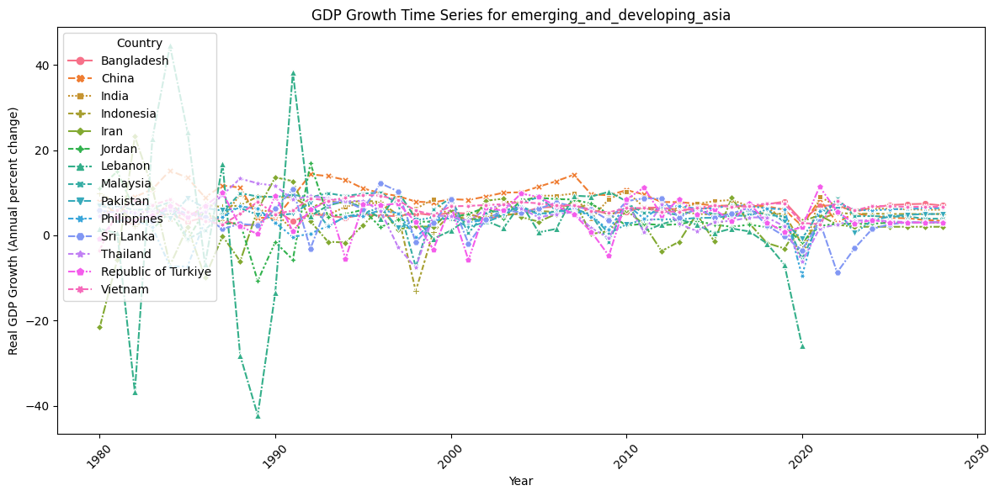

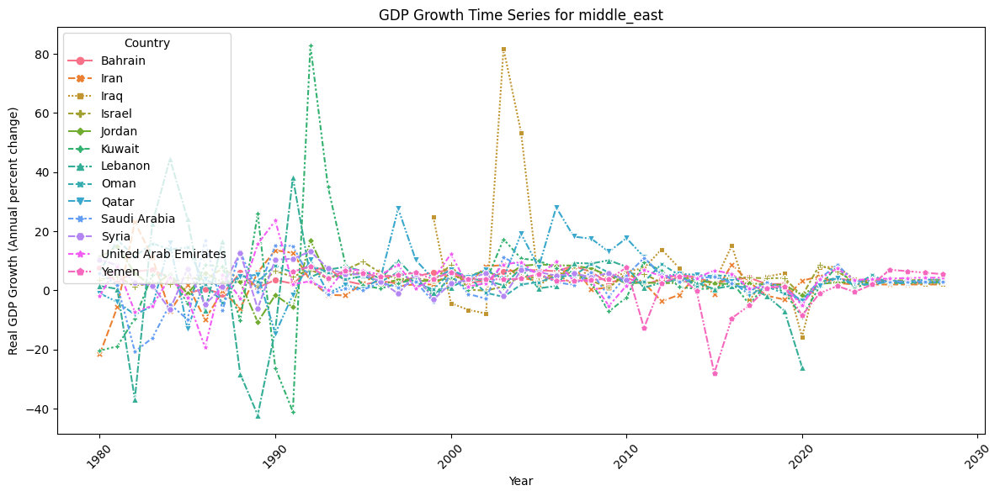

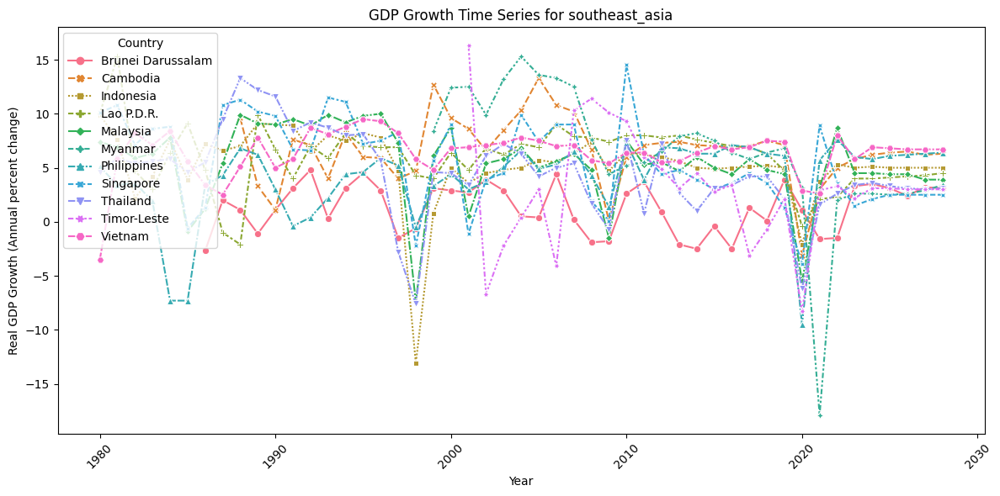

...

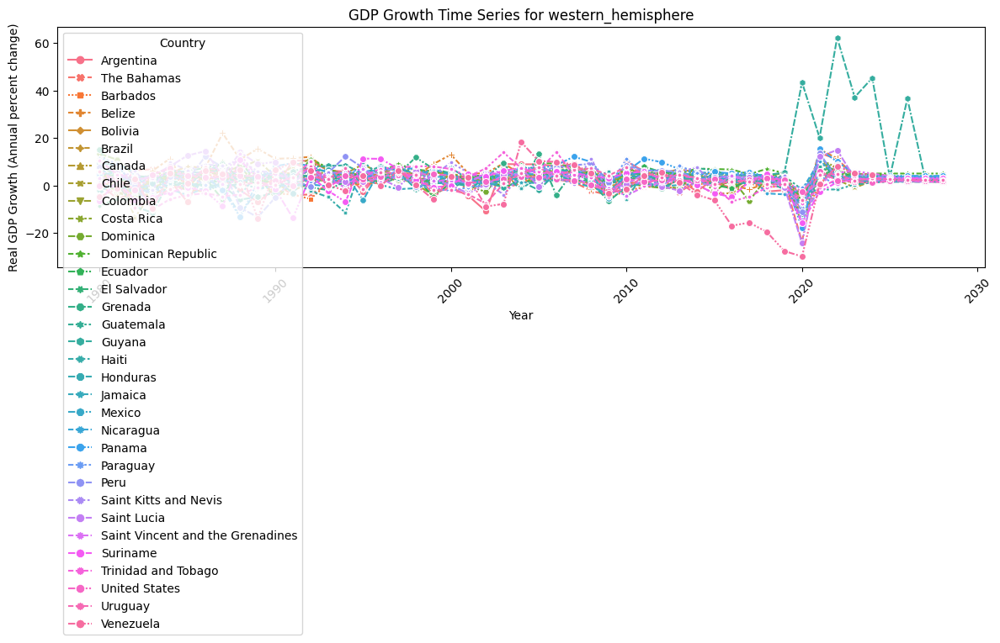

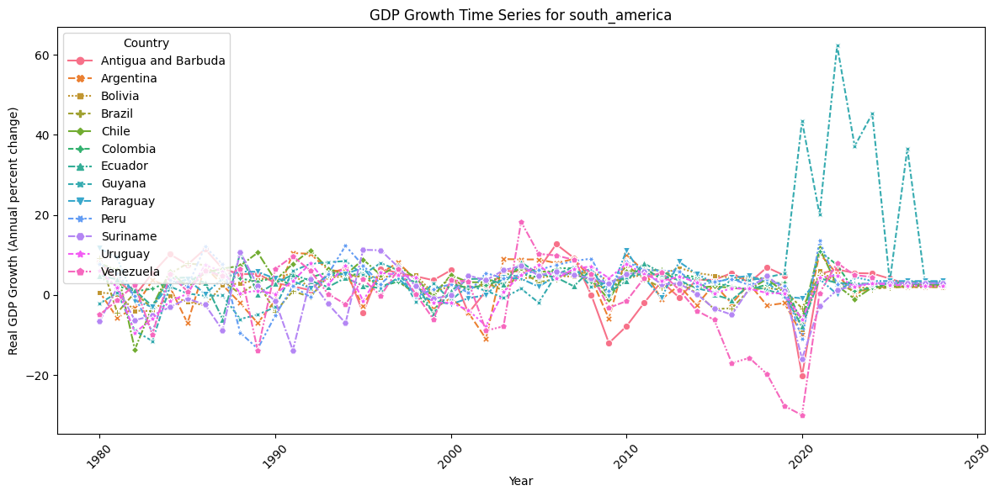

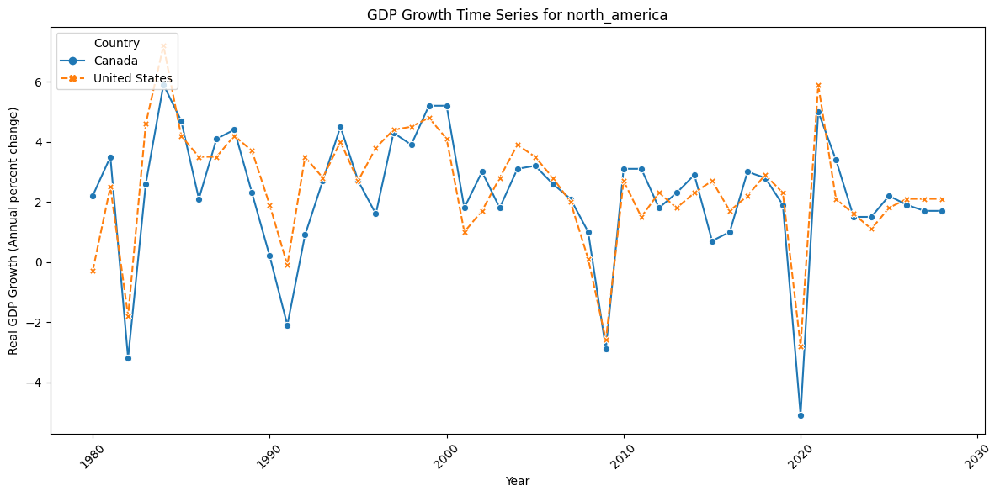

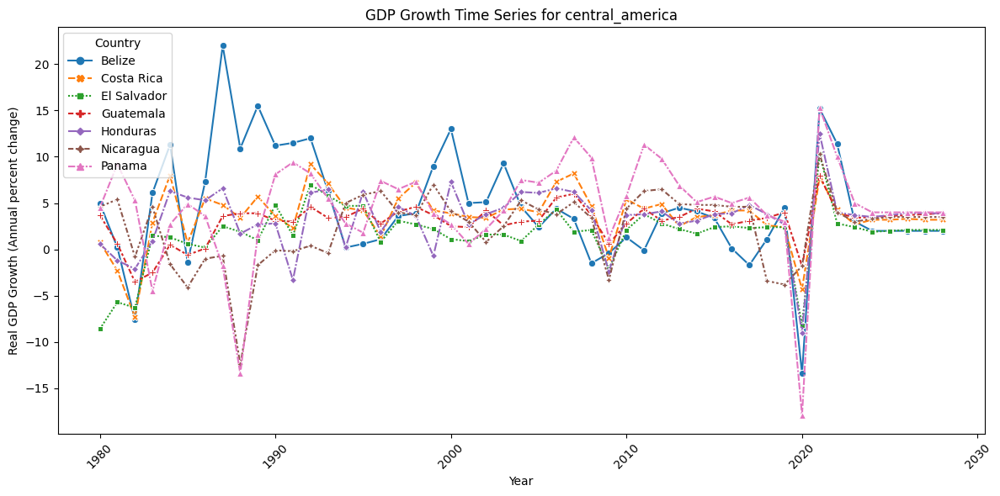

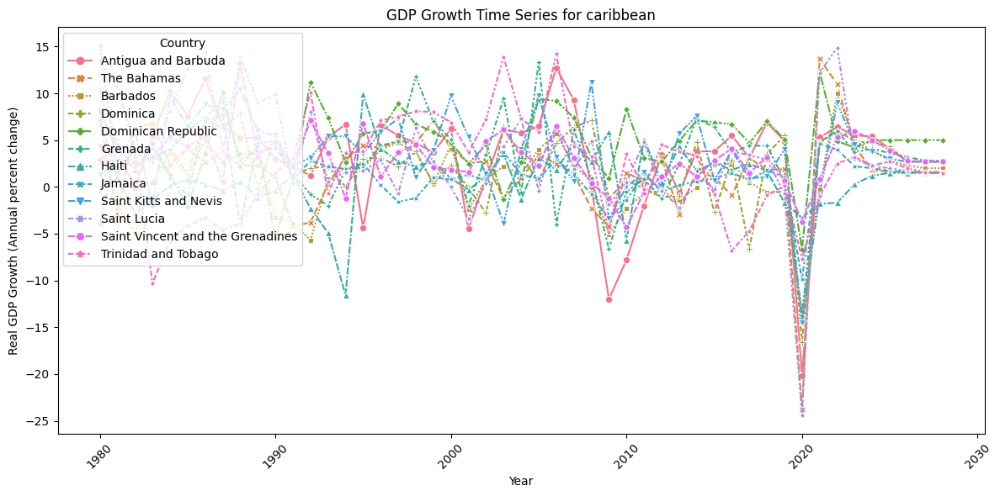

/tmp/ipykernel_303398/297580711.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


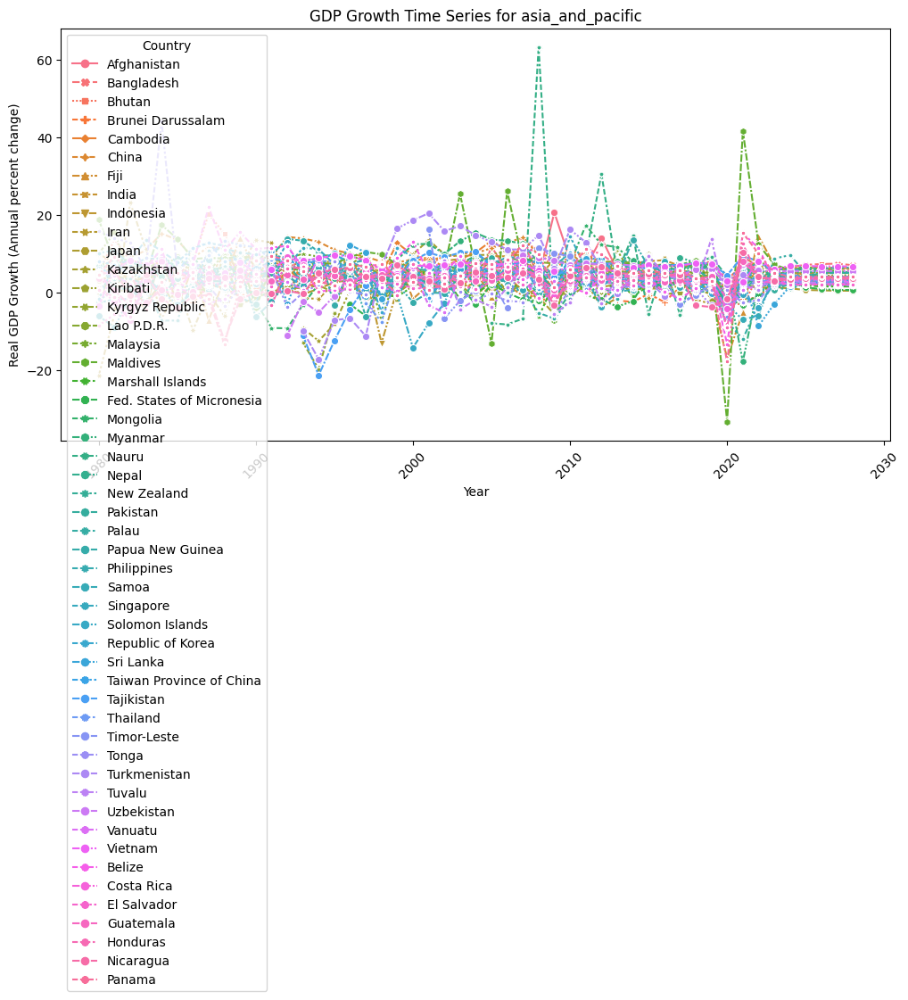

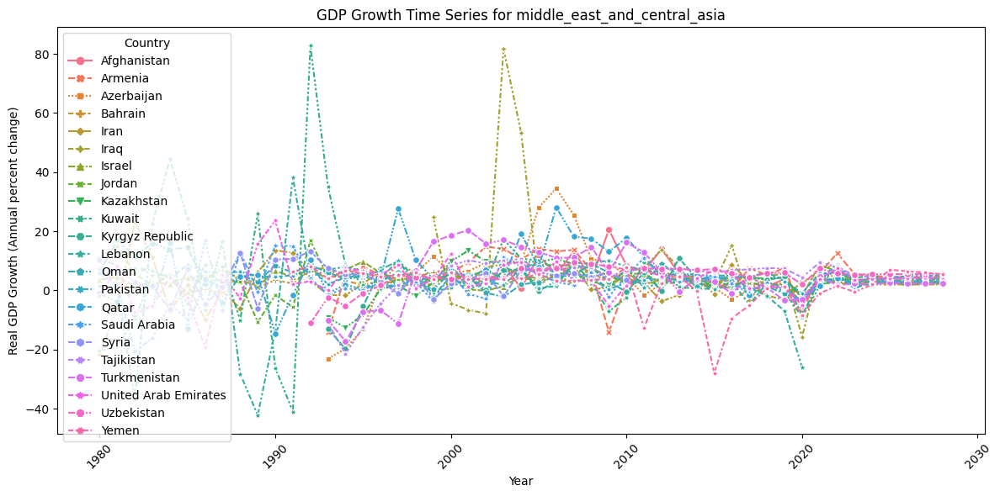

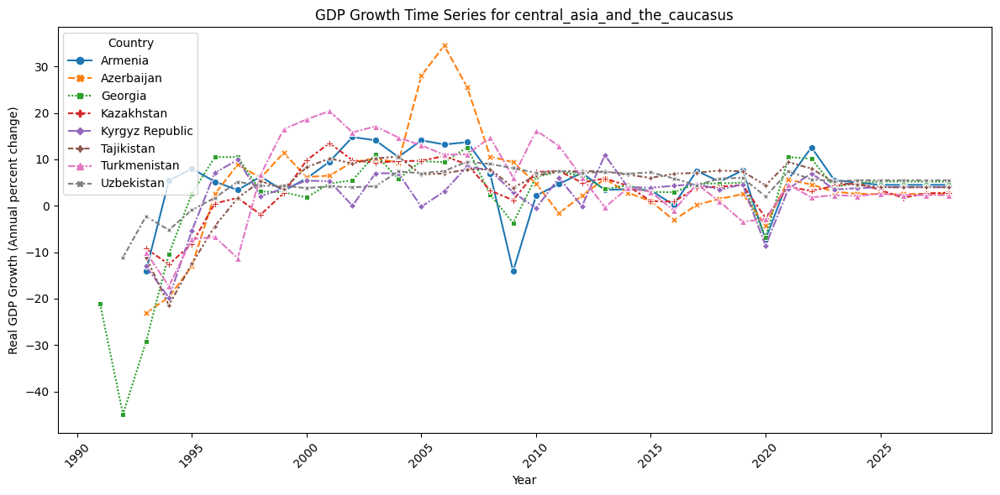

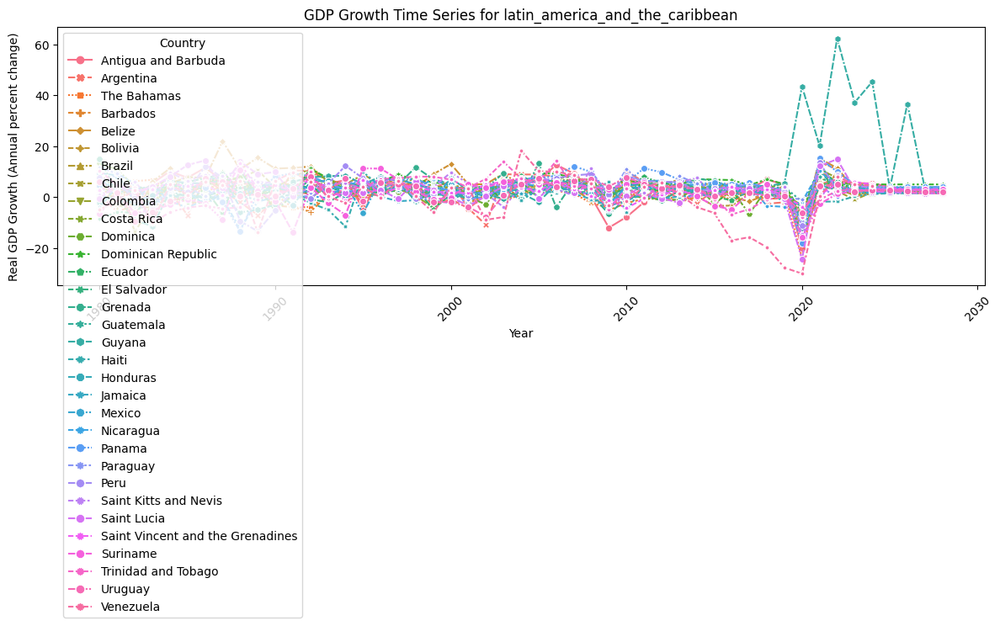

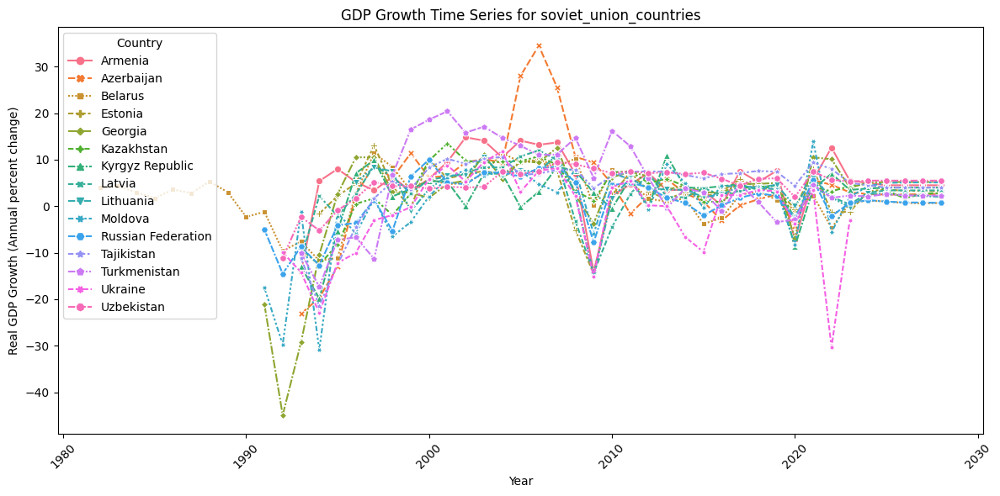

In [19]:
# Create a copy of the DataFrame to avoid the SettingWithCopyWarning
df_transpose_copy1 = df_transpose_copy.copy()
# Rename the index to 'Year'
df_transpose_copy1 = df_transpose_copy1.rename_axis('year')
# Loop through the groups and plot the data
for group_name, country_list in groups.items():
    # Filter the DataFrame to include only the selected countries
    group_data = df_transpose_copy1[country_list]

    # Plot the time series using Seaborn
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=group_data, markers=True)
    plt.title(f"GDP Growth Time Series for {group_name}")
    plt.xlabel("Year")
    plt.ylabel("Real GDP Growth (Annual percent change)")

    plt.xticks(rotation=45)
    plt.tight_layout()

    plt.legend(loc='upper left', title="Country")
    plt.show()


#### Ver gráficos das médias aritméticas dos grupos

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


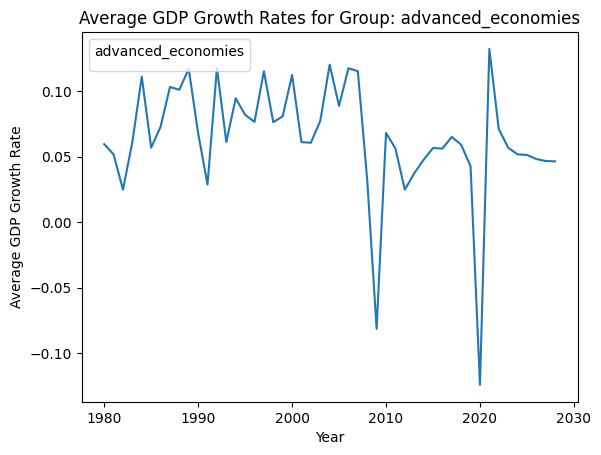

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


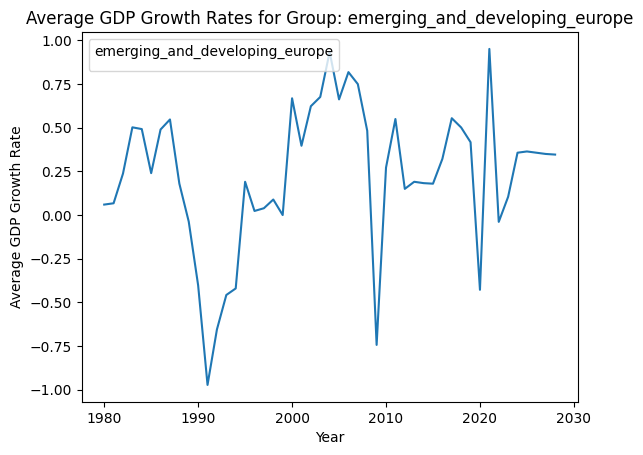

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


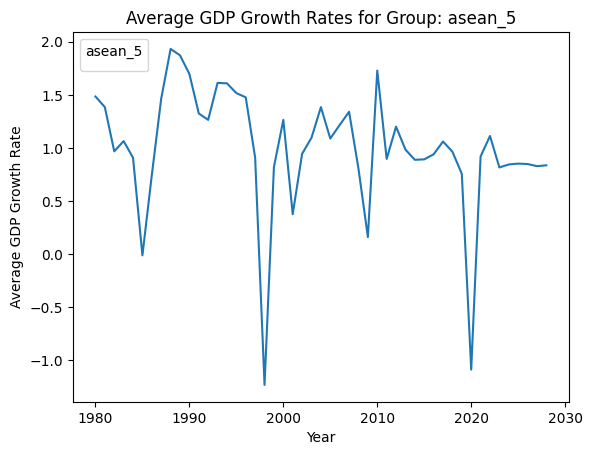

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


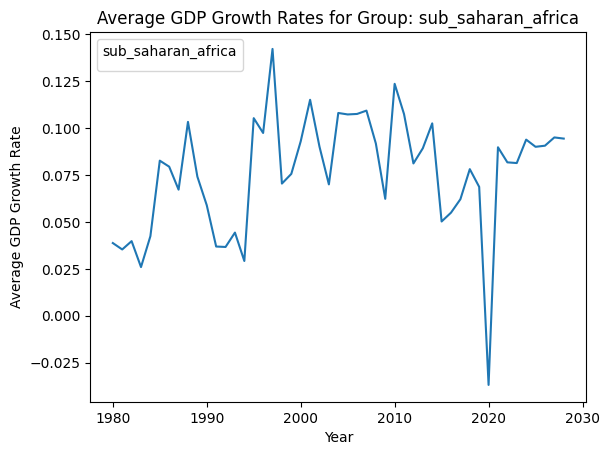

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


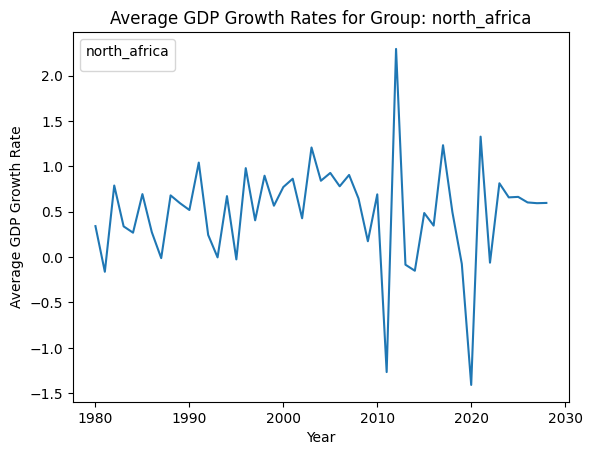

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


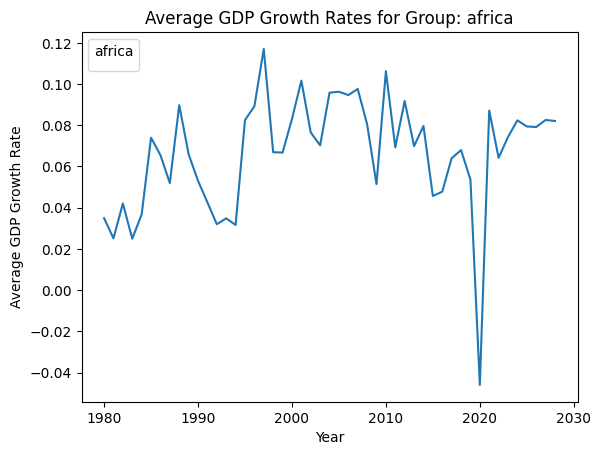

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


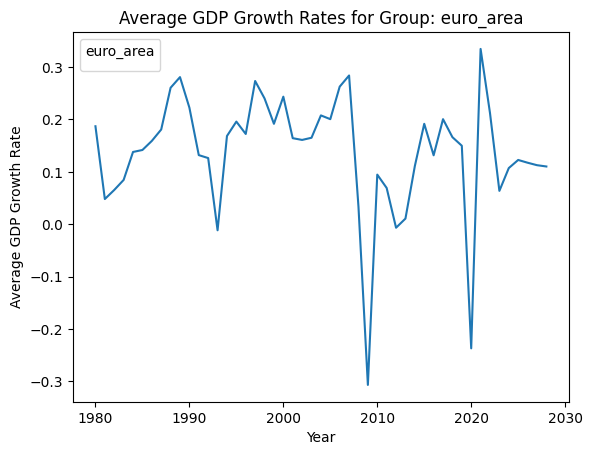

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


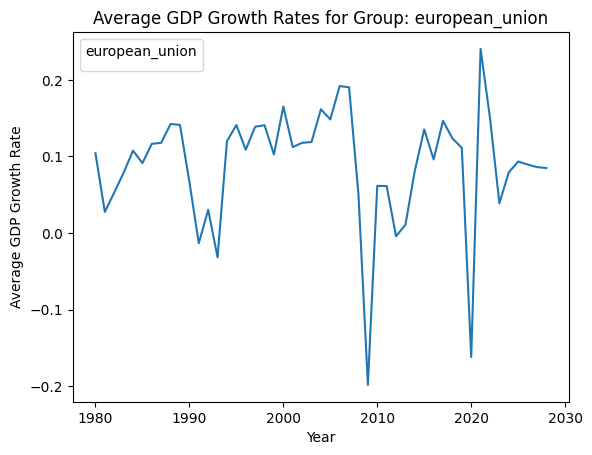

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


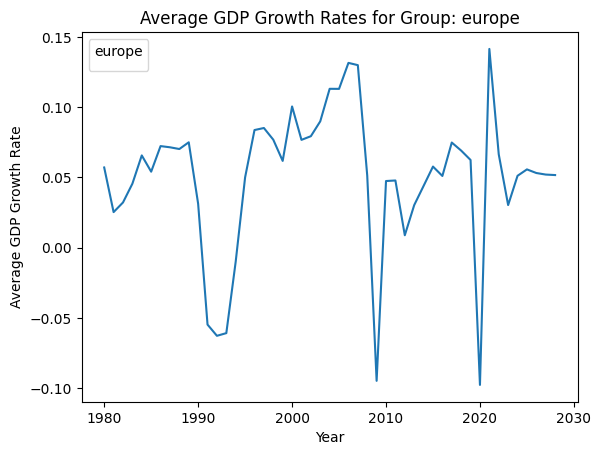

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


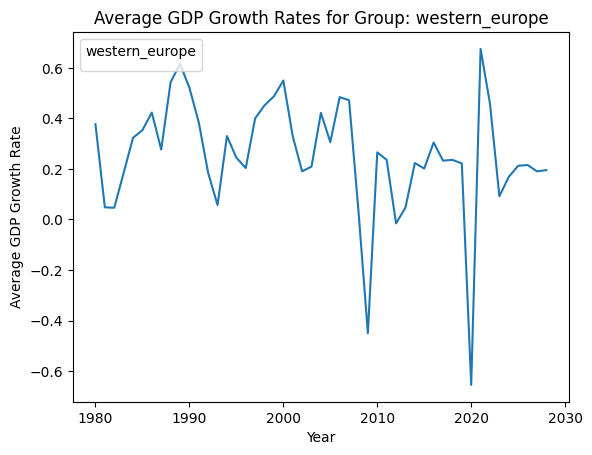

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


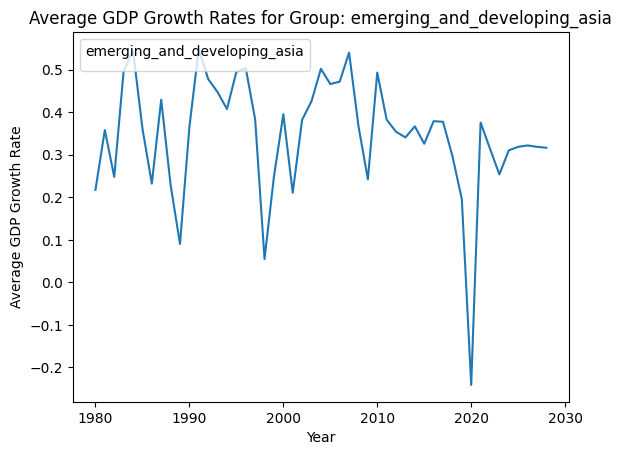

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


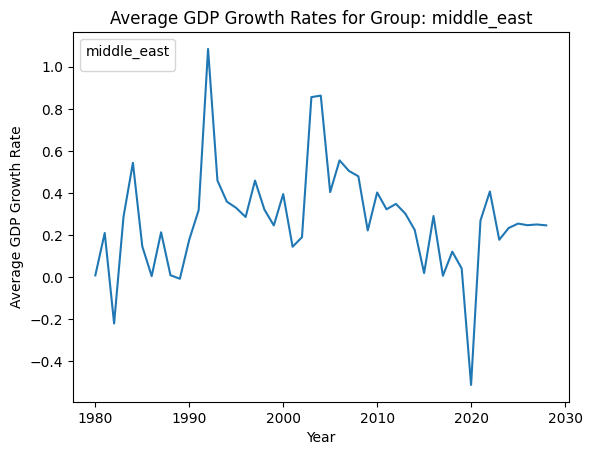

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


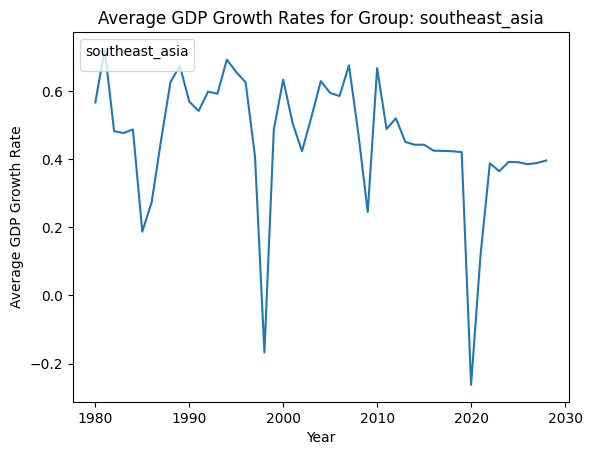

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


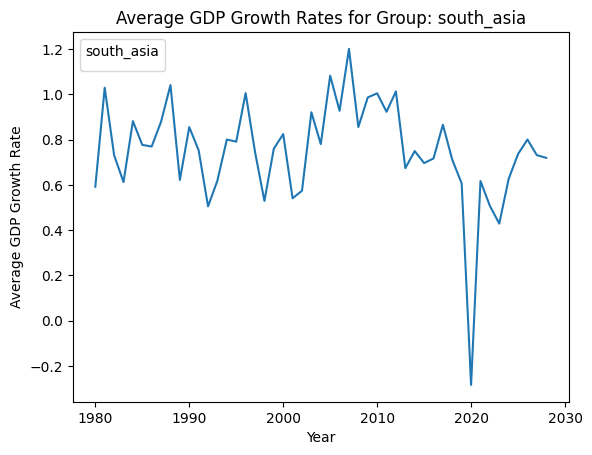

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


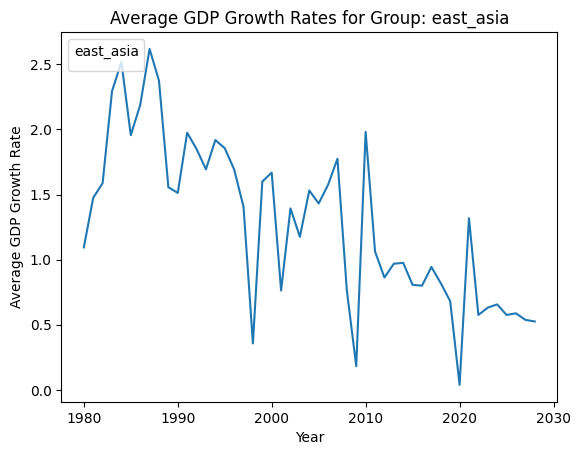

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


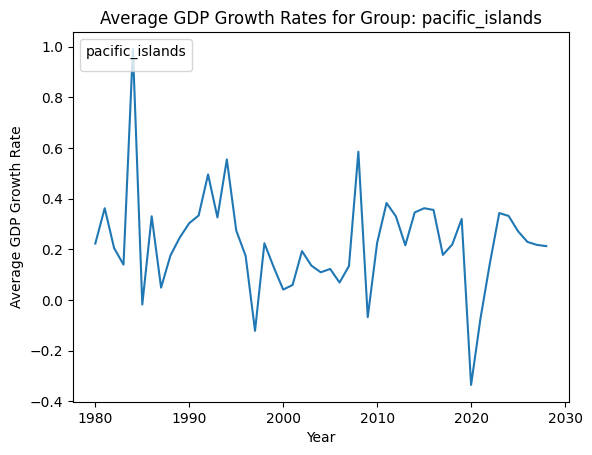

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


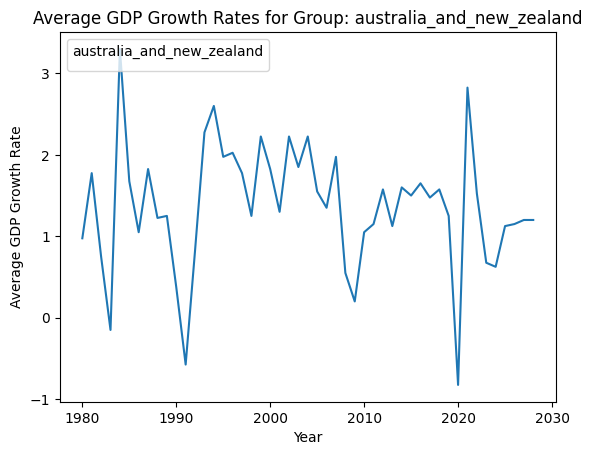

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


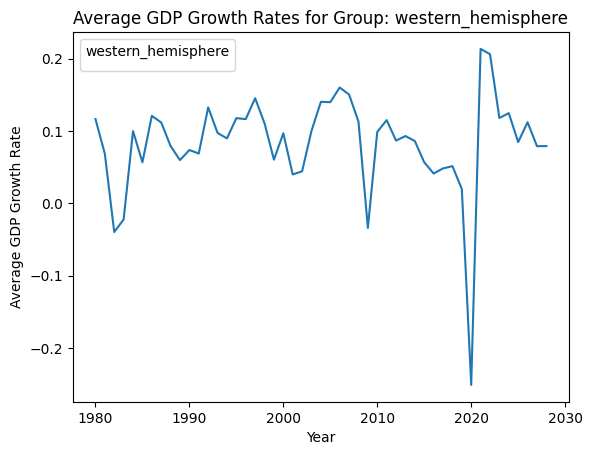

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


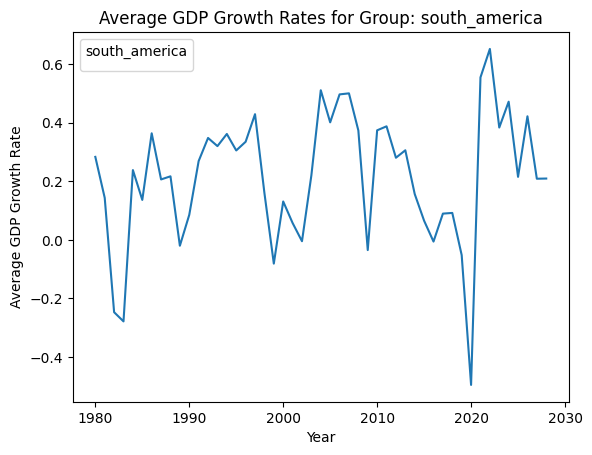

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


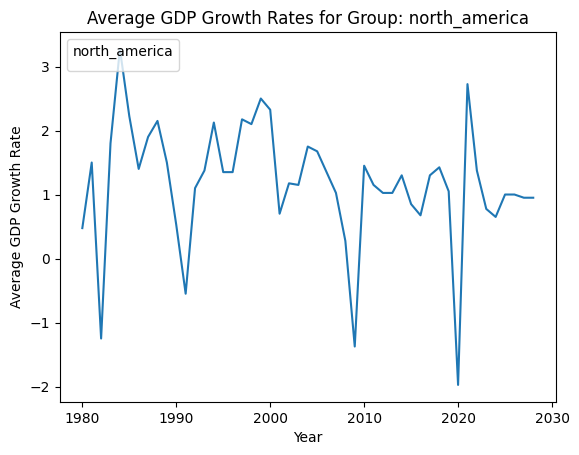

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


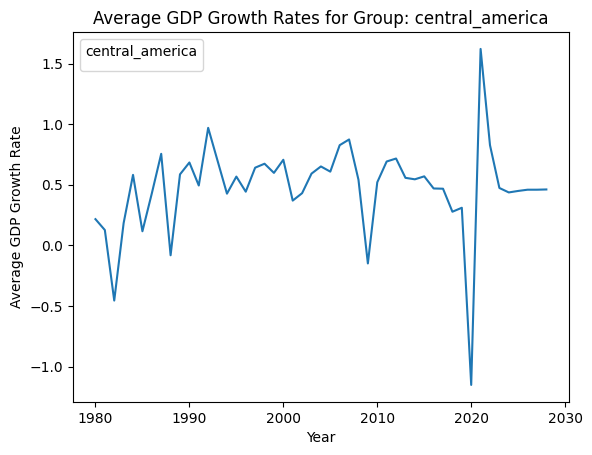

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


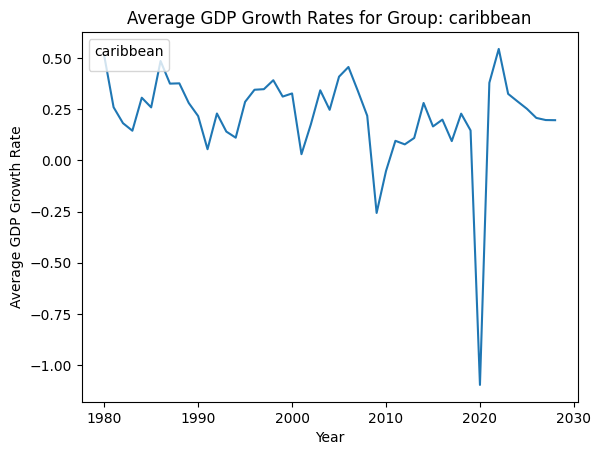

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


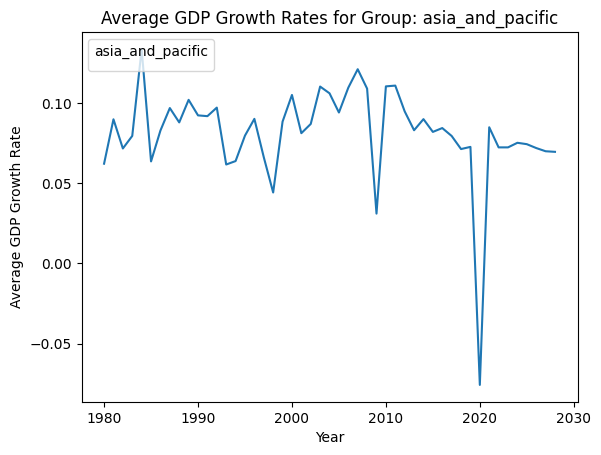

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


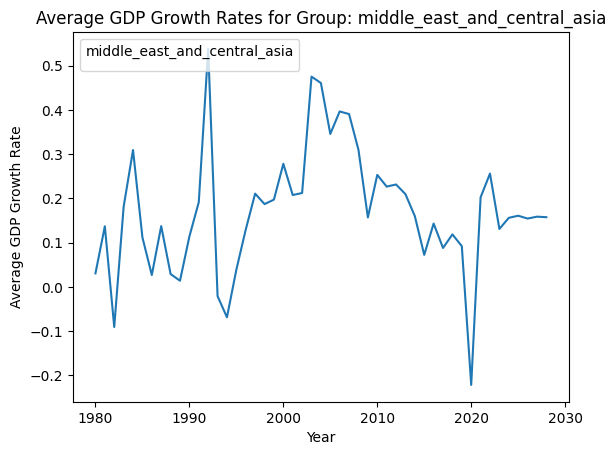

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


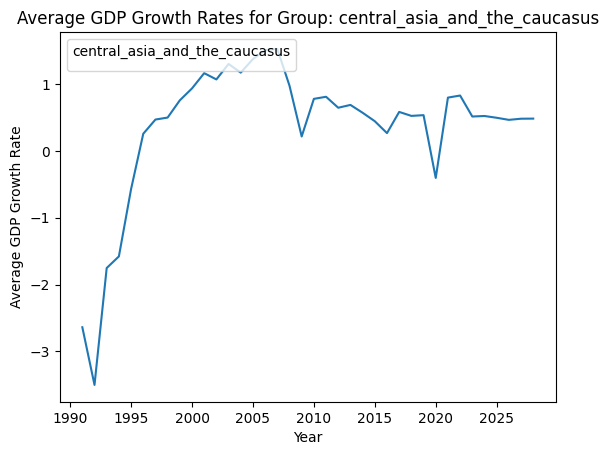

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


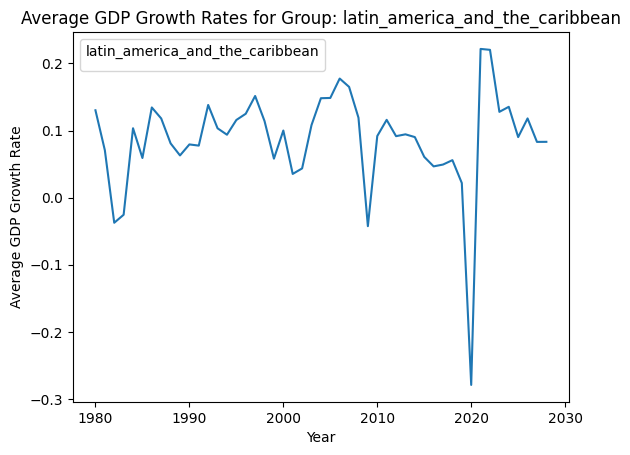

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


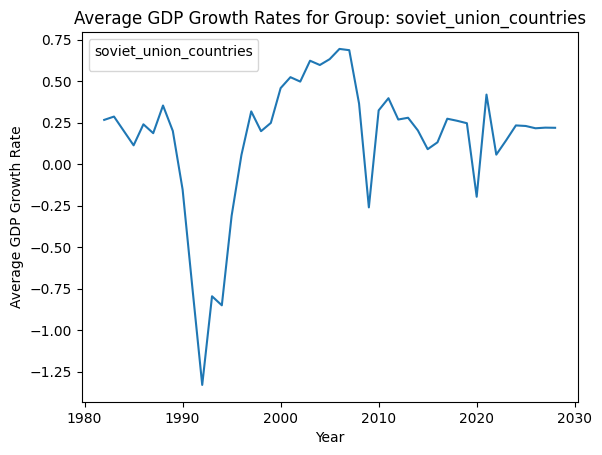

In [20]:
### TESTE
df_transpose_copy_graph2 = df_transpose_copy.copy()

# Create an empty dictionary to store group mean growth rates
group_mean_growth = {}

# Extract the years from the 'year' column
#years = df_transpose_copy_graph2['year']

# Iterate through each group
for group_name, country_list in groups.items():
    # Select the relevant columns for the current group
    selected_columns = country_list #+ ['year']
    group_data = df_transpose_copy_graph2[selected_columns]
    num_countries = len(country_list)
    
    # Calculate the mean growth rate for the group across all years
    mean_growth_rate = group_data.mean(axis=1)/num_countries
    
    # Plotting for the current group
    plt.figure()  # Create a new figure for each group
    plt.plot(#years#
        mean_growth_rate)
    plt.xlabel('Year')
    plt.ylabel('Average GDP Growth Rate')
    plt.title(f'Average GDP Growth Rates for Group: {group_name}')
    plt.legend(loc='upper left', title=group_name)

    plt.show()

### Média Movel dos grupos

In [21]:
df_transpose_copy.info()
df_transpose_copy.index = pd.to_datetime(df_transpose_copy.index, format='%Y')
df_transpose_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49 entries, 1980 to 2028
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 49 entries, 1980-01-01 to 2028-01-01
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB


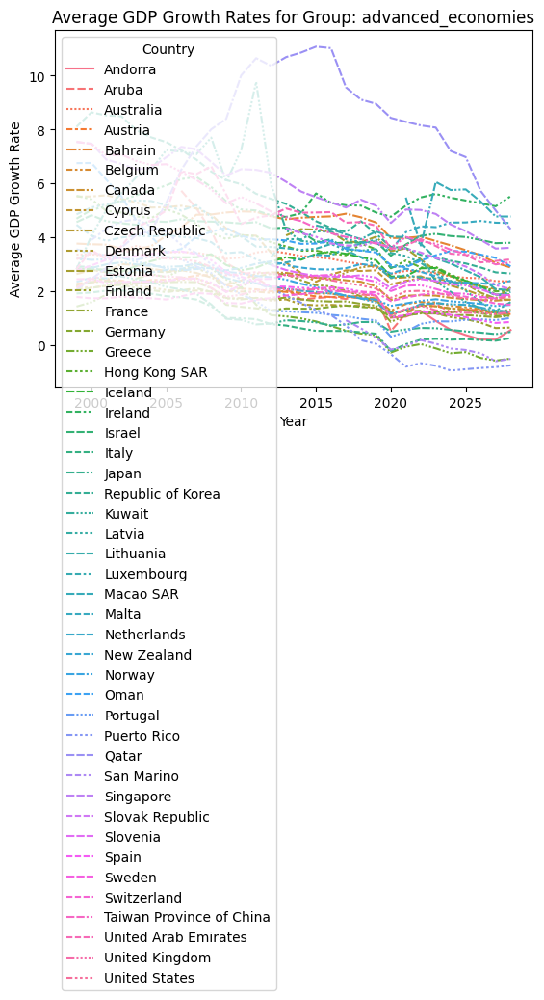

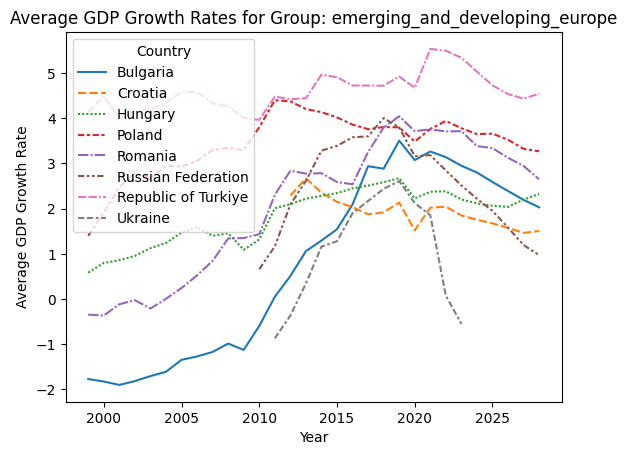

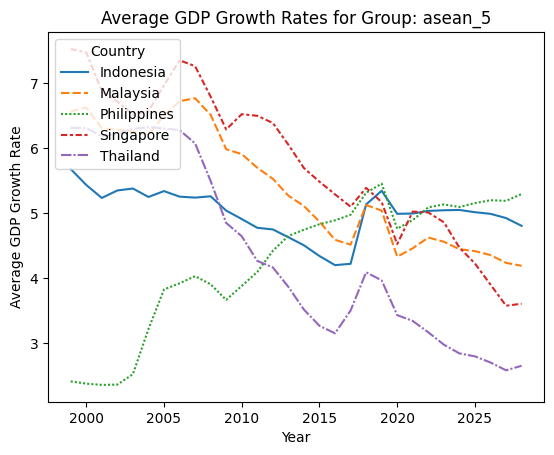

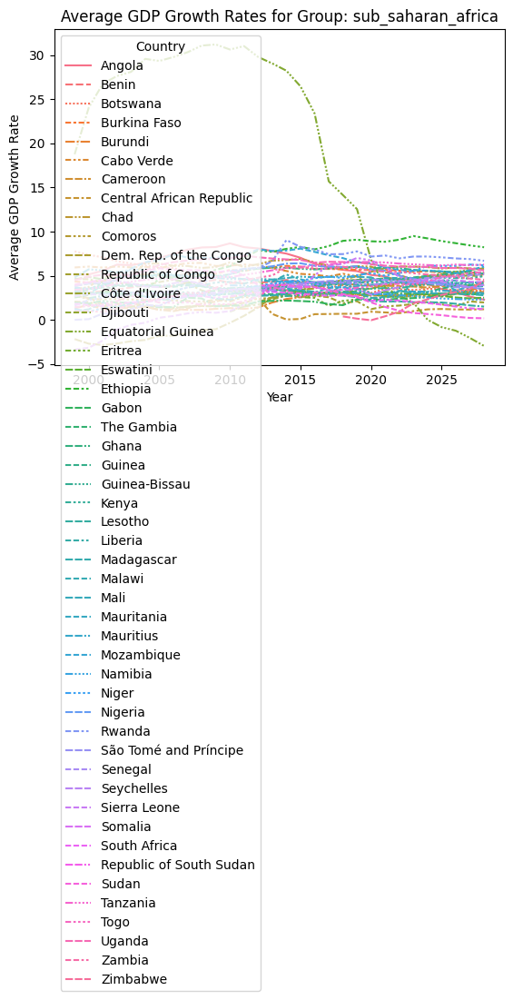

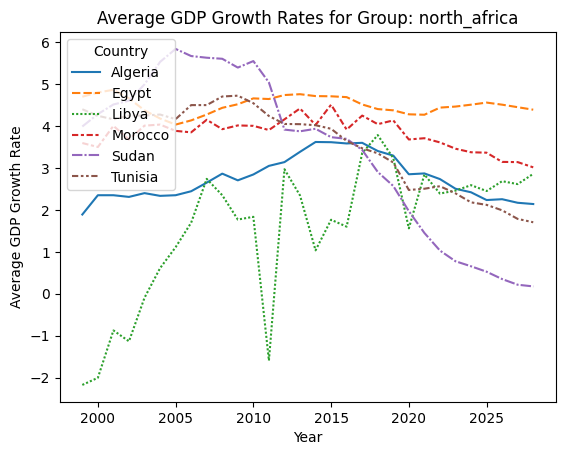

...

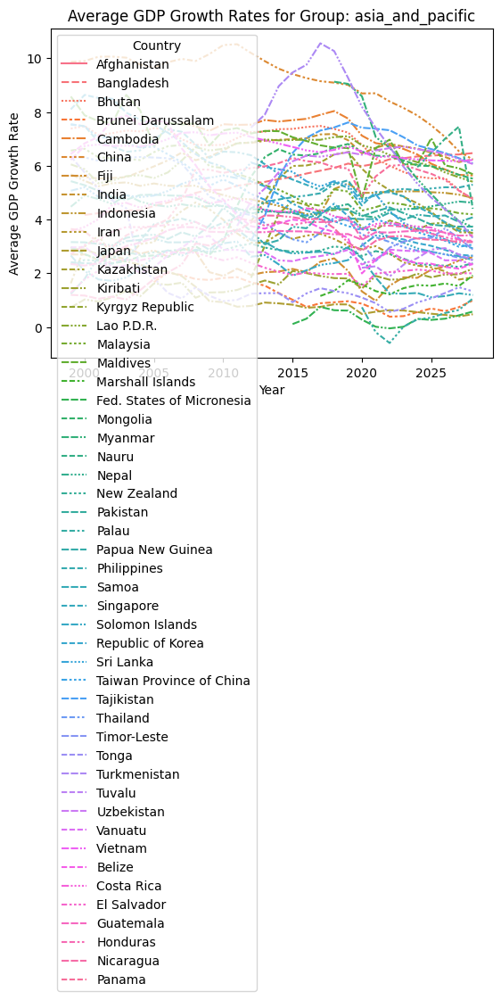

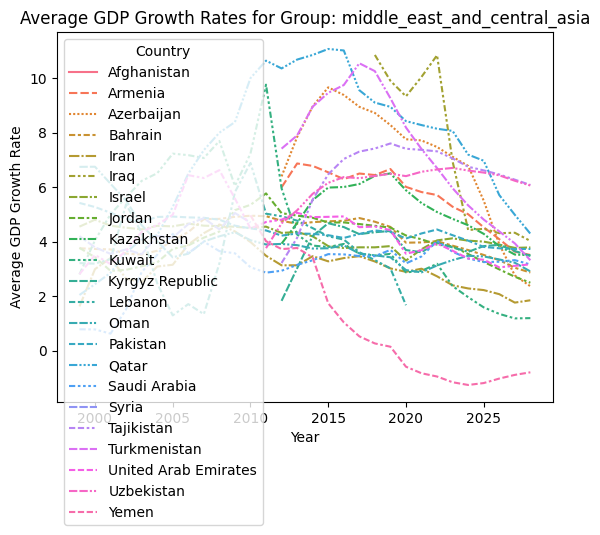

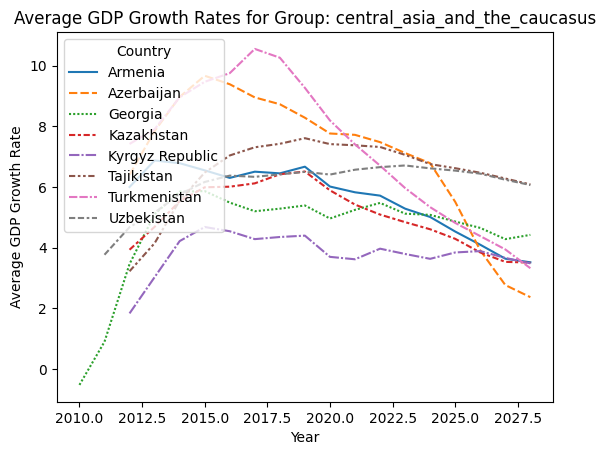

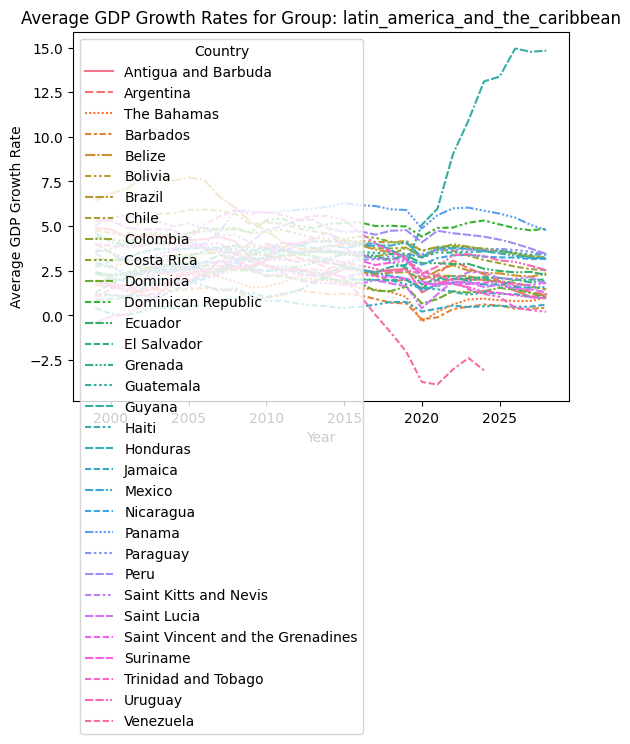

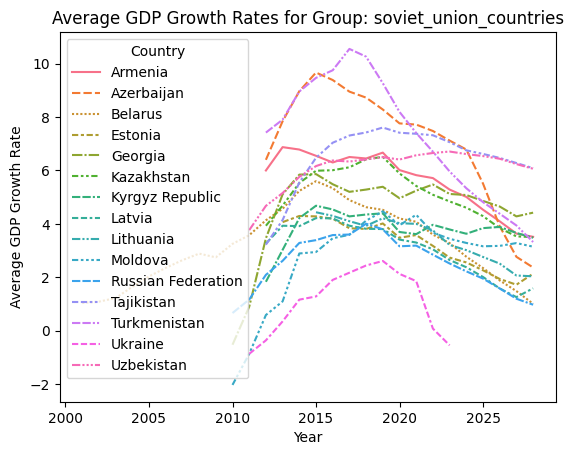

In [22]:
### TESTE MEdia Movel
df_transpose_copy_graph3 = df_transpose_copy.copy()

# Create an empty dictionary to store group mean growth rates
#group_mean_growth = {}

# Iterate through each group
for group_name, country_list in groups.items():
    # Select the relevant columns for the current group
    selected_columns = country_list 
    group_data = df_transpose_copy_graph2[selected_columns]
    num_countries = len(country_list)
    
    # Calculate the mean growth rate for the group across all years
    mean_rolling_growth_rate = group_data.rolling(20).mean()
    
    # Plotting for the current group
    plt.figure()  # Create a new figure for each group
    #sns.lineplot(data=group_data, markers=True)
    sns.lineplot(data=mean_rolling_growth_rate)
    #plt.plot(mean_rolling_growth_rate)
    plt.legend(loc='upper left', title="Country")
    plt.xlabel('Year')
    plt.ylabel('Average GDP Growth Rate')
    plt.title(f'Average GDP Growth Rates for Group: {group_name}')
    plt.show()

### Analisando a Sazonalidade

Método das diferenças. Negativo indica que houve uma queda em relação ao valor anterior. 

In [23]:
df_transpose_copy.diff()

Real GDP growth (Annual percent change),Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1981-01-01,NaN,3.0,8.4,NaN,-6.8,-4.4,-6.4,NaN,NaN,1.2,...,0.3,-1.4,NaN,-1.7,-5.5,1.1,1.7,0.4,NaN,-0.2
1982-01-01,NaN,-2.8,3.4,NaN,4.4,-3.9,2.6,NaN,NaN,-4.0,...,1.9,-0.4,NaN,0.5,-1.4,-2.1,0.6,-2.0,NaN,-1.2
1983-01-01,NaN,-1.8,-1.0,NaN,4.2,5.5,6.8,NaN,NaN,-0.6,...,3.2,0.3,NaN,1.1,-2.3,3.4,0.3,1.8,NaN,1.9
1984-01-01,NaN,0.9,0.2,NaN,1.8,4.8,-1.7,NaN,NaN,6.8,...,-0.5,2.3,NaN,0.8,6.7,1.7,-0.4,2.6,NaN,2.0
1985-01-01,NaN,-3.5,0.0,NaN,-2.5,-2.6,-9.0,NaN,NaN,-0.8,...,-1.7,-0.6,NaN,-0.3,-0.7,-1.2,0.9,-2.3,NaN,-1.0
1986-01-01,NaN,7.1,-5.8,NaN,-0.6,3.9,14.1,NaN,NaN,-3.1,...,2.0,0.8,NaN,0.5,1.1,-0.8,0.8,1.2,NaN,0.0
1987-01-01,NaN,-6.4,-0.5,NaN,1.2,-4.9,-4.6,NaN,NaN,2.5,...,0.6,-0.3,NaN,-0.1,-1.0,0.5,-2.1,1.0,NaN,0.3
1988-01-01,NaN,-0.6,-1.2,NaN,2.0,-1.4,-4.5,NaN,2.5,-0.6,...,-3.4,0.5,NaN,1.2,-2.2,1.2,3.4,-1.0,NaN,0.8


<Axes: xlabel='year'>

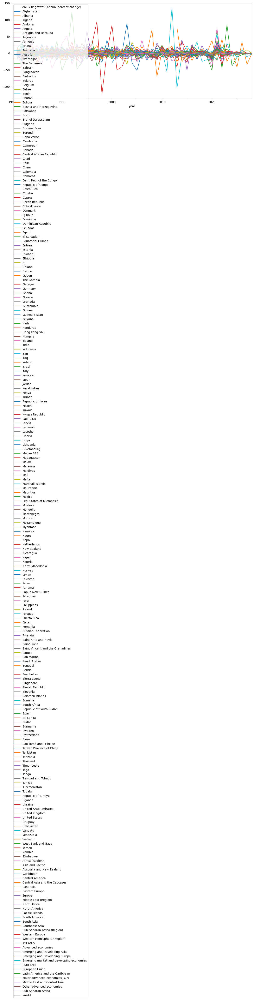

In [24]:
df_transpose_copy.diff().plot(figsize=(15,6))

Criando um filtro de datas para analisar sazonalidade

<Axes: xlabel='year'>

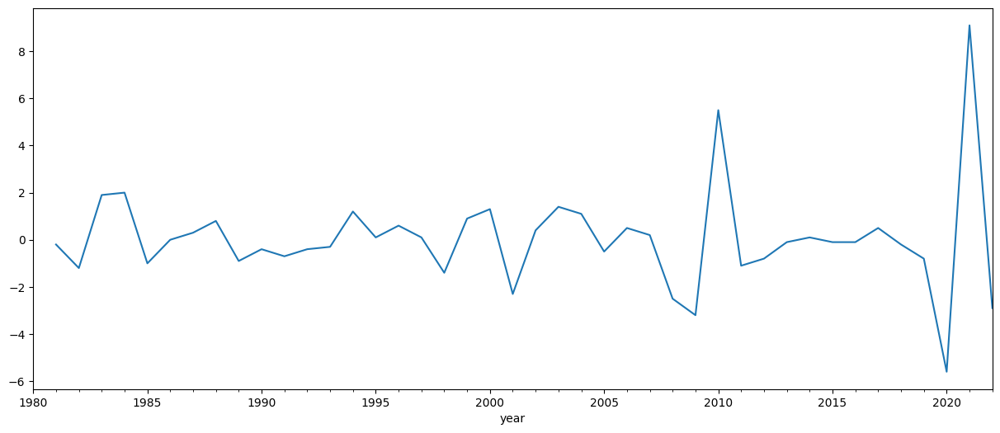

In [25]:
#Analyse the 'World' column
date_filter = (df_transpose_copy.index.year>= 1980) & (df_transpose_copy.index.year <=2022)
df_transpose_copy[date_filter].World.diff().plot(figsize=(15,6))

### Describe em grupos de países

In [26]:
for group_name, country_list in groups.items():
    # Select the relevant columns for the current group
    selected_columns = country_list 
    group_describe = df_transpose_copy_graph2[selected_columns].describe()
    #num_countries = len(country_list)
    print(group_describe)
    # Calculate the mean growth rate for the group across all years
    #mean_rolling_growth_rate = group_data.rolling(20).mean()

Real GDP growth (Annual percent change)    Andorra      Aruba  Australia  \
count                                    28.000000  42.000000  49.000000   
mean                                      1.660714   3.392857   2.932653   
std                                       4.819816   6.382002   1.596662   
min                                     -11.200000 -18.600000  -1.800000   
25%                                       0.225000   1.100000   2.300000   
50%                                       1.500000   2.300000   2.800000   
75%                                       4.575000   6.275000   4.100000   
max                                       8.900000  18.600000   6.300000   

Real GDP growth (Annual percent change)    Austria    Bahrain    Belgium  \
count                                    49.000000  49.000000  49.000000   
mean                                      1.818367   3.806122   1.795918   
std                                       1.890731   2.523507   1.794779   
min        

## Inputando dados

Como existem países com quantidades variadas de dados faltantes vamos adotar algumas estratégias para a inputação dos dados. 
1. Paises com até 5 dados faltantes, completar com a média do próprio país (Completar com a Média D-1)
2. Países que pertenciam ao regime da URSS, possuem comportamento econômico similar. Fazer o input do grupo.
3. Plotar para as demais regiões: Realiza-se a média móvel do grupo para um determinado período de ano (procurando não considerar vales de crise como 2008 ou 2020). Compara o crescimento do país com a média móvel do grupo: Se crescimento for acima da média móvel, o input dos dados ocorre somando o valor da média móvel com a variancia daquele pais; Se crescimento for abaixo da média móvel, o input dos dados ocorre subtraindo-se o valor da média móvel com a variância daquele país. 


#### Estabelecendo a divisão dos países com dados faltantes


Países com até 5 dados faltantes

In [27]:

nan_counts = df_transpose_copy.isna().sum().sort_values()

group_country_lists = set()  # List of unique countries with 5 or less missing values

for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    countries_05 = list(nan_counts_group[(nan_counts > 0) & (nan_counts <= 5)].index)
    group_country_lists.update(countries_05) # Adds the countries inside the list

    print(f"Countries in {group_name} containing 5 or less missing values:")
    print(countries_05)
    print("\n")
print(group_country_lists)

Countries in advanced_economies containing 5 or less missing values:
['Netherlands', 'Puerto Rico']


Countries in emerging_and_developing_europe containing 5 or less missing values:
[]


Countries in asean_5 containing 5 or less missing values:
[]


Countries in sub_saharan_africa containing 5 or less missing values:
['Guinea-Bissau']


Countries in north_africa containing 5 or less missing values:
[]


Countries in africa containing 5 or less missing values:
['Guinea-Bissau']


Countries in euro_area containing 5 or less missing values:
['Netherlands']


Countries in european_union containing 5 or less missing values:
['Netherlands']


Countries in europe containing 5 or less missing values:
['Belarus', 'Netherlands']


Countries in western_europe containing 5 or less missing values:
['Netherlands']


Countries in emerging_and_developing_asia containing 5 or less missing values:
['Bangladesh']


Countries in middle_east containing 5 or less missing values:
[]


Countries in southeast

Para criar o dataframe auxiliar df_countries_5 nao será considerado os países pertencentes a URSS pois para eles serão aplicados outro tipo de inputting dos dados

In [28]:
#Create an auxiliary dataframe containing the countries with 5 or less missing values to perform the simple inputting
countries_05_unique_list = list(group_country_lists)


df_countries_5 = df_transpose_copy[countries_05_unique_list].copy()
soviety_union_countries = ["Armenia","Azerbaijan","Belarus","Estonia","Georgia","Kazakhstan","Kyrgyz Republic", "Latvia","Lithuania","Moldova","Russian Federation", "Tajikistan", "Turkmenistan","Ukraine","Uzbekistan"]

countries_to_drop = [country for country in soviety_union_countries if country in countries_05_unique_list]
df_countries_5 = df_countries_5.drop(columns=countries_to_drop, axis=1)
print(df_countries_5)


Real GDP growth (Annual percent change)  Venezuela  Bangladesh  Netherlands  \
year                                                                          
1980-01-01                                    -4.9         NaN          NaN   
1981-01-01                                    -1.3         3.8         -0.5   
1982-01-01                                     2.6         2.4         -1.3   
1983-01-01                                    -9.9         4.0          1.8   
1984-01-01                                     5.2         5.2          3.1   
1985-01-01                                     0.9         3.2          2.7   
1986-01-01                                     6.1         4.2          3.1   
1987-01-01                                     4.8         3.7          1.9   
1988-01-01                                     6.5         2.2          4.6   
1989-01-01                                   -13.9         2.6          4.5   
1990-01-01                                     6.5  

In [29]:

from sklearn.impute import SimpleImputer

# Supondo que df_countries_5 seja o DataFrame com valores float

# Função para preencher NaN em uma lista com a média dos próximos 5 anos - variação progressiva
def fill_nan_with_mean_and_variance(lst):
    filled_list = lst.copy()
    for i in range(len(lst)):
        if np.isnan(lst[i]):
            non_nan_values = [value for value in lst[i+1:i+6] if not np.isnan(value)]
            next_5_mean = np.nanmean(non_nan_values)
            
            variance = (next_5_mean - lst[i-1]) * (5 / 6)
            filled_list[i] = next_5_mean - variance
    return filled_list

# Aplicar o SimpleImputer apenas nas colunas com valores float
float_columns = df_countries_5.select_dtypes(include=['float']).columns
imputer = SimpleImputer(strategy='mean')
df_countries_5[float_columns] = imputer.fit_transform(df_countries_5[float_columns])

# Aplicar a função de preenchimento personalizado apenas nas colunas com valores float
for col in float_columns:
    df_countries_5[col] = fill_nan_with_mean_and_variance(df_countries_5[col])

# Agora df_countries_5 deve conter os valores float preenchidos e ajustados de acordo com a descrição
print(df_countries_5)

Real GDP growth (Annual percent change)  Venezuela  Bangladesh  Netherlands  \
year                                                                          
1980-01-01                               -4.900000    5.372917     2.041667   
1981-01-01                               -1.300000    3.800000    -0.500000   
1982-01-01                                2.600000    2.400000    -1.300000   
1983-01-01                               -9.900000    4.000000     1.800000   
1984-01-01                                5.200000    5.200000     3.100000   
1985-01-01                                0.900000    3.200000     2.700000   
1986-01-01                                6.100000    4.200000     3.100000   
1987-01-01                                4.800000    3.700000     1.900000   
1988-01-01                                6.500000    2.200000     4.600000   
1989-01-01                              -13.900000    2.600000     4.500000   
1990-01-01                                6.500000  

In [30]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v1 = df_transpose_copy.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v1.update(df_countries_5)

print(df_transposed_copy_inputting_v1)
df_transposed_copy_inputting_v1.to_csv('Projeto/df_transposed_copy_inputting_v1.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

#### Países que pertenciam a antiga URSS

In [31]:
group_name = "soviet_union_countries"

# Select the countries from the desired group
countries_selected = groups[group_name]

#Select the correspondent columns
selected_columns = df_transpose_copy[countries_selected]
df_urss = pd.DataFrame(selected_columns)

print(df_urss)

Real GDP growth (Annual percent change)  Armenia  Azerbaijan  Belarus  \
year                                                                    
1980-01-01                                   NaN         NaN      NaN   
1981-01-01                                   NaN         NaN      NaN   
1982-01-01                                   NaN         NaN      4.0   
1983-01-01                                   NaN         NaN      4.3   
1984-01-01                                   NaN         NaN      3.0   
1985-01-01                                   NaN         NaN      1.7   
1986-01-01                                   NaN         NaN      3.6   
1987-01-01                                   NaN         NaN      2.8   
1988-01-01                                   NaN         NaN      5.3   
1989-01-01                                   NaN         NaN      3.0   
1990-01-01                                   NaN         NaN     -2.3   
1991-01-01                                   NaN   

Buscamos a primeira ocorrência não nula para os países do grupo.

In [32]:
for country in df_urss.columns:
    first_non_null_year = df_urss[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Primeira ocorrência não nula para Armenia: 1993
Primeira ocorrência não nula para Azerbaijan: 1993
Primeira ocorrência não nula para Belarus: 1982
Primeira ocorrência não nula para Estonia: 1994
Primeira ocorrência não nula para Georgia: 1991
Primeira ocorrência não nula para Kazakhstan: 1993
Primeira ocorrência não nula para Kyrgyz Republic: 1993
Primeira ocorrência não nula para Latvia: 1993
Primeira ocorrência não nula para Lithuania: 1996
Primeira ocorrência não nula para Moldova: 1991
Primeira ocorrência não nula para Russian Federation: 1991
Primeira ocorrência não nula para Tajikistan: 1993
Primeira ocorrência não nula para Turkmenistan: 1993
Primeira ocorrência não nula para Ukraine: 1992
Primeira ocorrência não nula para Uzbekistan: 1992


Agora calcula-se as médias para cada país desde a sua primeira ocorrência de valores não nulos. 

In [33]:
for country in df_urss.columns:
    first_non_null_year = df_urss[country].first_valid_index().year
    
    if first_non_null_year is not None:
        average_values = df_urss.loc[pd.Timestamp(f'{first_non_null_year}-01-01'):, country].mean()
        rounded_average = round(average_values, 2)
        print(f"Média para {country} desde {first_non_null_year}: {rounded_average}")
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")


Média para Armenia desde 1993: 5.29
Média para Azerbaijan desde 1993: 4.46
Média para Belarus desde 1982: 2.18
Média para Estonia desde 1994: 3.55
Média para Georgia desde 1991: 1.98
Média para Kazakhstan desde 1993: 3.55
Média para Kyrgyz Republic desde 1993: 2.72
Média para Latvia desde 1993: 2.95
Média para Lithuania desde 1996: 3.75
Média para Moldova desde 1991: 0.56
Média para Russian Federation desde 1991: 0.94
Média para Tajikistan desde 1993: 4.47
Média para Turkmenistan desde 1993: 4.82
Média para Ukraine desde 1992: -1.74
Média para Uzbekistan desde 1992: 4.7


Agora esses valores encontrados anteriormente são inseridos nas primeiras ocorrências nulas respectivamente. 

In [34]:
for country in df_urss.columns:
    first_non_null_year = df_urss[country].first_valid_index().year
    
    if first_non_null_year is not None:
        average_values = df_urss.loc[pd.Timestamp(f'{first_non_null_year}-01-01'):, country].mean()
        rounded_average = round(average_values, 2)
        
        null_indices = df_urss[df_urss[country].isnull()].index
        if null_indices.empty:
            print(f"Não há valores nulos para preencher em {country}")
        else:
            first_null_index = null_indices[0]
            df_urss.at[first_null_index, country] = rounded_average
            print(f"Média de {rounded_average} preenchida em {country} na data {first_null_index}")
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")


Média de 5.29 preenchida em Armenia na data 1980-01-01 00:00:00
Média de 4.46 preenchida em Azerbaijan na data 1980-01-01 00:00:00
Média de 2.18 preenchida em Belarus na data 1980-01-01 00:00:00
Média de 3.55 preenchida em Estonia na data 1980-01-01 00:00:00
Média de 1.98 preenchida em Georgia na data 1980-01-01 00:00:00
Média de 3.55 preenchida em Kazakhstan na data 1980-01-01 00:00:00
Média de 2.72 preenchida em Kyrgyz Republic na data 1980-01-01 00:00:00
Média de 2.95 preenchida em Latvia na data 1980-01-01 00:00:00
Média de 3.75 preenchida em Lithuania na data 1980-01-01 00:00:00
Média de 0.56 preenchida em Moldova na data 1980-01-01 00:00:00
Média de 0.94 preenchida em Russian Federation na data 1980-01-01 00:00:00
Média de 4.47 preenchida em Tajikistan na data 1980-01-01 00:00:00
Média de 4.82 preenchida em Turkmenistan na data 1980-01-01 00:00:00
Média de -1.74 preenchida em Ukraine na data 1980-01-01 00:00:00
Média de 4.7 preenchida em Uzbekistan na data 1980-01-01 00:00:00


Neste passo realiza-se uma interpolação para preencher os dados faltantes no dataframe auxiliar.

In [35]:
for country in df_urss.columns:
    df_urss[country].interpolate(inplace=True)

print(df_urss)


Real GDP growth (Annual percent change)    Armenia  Azerbaijan  Belarus  \
year                                                                      
1980-01-01                                5.290000        4.46     2.18   
1981-01-01                                3.798462        2.34     3.09   
1982-01-01                                2.306923        0.22     4.00   
1983-01-01                                0.815385       -1.90     4.30   
1984-01-01                               -0.676154       -4.02     3.00   
1985-01-01                               -2.167692       -6.14     1.70   
1986-01-01                               -3.659231       -8.26     3.60   
1987-01-01                               -5.150769      -10.38     2.80   
1988-01-01                               -6.642308      -12.50     5.30   
1989-01-01                               -8.133846      -14.62     3.00   
1990-01-01                               -9.625385      -16.74    -2.30   
1991-01-01               

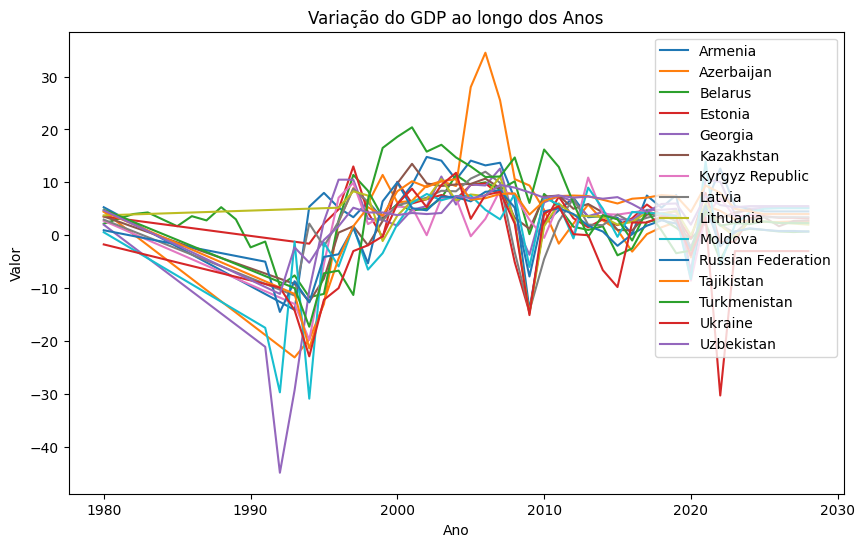

In [36]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_urss.columns:
    plt.plot(df_urss.index, df_urss[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [37]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v2 = df_transposed_copy_inputting_v1.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v2.update(df_urss)

print(df_transposed_copy_inputting_v2)
df_transposed_copy_inputting_v2.to_csv('Projeto/df_transposed_copy_inputting_v2.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [38]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v2.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for emerging_and_developing_asia: 8
Sum of NaN occurrences for emerging_and_developing_europe: 13
Sum of NaN occurrences for western_europe: 21
Sum of NaN occurrences for euro_area: 27
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for southeast_asia: 54
Sum of NaN occurrences for european_union: 56
Sum of NaN occurrences for middle_east: 56
Sum of NaN occurrences for middle_east_a

### Países da Asia emergente

In [39]:
for group_name, group_countries in groups.items():
    countries_names = groups['emerging_and_developing_asia']
print(countries_names)

['Bangladesh', 'China', 'India', 'Indonesia', 'Iran', 'Jordan', 'Lebanon', 'Malaysia', 'Pakistan', 'Philippines', 'Sri Lanka', 'Thailand', 'Republic of Turkiye', 'Vietnam']


In [40]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v2.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['emerging_and_developing_asia']
    nan_counts_group = nan_counts[countries_names]

    #nan_counts_group = countries_names['emerging_and_developing_asia']

    #nan_sum = nan_counts_group.sum()
    #nan_sums[group_name] = nan_sum
print(nan_counts_group)

Real GDP growth (Annual percent change)
Bangladesh             0
China                  0
India                  0
Indonesia              0
Iran                   0
Jordan                 0
Lebanon                8
Malaysia               0
Pakistan               0
Philippines            0
Sri Lanka              0
Thailand               0
Republic of Turkiye    0
Vietnam                0
dtype: int64


In [41]:
group_name = "emerging_and_developing_asia"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v2[country_group_selected]
df_emerging_asia = pd.DataFrame(selected_columns)

print(df_emerging_asia)

Real GDP growth (Annual percent change)  Bangladesh  China  India  Indonesia  \
year                                                                           
1980-01-01                                 5.372917    7.9    5.3        9.9   
1981-01-01                                 3.800000    5.1    6.0        7.6   
1982-01-01                                 2.400000    9.0    3.5        2.2   
1983-01-01                                 4.000000   10.8    7.3        4.2   
1984-01-01                                 5.200000   15.2    3.8        7.6   
1985-01-01                                 3.200000   13.5    5.3        3.9   
1986-01-01                                 4.200000    8.9    4.8        7.2   
1987-01-01                                 3.700000   11.7    4.0        6.6   
1988-01-01                                 2.200000   11.2    9.6        7.0   
1989-01-01                                 2.600000    4.2    5.9        9.1   
1990-01-01                              

In [42]:

for country in df_emerging_asia.columns:
    last_non_null_year = df_emerging_asia[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


Ultima ocorrência não nula para Bangladesh: 2028
Ultima ocorrência não nula para China: 2028
Ultima ocorrência não nula para India: 2028
Ultima ocorrência não nula para Indonesia: 2028
Ultima ocorrência não nula para Iran: 2028
Ultima ocorrência não nula para Jordan: 2028
Ultima ocorrência não nula para Lebanon: 2020
Ultima ocorrência não nula para Malaysia: 2028
Ultima ocorrência não nula para Pakistan: 2028
Ultima ocorrência não nula para Philippines: 2028
Ultima ocorrência não nula para Sri Lanka: 2028
Ultima ocorrência não nula para Thailand: 2028
Ultima ocorrência não nula para Republic of Turkiye: 2028
Ultima ocorrência não nula para Vietnam: 2028


Lebanon possui dados nulos faltantes a partir de 2020.

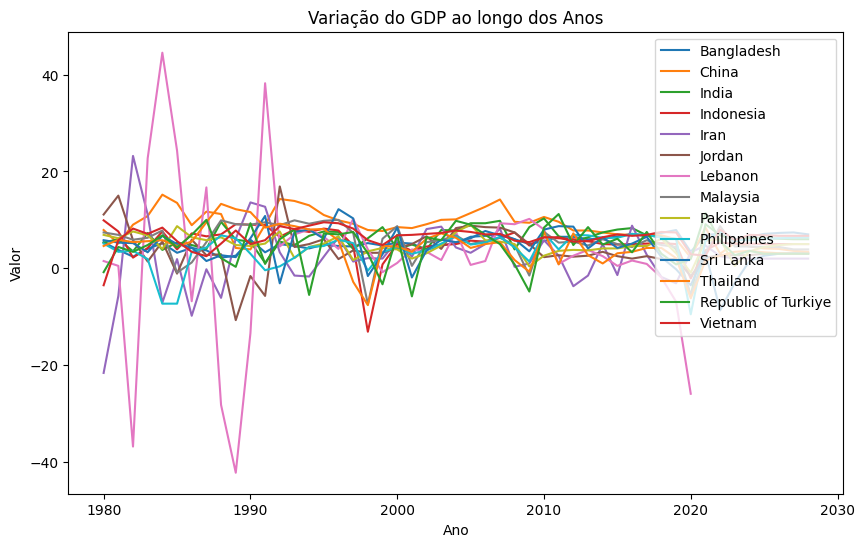

In [43]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_emerging_asia.columns:
    plt.plot(df_emerging_asia.index, df_emerging_asia[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [44]:
for country in df_emerging_asia.columns:
    last_non_null_year = df_emerging_asia[country].last_valid_index().year
    
    if last_non_null_year is not None:
        average_values = df_emerging_asia.loc[pd.Timestamp(f'{last_non_null_year}-01-01'):, country].mean()
        rounded_average = round(average_values, 2)
        print(f"Média para {country} desde {last_non_null_year}: {rounded_average}")
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")


Média para Bangladesh desde 2028: 7.0
Média para China desde 2028: 3.4
Média para India desde 2028: 6.0
Média para Indonesia desde 2028: 5.0
Média para Iran desde 2028: 2.0
Média para Jordan desde 2028: 3.0
Média para Lebanon desde 2020: -25.9
Média para Malaysia desde 2028: 3.9
Média para Pakistan desde 2028: 5.0
Média para Philippines desde 2028: 6.4
Média para Sri Lanka desde 2028: 3.1
Média para Thailand desde 2028: 3.1
Média para Republic of Turkiye desde 2028: 3.0
Média para Vietnam desde 2028: 6.7


In [45]:
# Create an auxiliary dataframe only containing Lebanon data because the NaN values are in the future, not in the past. 
# In this case the inputting method it will be an interpolation with the average values from the last 3 years of non values,
# using the growth_rate of 0.07 (searched in the web)

df_lebanon1 = df_emerging_asia[['Lebanon']]

growth_rate = 0.07

for country in df_lebanon1.columns:
    last_non_null_year = df_lebanon1[country].last_valid_index().year
    
    if last_non_null_year is not None:
        average_values = df_lebanon1.loc[pd.Timestamp(f'{last_non_null_year}-01-01'):, country].mean()
        
        # Calculate the last 3 years with no NaN values
        last_years = df_lebanon1[country][df_lebanon1[country].notnull()].index[-5:]
        mean_last_years = df_lebanon1.loc[last_years, country].mean()
        
        # Input the missing data with an interpolation with growth rate
        for index in df_lebanon1.index:
            if pd.isnull(df_lebanon1.at[index, country]):
                year_difference = index.year - last_years[-1].year
                interpolated_value = (mean_last_years * (1 + growth_rate) ** year_difference)
                df_lebanon1.at[index, country] = interpolated_value
        
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")
print(df_lebanon1)

Real GDP growth (Annual percent change)    Lebanon
year                                              
1980-01-01                                1.500000
1981-01-01                                0.500000
1982-01-01                              -36.800000
1983-01-01                               22.700000
1984-01-01                               44.500000
1985-01-01                               24.300000
1986-01-01                               -6.800000
1987-01-01                               16.700000
1988-01-01                              -28.200000
1989-01-01                              -42.200000
1990-01-01                              -13.400000
1991-01-01                               38.200000
1992-01-01                                4.500000
1993-01-01                                7.000000
1994-01-01                                8.000000
1995-01-01                                6.500000
1996-01-01                                4.000000
1997-01-01                     

In [46]:
# Update the original dataframe. But for security it will be updated a copy of the df_transposed_copy_inputting_v2 dataframe

#df_transposed_copy_inputting_v3 = df_emerging_asia.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_emerging_asia.update(df_lebanon1)

print(df_emerging_asia)
#df_transposed_copy_inputting_v3.to_csv('Projeto/df_transposed_copy_inputting_v3.csv')

Real GDP growth (Annual percent change)  Bangladesh  China  India  Indonesia  \
year                                                                           
1980-01-01                                 5.372917    7.9    5.3        9.9   
1981-01-01                                 3.800000    5.1    6.0        7.6   
1982-01-01                                 2.400000    9.0    3.5        2.2   
1983-01-01                                 4.000000   10.8    7.3        4.2   
1984-01-01                                 5.200000   15.2    3.8        7.6   
1985-01-01                                 3.200000   13.5    5.3        3.9   
1986-01-01                                 4.200000    8.9    4.8        7.2   
1987-01-01                                 3.700000   11.7    4.0        6.6   
1988-01-01                                 2.200000   11.2    9.6        7.0   
1989-01-01                                 2.600000    4.2    5.9        9.1   
1990-01-01                              

In [47]:
# Update the original dataframe. But for security it will be updated a copy of the df_transposed_copy_inputting_v2 dataframe

df_transposed_copy_inputting_v3 = df_transposed_copy_inputting_v2.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v3.update(df_lebanon1)

print(df_transposed_copy_inputting_v3)
df_transposed_copy_inputting_v3.to_csv('Projeto/df_transposed_copy_inputting_v3.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

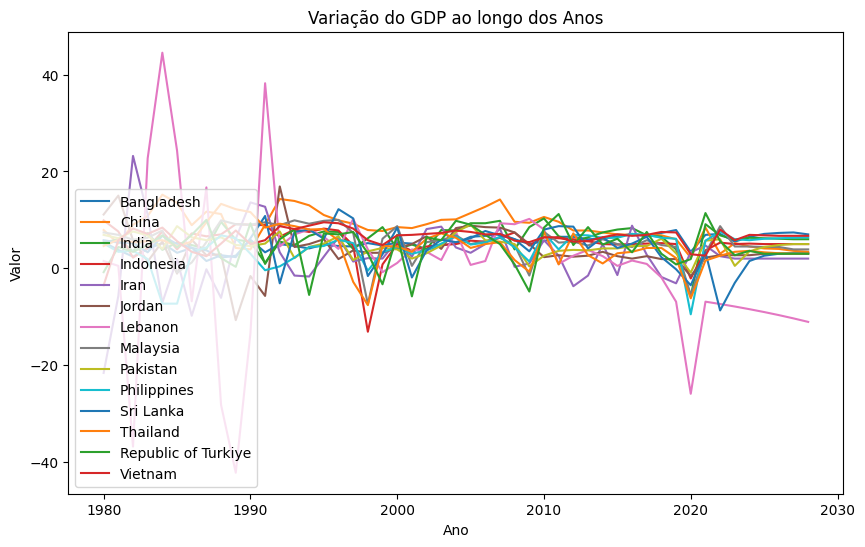

In [48]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_emerging_asia.columns:
    plt.plot(df_emerging_asia.index, df_emerging_asia[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

##### Demonstração para caso fosse realizada uma interpolação simples dos valores do último ano com valor válido

O df resultante desta operação a seguir é utilizado apenas como demonstração do que aconteceria se realizasse apenas uma interpolação simples

In [49]:

df_lebanon = df_emerging_asia[['Lebanon']]

for country in df_lebanon.columns:
    last_non_null_year = df_lebanon[country].last_valid_index().year
    
    if last_non_null_year is not None:
        average_values = df_lebanon.loc[pd.Timestamp(f'{last_non_null_year}-01-01'):, country].mean()
        rounded_average = round(average_values, 2)
        
        null_indices = df_lebanon[df_lebanon[country].isnull()].index
        if null_indices.empty:
            print(f"Não há valores nulos para preencher em {country}")
        else:
            first_null_index = null_indices[0]
            df_lebanon.at[first_null_index, country] = rounded_average
            print(f"Média de {rounded_average} preenchida em {country} na data {first_null_index}")
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")

print(df_lebanon)

Não há valores nulos para preencher em Lebanon
Real GDP growth (Annual percent change)    Lebanon
year                                              
1980-01-01                                1.500000
1981-01-01                                0.500000
1982-01-01                              -36.800000
1983-01-01                               22.700000
1984-01-01                               44.500000
1985-01-01                               24.300000
1986-01-01                               -6.800000
1987-01-01                               16.700000
1988-01-01                              -28.200000
1989-01-01                              -42.200000
1990-01-01                              -13.400000
1991-01-01                               38.200000
1992-01-01                                4.500000
1993-01-01                                7.000000
1994-01-01                                8.000000
1995-01-01                                6.500000
1996-01-01                         

In [50]:
for country in df_lebanon.columns:
    df_lebanon[country].interpolate(inplace=True)

print(df_lebanon)


Real GDP growth (Annual percent change)    Lebanon
year                                              
1980-01-01                                1.500000
1981-01-01                                0.500000
1982-01-01                              -36.800000
1983-01-01                               22.700000
1984-01-01                               44.500000
1985-01-01                               24.300000
1986-01-01                               -6.800000
1987-01-01                               16.700000
1988-01-01                              -28.200000
1989-01-01                              -42.200000
1990-01-01                              -13.400000
1991-01-01                               38.200000
1992-01-01                                4.500000
1993-01-01                                7.000000
1994-01-01                                8.000000
1995-01-01                                6.500000
1996-01-01                                4.000000
1997-01-01                     

/tmp/ipykernel_303398/2627534738.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lebanon[country].interpolate(inplace=True)


In [51]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v3.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for emerging_and_developing_europe: 13
Sum of NaN occurrences for western_europe: 21
Sum of NaN occurrences for euro_area: 27
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for middle_east: 48
Sum of NaN occurrences for southeast_asia: 54
Sum of NaN occurrences for european_union: 56
Sum of NaN occurrences for middle_east_a

### Países da europa emergente

In [52]:
for group_name, group_countries in groups.items():
    countries_names = groups['emerging_and_developing_europe']
print(countries_names)

['Bulgaria', 'Croatia', 'Hungary', 'Poland', 'Romania', 'Russian Federation', 'Republic of Turkiye', 'Ukraine']


In [53]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v3.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['emerging_and_developing_europe']
    nan_counts_group = nan_counts[countries_names]

    #nan_counts_group = countries_names['emerging_and_developing_asia']

    #nan_sum = nan_counts_group.sum()
    #nan_sums[group_name] = nan_sum
print(nan_counts_group)

Real GDP growth (Annual percent change)
Bulgaria                0
Croatia                13
Hungary                 0
Poland                  0
Romania                 0
Russian Federation      0
Republic of Turkiye     0
Ukraine                 0
dtype: int64


In [54]:
group_name = "emerging_and_developing_europe"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v3[country_group_selected]
df_emerging_europe = pd.DataFrame(selected_columns)

print(df_emerging_europe)

Real GDP growth (Annual percent change)  Bulgaria  Croatia  Hungary  Poland  \
year                                                                          
1980-01-01                                    5.7      NaN      0.2    -6.0   
1981-01-01                                    5.3      NaN      2.9   -10.0   
1982-01-01                                    4.2      NaN      2.8    -4.8   
1983-01-01                                    3.0      NaN      0.7     5.6   
1984-01-01                                    4.6      NaN      2.7    -0.4   
1985-01-01                                    1.8      NaN     -0.3     3.9   
1986-01-01                                    5.3      NaN      1.5     3.5   
1987-01-01                                    4.7      NaN      4.1     2.3   
1988-01-01                                    2.4      NaN     -0.1     3.3   
1989-01-01                                   -0.5      NaN      0.7     3.8   
1990-01-01                                   -9.1   

In [55]:

for country in df_emerging_europe.columns:
    last_non_null_year = df_emerging_europe[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


Ultima ocorrência não nula para Bulgaria: 2028
Ultima ocorrência não nula para Croatia: 2028
Ultima ocorrência não nula para Hungary: 2028
Ultima ocorrência não nula para Poland: 2028
Ultima ocorrência não nula para Romania: 2028
Ultima ocorrência não nula para Russian Federation: 2028
Ultima ocorrência não nula para Republic of Turkiye: 2028
Ultima ocorrência não nula para Ukraine: 2028


In [56]:

for country in df_emerging_europe.columns:
    first_non_null_year = df_emerging_europe[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Primeira ocorrência não nula para Bulgaria: 1980
Primeira ocorrência não nula para Croatia: 1993
Primeira ocorrência não nula para Hungary: 1980
Primeira ocorrência não nula para Poland: 1980
Primeira ocorrência não nula para Romania: 1980
Primeira ocorrência não nula para Russian Federation: 1980
Primeira ocorrência não nula para Republic of Turkiye: 1980
Primeira ocorrência não nula para Ukraine: 1980


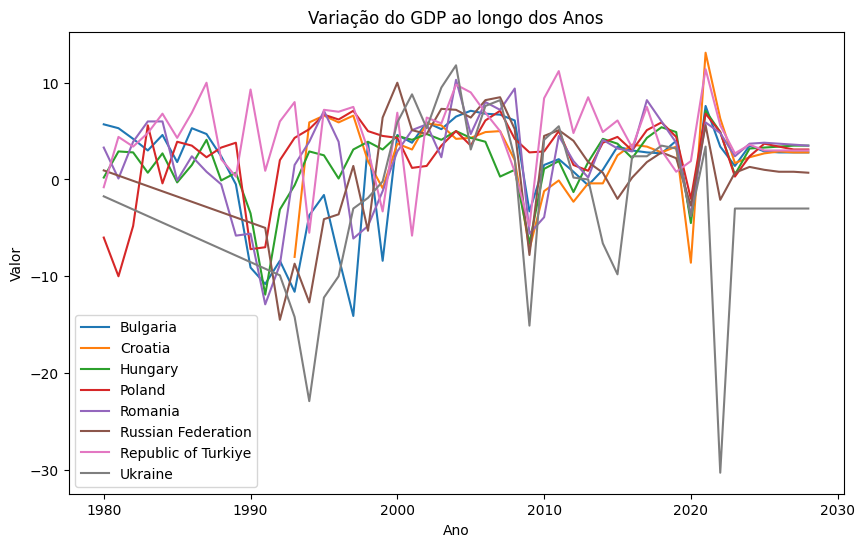

In [57]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_emerging_europe.columns:
    plt.plot(df_emerging_europe.index, df_emerging_europe[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [58]:
for country in df_emerging_europe.columns:
    first_non_null_year = df_emerging_europe[country].first_valid_index().year
    
    if first_non_null_year is not None:
        average_values = df_emerging_europe.loc[pd.Timestamp(f'{first_non_null_year}-01-01'):, country].mean()
        rounded_average = round(average_values, 2)
        print(f"Média para {country} desde {first_non_null_year}: {rounded_average}")
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")


Média para Bulgaria desde 1980: 1.18
Média para Croatia desde 1993: 2.41
Média para Hungary desde 1980: 1.84
Média para Poland desde 1980: 2.65
Média para Romania desde 1980: 2.08
Média para Russian Federation desde 1980: 0.34
Média para Republic of Turkiye desde 1980: 4.45
Média para Ukraine desde 1980: -2.79


In [59]:
for country in df_emerging_europe.columns:
    first_non_null_year = df_emerging_europe[country].first_valid_index().year
    
    if first_non_null_year is not None:
        average_values = df_emerging_europe.loc[pd.Timestamp(f'{first_non_null_year}-01-01'):, country].mean()
        rounded_average = round(average_values, 2)
        
        null_indices = df_emerging_europe[df_emerging_europe[country].isnull()].index
        if null_indices.empty:
            print(f"Não há valores nulos para preencher em {country}")
        else:
            first_null_index = null_indices[0]
            df_emerging_europe.at[first_null_index, country] = rounded_average
            print(f"Média de {rounded_average} preenchida em {country} na data {first_null_index}")
    else:
        print(f"Não há dados suficientes para calcular a média em {country}")


Não há valores nulos para preencher em Bulgaria
Média de 2.41 preenchida em Croatia na data 1980-01-01 00:00:00
Não há valores nulos para preencher em Hungary
Não há valores nulos para preencher em Poland
Não há valores nulos para preencher em Romania
Não há valores nulos para preencher em Russian Federation
Não há valores nulos para preencher em Republic of Turkiye
Não há valores nulos para preencher em Ukraine


In [60]:
for column in df_emerging_europe.columns:
    missing_rows = df_emerging_europe[df_emerging_europe[column].isna()]
    aux = missing_rows.drop(columns=[column]).mean(axis=1)
    df_emerging_europe.loc[missing_rows.index, column] = aux
df_emerging_europe

Real GDP growth (Annual percent change),Bulgaria,Croatia,Hungary,Poland,Romania,Russian Federation,Republic of Turkiye,Ukraine
year,,,,,,,,
1980-01-01,5.7,2.410000,0.2,-6.0,3.3,0.94,-0.8,-1.74
1981-01-01,5.3,0.097143,2.9,-10.0,0.1,0.40,4.4,-2.42
1982-01-01,4.2,0.894286,2.8,-4.8,3.9,-0.14,3.4,-3.10
1983-01-01,3.0,2.234286,0.7,5.6,6.0,-0.68,4.8,-3.78
1984-01-01,4.6,2.002857,2.7,-0.4,6.0,-1.22,6.8,-4.46
1985-01-01,1.8,0.385714,-0.3,3.9,-0.1,-1.76,4.3,-5.14
1986-01-01,5.3,1.640000,1.5,3.5,2.4,-2.30,6.9,-5.82
1987-01-01,4.7,1.794286,4.1,2.3,0.8,-2.84,10.0,-6.50
1988-01-01,2.4,-0.480000,-0.1,3.3,-0.5,-3.38,2.1,-7.18


In [61]:
#for country in df_emerging_europe.columns:
#    df_emerging_europe[country].interpolate(inplace=True)
#
#print(df_emerging_europe)

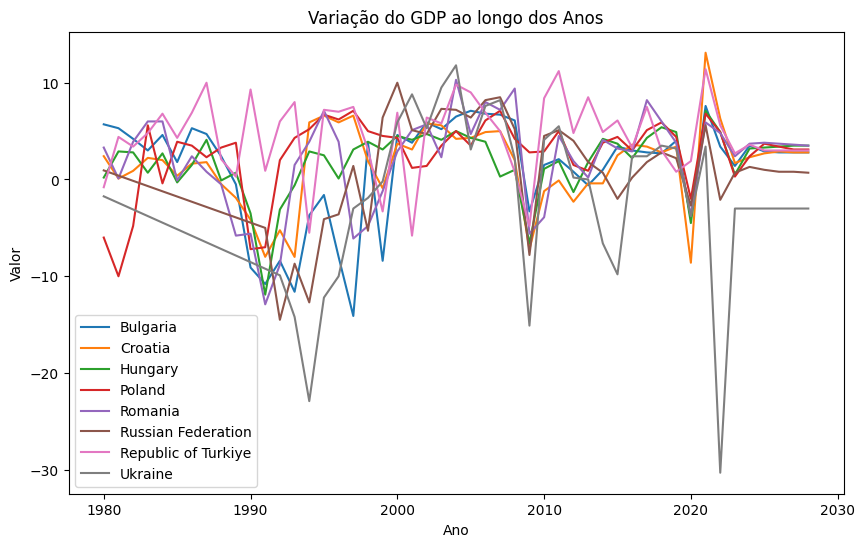

In [62]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_emerging_europe.columns:
    plt.plot(df_emerging_europe.index, df_emerging_europe[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [63]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v4 = df_transposed_copy_inputting_v3.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v4.update(df_emerging_europe)

print(df_transposed_copy_inputting_v4)
df_transposed_copy_inputting_v4.to_csv('Projeto/df_transposed_copy_inputting_v4.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [64]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v4.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for western_europe: 21
Sum of NaN occurrences for euro_area: 27
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for european_union: 43
Sum of NaN occurrences for middle_east: 48
Sum of NaN occurrences for southeast_asia: 54
Sum of NaN occurrences for middle_east_an

### Países da Western Europe

In [65]:
for group_name, group_countries in groups.items():
    countries_names = groups['western_europe']
print(countries_names)

['Andorra', 'Austria', 'Belgium', 'France', 'Germany', 'Luxembourg', 'Netherlands', 'Switzerland']


In [66]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v4.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['western_europe']
    nan_counts_group = nan_counts[countries_names]

    #nan_counts_group = countries_names['emerging_and_developing_asia']

    #nan_sum = nan_counts_group.sum()
    #nan_sums[group_name] = nan_sum
print(nan_counts_group)

Real GDP growth (Annual percent change)
Andorra        21
Austria         0
Belgium         0
France          0
Germany         0
Luxembourg      0
Netherlands     0
Switzerland     0
dtype: int64


In [67]:
group_name = "western_europe"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v4[country_group_selected]
df_western_europe = pd.DataFrame(selected_columns)

print(df_western_europe)

Real GDP growth (Annual percent change)  Andorra  Austria  Belgium  France  \
year                                                                         
1980-01-01                                   NaN      2.3      4.4     1.8   
1981-01-01                                   NaN     -0.1     -0.3     1.1   
1982-01-01                                   NaN      1.9      0.6     2.5   
1983-01-01                                   NaN      2.8      0.3     1.3   
1984-01-01                                   NaN      0.3      2.5     1.6   
1985-01-01                                   NaN      2.2      1.7     1.7   
1986-01-01                                   NaN      2.3      1.8     2.3   
1987-01-01                                   NaN      1.7      2.3     2.6   
1988-01-01                                   NaN      1.0      4.7     4.6   
1989-01-01                                   NaN      3.9      3.5     4.5   
1990-01-01                                   NaN      4.3      3

In [68]:

for country in df_western_europe.columns:
    last_non_null_year = df_western_europe[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_western_europe.columns:
    first_non_null_year = df_western_europe[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Andorra: 2028
Ultima ocorrência não nula para Austria: 2028
Ultima ocorrência não nula para Belgium: 2028
Ultima ocorrência não nula para France: 2028
Ultima ocorrência não nula para Germany: 2028
Ultima ocorrência não nula para Luxembourg: 2028
Ultima ocorrência não nula para Netherlands: 2028
Ultima ocorrência não nula para Switzerland: 2028
Primeira ocorrência não nula para Andorra: 2001
Primeira ocorrência não nula para Austria: 1980
Primeira ocorrência não nula para Belgium: 1980
Primeira ocorrência não nula para France: 1980
Primeira ocorrência não nula para Germany: 1980
Primeira ocorrência não nula para Luxembourg: 1980
Primeira ocorrência não nula para Netherlands: 1980
Primeira ocorrência não nula para Switzerland: 1980


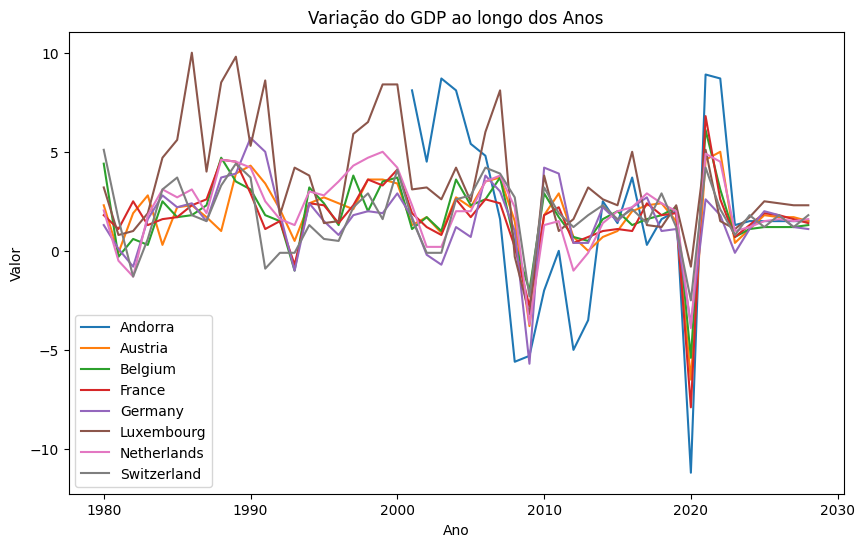

In [69]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_western_europe.columns:
    plt.plot(df_western_europe.index, df_western_europe[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [70]:
for column in df_western_europe.columns:
    missing_rows = df_western_europe[df_western_europe[column].isna()]
    aux = missing_rows.drop(columns=[column]).mean(axis=1)
    df_western_europe.loc[missing_rows.index, column] = aux
df_western_europe

Real GDP growth (Annual percent change),Andorra,Austria,Belgium,France,Germany,Luxembourg,Netherlands,Switzerland
year,,,,,,,,
1980-01-01,2.877381,2.3,4.4,1.8,1.3,3.2,2.041667,5.1
1981-01-01,0.385714,-0.1,-0.3,1.1,0.1,0.8,-0.500000,1.6
1982-01-01,0.371429,1.9,0.6,2.5,-0.8,1.0,-1.300000,-1.3
1983-01-01,1.471429,2.8,0.3,1.3,1.6,1.9,1.800000,0.6
1984-01-01,2.585714,0.3,2.5,1.6,2.8,4.7,3.100000,3.1
1985-01-01,2.828571,2.2,1.7,1.7,2.2,5.6,2.700000,3.7
1986-01-01,3.385714,2.3,1.8,2.3,2.4,10.0,3.100000,1.8
1987-01-01,2.214286,1.7,2.3,2.6,1.5,4.0,1.900000,1.5
1988-01-01,4.342857,1.0,4.7,4.6,3.7,8.5,4.600000,3.3


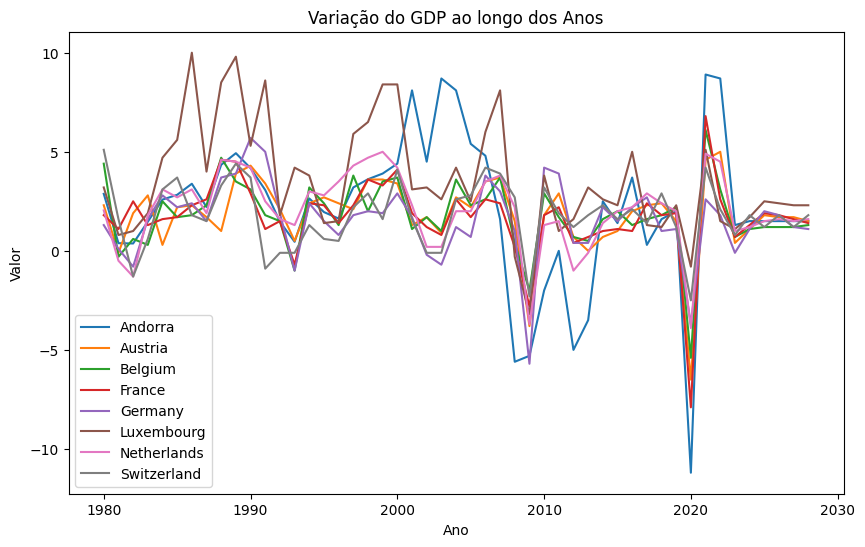

In [71]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_western_europe.columns:
    plt.plot(df_western_europe.index, df_western_europe[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [72]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v5 = df_transposed_copy_inputting_v4.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v5.update(df_western_europe)

print(df_transposed_copy_inputting_v5)
df_transposed_copy_inputting_v5.to_csv('Projeto/df_transposed_copy_inputting_v5.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [73]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v5.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for euro_area: 27
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for european_union: 43
Sum of NaN occurrences for middle_east: 48
Sum of NaN occurrences for southeast_asia: 54
Sum of NaN occurrences for middle_east_and

### Países da Euro Área

In [74]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v5.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['euro_area']
    nan_counts_group = nan_counts[countries_names]


print(nan_counts_group)

Real GDP growth (Annual percent change)
Austria             0
Belgium             0
Cyprus              0
Estonia             0
Finland             0
France              0
Germany             0
Greece              0
Ireland             0
Italy               0
Latvia              0
Lithuania           0
Luxembourg          0
Malta               0
Netherlands         0
Portugal            0
Slovak Republic    14
Slovenia           13
Spain               0
dtype: int64


In [75]:
group_name = "euro_area"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v5[country_group_selected]
df_euro_area = pd.DataFrame(selected_columns)

print(df_euro_area)

Real GDP growth (Annual percent change)  Austria  Belgium  Cyprus    Estonia  \
year                                                                           
1980-01-01                                   2.3      4.4     5.9   3.550000   
1981-01-01                                  -0.1     -0.3     3.1   3.182143   
1982-01-01                                   1.9      0.6     6.3   2.814286   
1983-01-01                                   2.8      0.3     5.3   2.446429   
1984-01-01                                   0.3      2.5     8.8   2.078571   
1985-01-01                                   2.2      1.7     4.7   1.710714   
1986-01-01                                   2.3      1.8     3.6   1.342857   
1987-01-01                                   1.7      2.3     7.1   0.975000   
1988-01-01                                   1.0      4.7     8.3   0.607143   
1989-01-01                                   3.9      3.5     8.1   0.239286   
1990-01-01                              

In [76]:

for country in df_euro_area.columns:
    last_non_null_year = df_euro_area[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_euro_area.columns:
    first_non_null_year = df_euro_area[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Austria: 2028
Ultima ocorrência não nula para Belgium: 2028
Ultima ocorrência não nula para Cyprus: 2028
Ultima ocorrência não nula para Estonia: 2028
Ultima ocorrência não nula para Finland: 2028
Ultima ocorrência não nula para France: 2028
Ultima ocorrência não nula para Germany: 2028
Ultima ocorrência não nula para Greece: 2028
Ultima ocorrência não nula para Ireland: 2028
Ultima ocorrência não nula para Italy: 2028
Ultima ocorrência não nula para Latvia: 2028
Ultima ocorrência não nula para Lithuania: 2028
Ultima ocorrência não nula para Luxembourg: 2028
Ultima ocorrência não nula para Malta: 2028
Ultima ocorrência não nula para Netherlands: 2028
Ultima ocorrência não nula para Portugal: 2028
Ultima ocorrência não nula para Slovak Republic: 2028
Ultima ocorrência não nula para Slovenia: 2028
Ultima ocorrência não nula para Spain: 2028
Primeira ocorrência não nula para Austria: 1980
Primeira ocorrência não nula para Belgium: 1980
Primeira ocorrência n

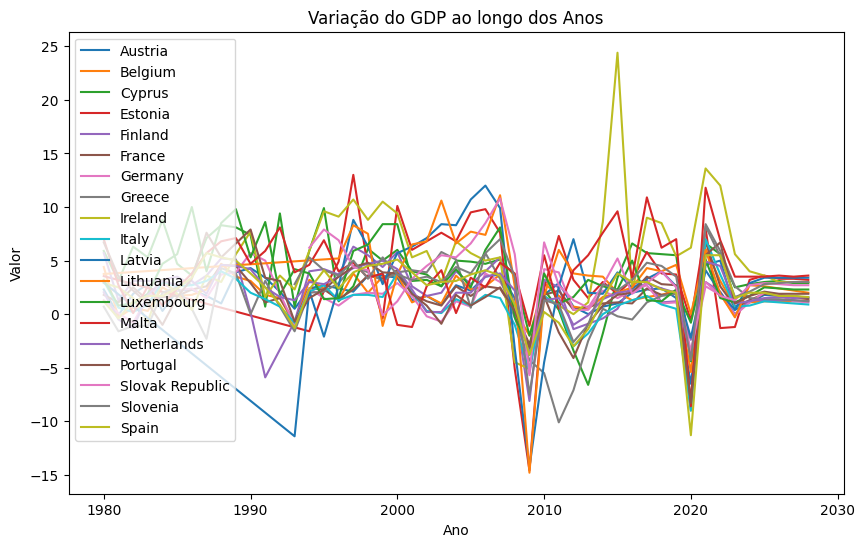

In [77]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_euro_area.columns:
    plt.plot(df_euro_area.index, df_euro_area[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [78]:
for column in df_euro_area.columns:
    missing_rows = df_euro_area[df_euro_area[column].isna()]
    aux = missing_rows.drop(columns=[column]).mean(axis=1)
    df_euro_area.loc[missing_rows.index, column] = aux
df_euro_area

Real GDP growth (Annual percent change),Austria,Belgium,Cyprus,Estonia,Finland,France,Germany,Greece,Ireland,Italy,Latvia,Lithuania,Luxembourg,Malta,Netherlands,Portugal,Slovak Republic,Slovenia,Spain
year,,,,,,,,,,,,,,,,,,,
1980-01-01,2.3,4.4,5.9,3.550000,5.7,1.8,1.3,0.7,2.9,3.1,2.950000,3.750000,3.2,7.0,2.041667,6.7,3.440686,3.440686,1.2
1981-01-01,-0.1,-0.3,3.1,3.182143,1.3,1.1,0.1,-1.6,2.5,0.6,1.846154,3.840625,0.8,2.7,-0.500000,3.5,1.274642,1.274642,-0.4
1982-01-01,1.9,0.6,6.3,2.814286,3.1,2.5,-0.8,-1.1,1.5,0.2,0.742308,3.931250,1.0,0.1,-1.300000,2.2,1.463991,1.463991,1.2
1983-01-01,2.8,0.3,5.3,2.446429,3.1,1.3,1.6,-1.1,-0.7,0.9,-0.361538,4.021875,1.9,2.6,1.800000,1.0,1.682751,1.682751,1.7
1984-01-01,0.3,2.5,8.8,2.078571,3.2,1.6,2.8,2.0,3.2,3.0,-1.465385,4.112500,4.7,0.8,3.100000,-1.0,2.436805,2.436805,1.7
1985-01-01,2.2,1.7,4.7,1.710714,3.5,1.7,2.2,2.5,1.9,2.6,-2.569231,4.203125,5.6,2.4,2.700000,1.6,2.414389,2.414389,2.4
1986-01-01,2.3,1.8,3.6,1.342857,2.7,2.3,2.4,0.5,0.4,2.7,-3.673077,4.293750,10.0,3.8,3.100000,3.3,2.603737,2.603737,3.4
1987-01-01,1.7,2.3,7.1,0.975000,3.6,2.6,1.5,-2.3,3.6,3.1,-4.776923,4.384375,4.0,5.7,1.900000,7.6,2.863674,2.863674,5.7
1988-01-01,1.0,4.7,8.3,0.607143,5.2,4.6,3.7,4.3,3.0,4.0,-5.880769,4.475000,8.5,6.8,4.600000,5.3,4.029493,4.029493,5.3


In [79]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v6 = df_transposed_copy_inputting_v5.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v6.update(df_euro_area)

print(df_transposed_copy_inputting_v6)
df_transposed_copy_inputting_v6.to_csv('Projeto/df_transposed_copy_inputting_v6.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [80]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v6.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for european_union: 16
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for middle_east: 48
Sum of NaN occurrences for southeast_asia: 54
Sum of NaN occurrences for advanced_economi

### Países da União Européia

In [81]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v6.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['european_union']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)

group_name = "european_union"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v6[country_group_selected]
df_european_union = pd.DataFrame(selected_columns)

print(df_european_union)

Real GDP growth (Annual percent change)
Austria             0
Belgium             0
Bulgaria            0
Croatia             0
Cyprus              0
Czech Republic     16
Denmark             0
Estonia             0
Finland             0
France              0
Germany             0
Greece              0
Hungary             0
Ireland             0
Italy               0
Latvia              0
Lithuania           0
Luxembourg          0
Malta               0
Netherlands         0
Poland              0
Portugal            0
Romania             0
Slovak Republic     0
Slovenia            0
Spain               0
Sweden              0
dtype: int64
Real GDP growth (Annual percent change)  Austria  Belgium  Bulgaria  \
year                                                                  
1980-01-01                                   2.3      4.4       5.7   
1981-01-01                                  -0.1     -0.3       5.3   
1982-01-01                                   1.9      0.6       4.2  

In [82]:

for country in df_european_union.columns:
    last_non_null_year = df_european_union[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_european_union.columns:
    first_non_null_year = df_european_union[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Austria: 2028
Ultima ocorrência não nula para Belgium: 2028
Ultima ocorrência não nula para Bulgaria: 2028
Ultima ocorrência não nula para Croatia: 2028
Ultima ocorrência não nula para Cyprus: 2028
Ultima ocorrência não nula para Czech Republic: 2028
Ultima ocorrência não nula para Denmark: 2028
Ultima ocorrência não nula para Estonia: 2028
Ultima ocorrência não nula para Finland: 2028
Ultima ocorrência não nula para France: 2028
Ultima ocorrência não nula para Germany: 2028
Ultima ocorrência não nula para Greece: 2028
Ultima ocorrência não nula para Hungary: 2028
Ultima ocorrência não nula para Ireland: 2028
Ultima ocorrência não nula para Italy: 2028
Ultima ocorrência não nula para Latvia: 2028
Ultima ocorrência não nula para Lithuania: 2028
Ultima ocorrência não nula para Luxembourg: 2028
Ultima ocorrência não nula para Malta: 2028
Ultima ocorrência não nula para Netherlands: 2028
Ultima ocorrência não nula para Poland: 2028
Ultima ocorrência não nula

In [83]:
for column in df_european_union.columns:
    missing_rows = df_european_union[df_european_union[column].isna()]
    aux = missing_rows.drop(columns=[column]).mean(axis=1)
    df_european_union.loc[missing_rows.index, column] = aux
df_european_union

Real GDP growth (Annual percent change),Austria,Belgium,Bulgaria,Croatia,Cyprus,Czech Republic,Denmark,Estonia,Finland,France,...,Luxembourg,Malta,Netherlands,Poland,Portugal,Romania,Slovak Republic,Slovenia,Spain,Sweden
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,2.3,4.4,5.7,2.410000,5.9,2.887809,-0.5,3.550000,5.7,1.8,...,3.2,7.0,2.041667,-6.0,6.7,3.3,3.440686,3.440686,1.2,4.6
1981-01-01,-0.1,-0.3,5.3,0.097143,3.1,1.015975,-0.7,3.182143,1.3,1.1,...,0.8,2.7,-0.500000,-10.0,3.5,0.1,1.274642,1.274642,-0.4,4.5
1982-01-01,1.9,0.6,4.2,0.894286,6.3,1.535004,3.7,2.814286,3.1,2.5,...,1.0,0.1,-1.300000,-4.8,2.2,3.9,1.463991,1.463991,1.2,1.4
1983-01-01,2.8,0.3,3.0,2.234286,5.3,2.084867,2.6,2.446429,3.1,1.3,...,1.9,2.6,1.800000,5.6,1.0,6.0,1.682751,1.682751,1.7,2.1
1984-01-01,0.3,2.5,4.6,2.002857,8.8,2.680852,4.2,2.078571,3.2,1.6,...,4.7,0.8,3.100000,-0.4,-1.0,6.0,2.436805,2.436805,1.7,4.3
1985-01-01,2.2,1.7,1.8,0.385714,4.7,2.225350,4.0,1.710714,3.5,1.7,...,5.6,2.4,2.700000,3.9,1.6,-0.1,2.414389,2.414389,2.4,2.3
1986-01-01,2.3,1.8,5.3,1.640000,3.6,2.758116,4.9,1.342857,2.7,2.3,...,10.0,3.8,3.100000,3.5,3.3,2.4,2.603737,2.603737,3.4,3.0
1987-01-01,1.7,2.3,4.7,1.794286,7.1,2.757849,0.3,0.975000,3.6,2.6,...,4.0,5.7,1.900000,2.3,7.6,0.8,2.863674,2.863674,5.7,3.3
1988-01-01,1.0,4.7,2.4,-0.480000,8.3,3.218475,0.0,0.607143,5.2,4.6,...,8.5,6.8,4.600000,3.3,5.3,-0.5,4.029493,4.029493,5.3,2.5


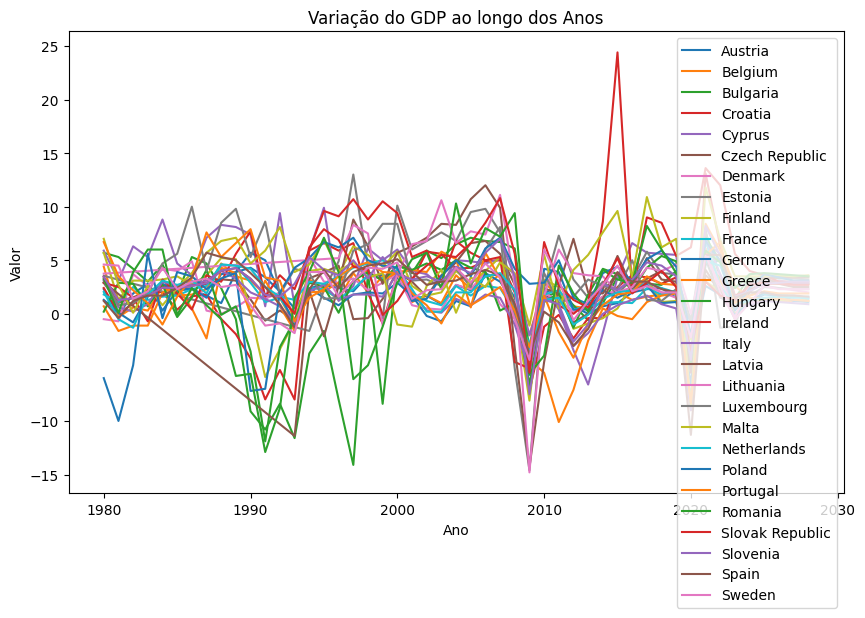

In [84]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_european_union.columns:
    plt.plot(df_european_union.index, df_european_union[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [85]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v7 = df_transposed_copy_inputting_v6.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v7.update(df_european_union)

print(df_transposed_copy_inputting_v7)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [86]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v7.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for advanced_economies: 47
Sum of NaN occurrences for middle_east: 48
Sum of NaN occurrences for southeast_asi

### Países Europe

In [87]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v7.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['europe']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Albania                    0
Andorra                    0
Armenia                    0
Austria                    0
Azerbaijan                 0
Belarus                    0
Belgium                    0
Bosnia and Herzegovina    15
Bulgaria                   0
Croatia                    0
Cyprus                     0
Czech Republic             0
Denmark                    0
Estonia                    0
Finland                    0
France                     0
Georgia                    0
Germany                    0
Greece                     0
Hungary                    0
Iceland                    0
Ireland                    0
Italy                      0
Kazakhstan                 0
Kosovo                    21
Latvia                     0
Lithuania                  0
Luxembourg                 0
Malta                      0
Moldova                    0
Montenegro                21
Netherlands                0
North Macedonia           13
Nor

In [88]:

group_name = "europe"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v7[country_group_selected]
df_europe = pd.DataFrame(selected_columns)

print(df_europe)

Real GDP growth (Annual percent change)  Albania    Andorra    Armenia  \
year                                                                     
1980-01-01                                   2.7   2.877381   5.290000   
1981-01-01                                   5.7   0.385714   3.798462   
1982-01-01                                   2.9   0.371429   2.306923   
1983-01-01                                   1.1   1.471429   0.815385   
1984-01-01                                   2.0   2.585714  -0.676154   
1985-01-01                                  -1.5   2.828571  -2.167692   
1986-01-01                                   5.6   3.385714  -3.659231   
1987-01-01                                  -0.8   2.214286  -5.150769   
1988-01-01                                  -1.4   4.342857  -6.642308   
1989-01-01                                   9.8   4.928571  -8.133846   
1990-01-01                                 -10.0   4.171429  -9.625385   
1991-01-01                            

In [89]:

for country in df_europe.columns:
    last_non_null_year = df_europe[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_europe.columns:
    first_non_null_year = df_europe[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Albania: 2028
Ultima ocorrência não nula para Andorra: 2028
Ultima ocorrência não nula para Armenia: 2028
Ultima ocorrência não nula para Austria: 2028
Ultima ocorrência não nula para Azerbaijan: 2028
Ultima ocorrência não nula para Belarus: 2028
Ultima ocorrência não nula para Belgium: 2028
Ultima ocorrência não nula para Bosnia and Herzegovina: 2028
Ultima ocorrência não nula para Bulgaria: 2028
Ultima ocorrência não nula para Croatia: 2028
Ultima ocorrência não nula para Cyprus: 2028
Ultima ocorrência não nula para Czech Republic: 2028
Ultima ocorrência não nula para Denmark: 2028
Ultima ocorrência não nula para Estonia: 2028
Ultima ocorrência não nula para Finland: 2028
Ultima ocorrência não nula para France: 2028
Ultima ocorrência não nula para Georgia: 2028
Ultima ocorrência não nula para Germany: 2028
Ultima ocorrência não nula para Greece: 2028
Ultima ocorrência não nula para Hungary: 2028
Ultima ocorrência não nula para Iceland: 2028
Ultima ocor

In [90]:

# Para cada coluna (país) nas colunas a serem preenchidas
for column in df_europe.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_europe[df_europe[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_europe[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_europe.at[index, column] = value


In [91]:
#for column in df_europe.columns:
#    missing_rows = df_europe[df_europe[column].isna()]
#    aux = missing_rows.drop(columns=[column]).mean(axis=1)
#    df_europe.loc[missing_rows.index, column] = aux
#df_europe

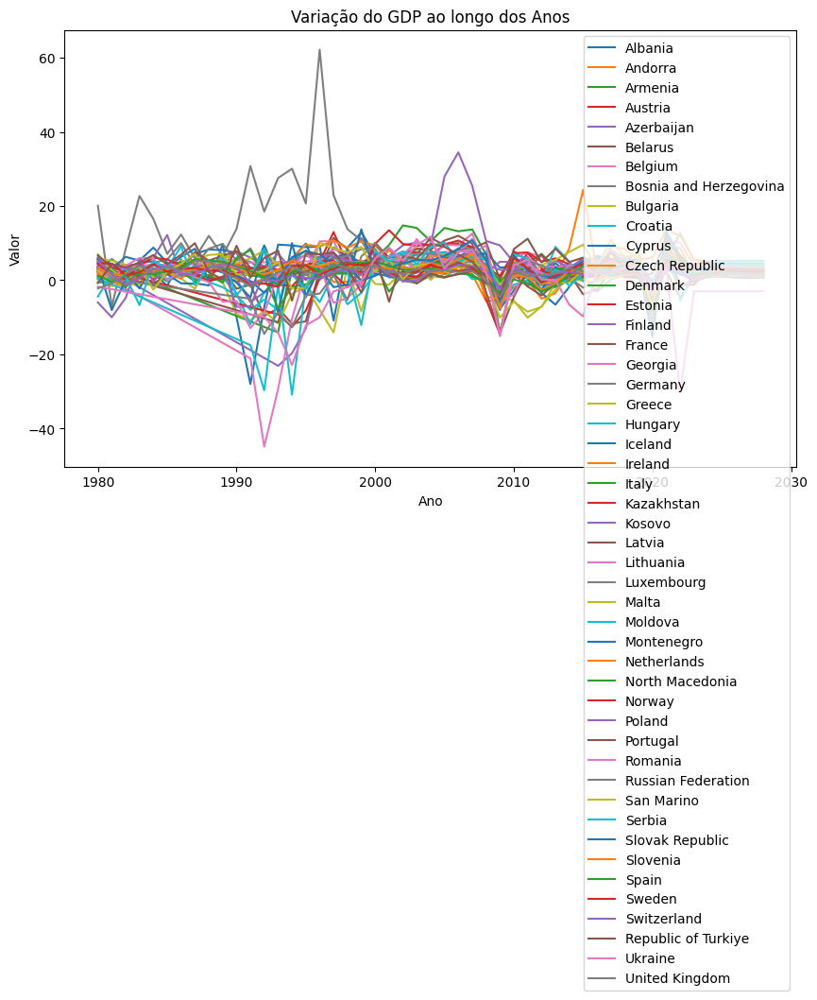

In [92]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_europe.columns:
    plt.plot(df_europe.index, df_europe[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [93]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v8 = df_transposed_copy_inputting_v7.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v8.update(df_europe)

print(df_transposed_copy_inputting_v8)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [94]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v8.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for advanced_economies: 29
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for middle_east: 48
Sum

### Países de Advanced_Economies

In [95]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v8.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['advanced_economies']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Andorra                      0
Aruba                        7
Australia                    0
Austria                      0
Bahrain                      0
Belgium                      0
Canada                       0
Cyprus                       0
Czech Republic               0
Denmark                      0
Estonia                      0
Finland                      0
France                       0
Germany                      0
Greece                       0
Hong Kong SAR                0
Iceland                      0
Ireland                      0
Israel                       0
Italy                        0
Japan                        0
Republic of Korea            0
Kuwait                       0
Latvia                       0
Lithuania                    0
Luxembourg                   0
Macao SAR                   22
Malta                        0
Netherlands                  0
New Zealand                  0
Norway                       0

In [96]:

group_name = "advanced_economies"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v8[country_group_selected]
df_advanced_economies = pd.DataFrame(selected_columns)

print(df_advanced_economies)

Real GDP growth (Annual percent change)    Andorra  Aruba  Australia  Austria  \
year                                                                            
1980-01-01                                2.877381    NaN        2.9      2.3   
1981-01-01                                0.385714    NaN        4.1     -0.1   
1982-01-01                                0.371429    NaN        0.1      1.9   
1983-01-01                                1.471429    NaN       -0.5      2.8   
1984-01-01                                2.585714    NaN        6.3      0.3   
1985-01-01                                2.828571    NaN        5.5      2.2   
1986-01-01                                3.385714    NaN        2.4      2.3   
1987-01-01                                2.214286   16.1        4.9      1.7   
1988-01-01                                4.342857   18.6        4.3      1.0   
1989-01-01                                4.928571   12.1        4.6      3.9   
1990-01-01                  

In [97]:

for country in df_advanced_economies.columns:
    last_non_null_year = df_advanced_economies[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_advanced_economies.columns:
    first_non_null_year = df_advanced_economies[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Andorra: 2028
Ultima ocorrência não nula para Aruba: 2028
Ultima ocorrência não nula para Australia: 2028
Ultima ocorrência não nula para Austria: 2028
Ultima ocorrência não nula para Bahrain: 2028
Ultima ocorrência não nula para Belgium: 2028
Ultima ocorrência não nula para Canada: 2028
Ultima ocorrência não nula para Cyprus: 2028
Ultima ocorrência não nula para Czech Republic: 2028
Ultima ocorrência não nula para Denmark: 2028
Ultima ocorrência não nula para Estonia: 2028
Ultima ocorrência não nula para Finland: 2028
Ultima ocorrência não nula para France: 2028
Ultima ocorrência não nula para Germany: 2028
Ultima ocorrência não nula para Greece: 2028
Ultima ocorrência não nula para Hong Kong SAR: 2028
Ultima ocorrência não nula para Iceland: 2028
Ultima ocorrência não nula para Ireland: 2028
Ultima ocorrência não nula para Israel: 2028
Ultima ocorrência não nula para Italy: 2028
Ultima ocorrência não nula para Japan: 2028
Ultima ocorrência não nula par

In [98]:

# Para cada coluna (país) nas colunas a serem preenchidas
for column in df_advanced_economies.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_advanced_economies[df_advanced_economies[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_advanced_economies[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_advanced_economies.at[index, column] = value
df_advanced_economies

Real GDP growth (Annual percent change),Andorra,Aruba,Australia,Austria,Bahrain,Belgium,Canada,Cyprus,Czech Republic,Denmark,...,Singapore,Slovak Republic,Slovenia,Spain,Sweden,Switzerland,Taiwan Province of China,United Arab Emirates,United Kingdom,United States
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,2.877381,-5.213266,2.9,2.3,7.5,4.4,2.2,5.9,2.887809,-0.5,...,10.1,3.440686,3.440686,1.2,4.6,5.1,8.0,-1.8,-2.2,-0.3
1981-01-01,0.385714,2.773393,4.1,-0.1,2.8,-0.3,3.5,3.1,1.015975,-0.7,...,10.8,1.274642,1.274642,-0.4,4.5,1.6,7.1,8.0,-0.9,2.5
1982-01-01,0.371429,-4.032126,0.1,1.9,6.4,0.6,-3.2,6.3,1.535004,3.7,...,7.1,1.463991,1.463991,1.2,1.4,-1.3,4.8,-7.2,1.7,-1.8
1983-01-01,1.471429,-0.920805,-0.5,2.8,7.0,0.3,2.6,5.3,2.084867,2.6,...,8.6,1.682751,1.682751,1.7,2.1,0.6,9.0,-5.2,3.9,4.6
1984-01-01,2.585714,8.403903,6.3,0.3,4.2,2.5,5.9,8.8,2.680852,4.2,...,8.8,2.436805,2.436805,1.7,4.3,3.1,10.0,4.5,1.9,7.2
1985-01-01,2.828571,4.470314,5.5,2.2,-0.9,1.7,4.7,4.7,2.225350,4.0,...,-0.6,2.414389,2.414389,2.4,2.3,3.7,4.8,-2.5,3.7,4.2
1986-01-01,3.385714,5.497920,2.4,2.3,0.5,1.8,2.1,3.6,2.758116,4.9,...,1.3,2.603737,2.603737,3.4,3.0,1.8,11.5,-19.3,2.6,3.5
1987-01-01,2.214286,16.100000,4.9,1.7,-1.2,2.3,4.1,7.1,2.757849,0.3,...,10.8,2.863674,2.863674,5.7,3.3,1.5,12.8,5.3,5.2,3.5
1988-01-01,4.342857,18.600000,4.3,1.0,6.0,4.7,4.4,8.3,3.218475,0.0,...,11.3,4.029493,4.029493,5.3,2.5,3.3,8.0,-2.6,5.2,4.2


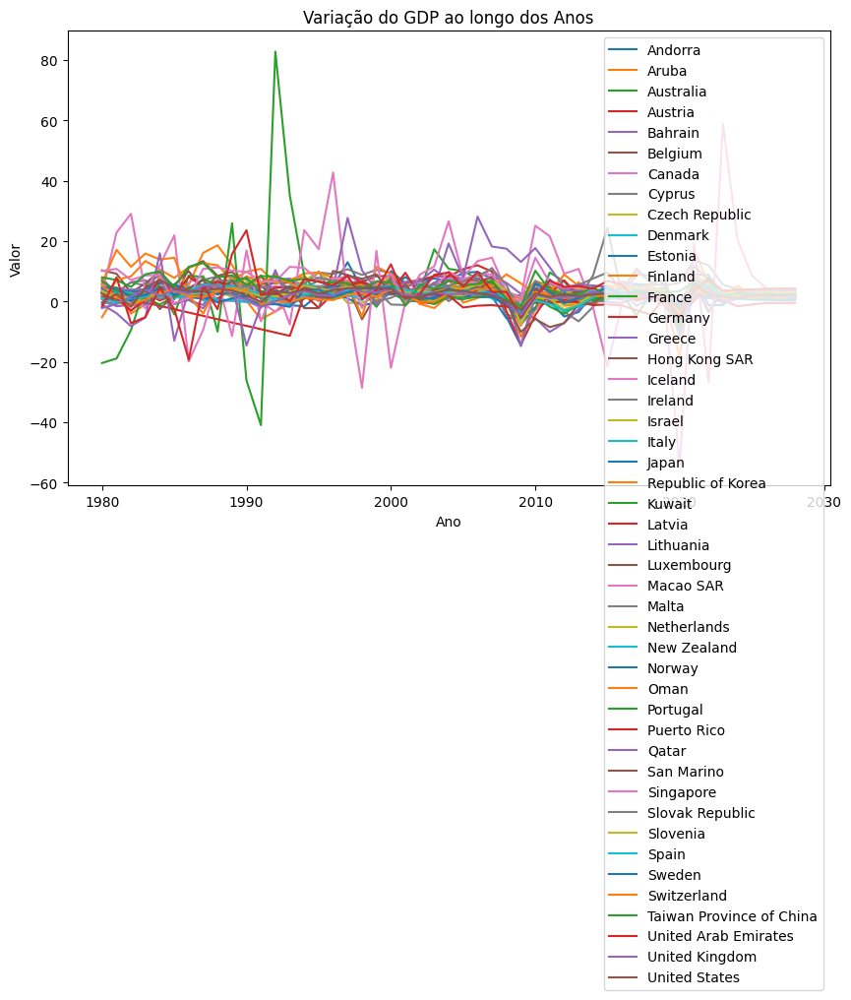

In [99]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_advanced_economies.columns:
    plt.plot(df_advanced_economies.index, df_advanced_economies[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [100]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v9 = df_transposed_copy_inputting_v8.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v9.update(df_advanced_economies)

print(df_transposed_copy_inputting_v9)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                       NaN      2.7     -5.4   
1981-01-01                                       NaN      5.7      3.0   
1982-01-01                                       NaN      2.9      6.4   
1983-01-01                                       NaN      1.1      5.4   
1984-01-01                                       NaN      2.0      5.6   
1985-01-01                                       NaN     -1.5      5.6   
1986-01-01                                       NaN      5.6     -0.2   
1987-01-01                                       NaN     -0.8     -0.7   
1988-01-01                                       NaN     -1.4     -1.9   
1989-01-01                                       NaN      9.8      4.8   
1990-01-01                                       NaN    -10.0      0.8   
1991-01-01                            

In [101]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v9.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for advanced_economies: 0
Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for south_asia: 31
Sum of NaN occurrences for middle_east: 48
Sum 

### Países de South Asia

In [102]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v9.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['south_asia']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Afghanistan    31
Bangladesh      0
Bhutan          0
India           0
Nepal           0
Pakistan        0
Sri Lanka       0
dtype: int64


In [103]:
group_name = "south_asia"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v9[country_group_selected]
df_south_asia = pd.DataFrame(selected_columns)

print(df_south_asia)

Real GDP growth (Annual percent change)  Afghanistan  Bangladesh  Bhutan  \
year                                                                       
1980-01-01                                       NaN    5.372917     5.0   
1981-01-01                                       NaN    3.800000    13.6   
1982-01-01                                       NaN    2.400000     8.2   
1983-01-01                                       NaN    4.000000     7.3   
1984-01-01                                       NaN    5.200000     7.6   
1985-01-01                                       NaN    3.200000     4.3   
1986-01-01                                       NaN    4.200000     8.0   
1987-01-01                                       NaN    3.700000    20.2   
1988-01-01                                       NaN    2.200000    15.1   
1989-01-01                                       NaN    2.600000     6.2   
1990-01-01                                       NaN    5.900000     9.1   
1991-01-01  

In [104]:
for column in df_south_asia.columns:
    missing_rows = df_south_asia[df_south_asia[column].isna()]
    aux = missing_rows.drop(columns=[column]).mean(axis=1)
    df_south_asia.loc[missing_rows.index, column] = aux
df_south_asia

Real GDP growth (Annual percent change),Afghanistan,Bangladesh,Bhutan,India,Nepal,Pakistan,Sri Lanka
year,,,,,,,
1980-01-01,4.345486,5.372917,5.0,5.3,-2.3,6.9,5.8
1981-01-01,7.200000,3.800000,13.6,6.0,8.3,6.2,5.3
1982-01-01,5.116667,2.400000,8.2,3.5,3.8,7.6,5.2
1983-01-01,4.283333,4.000000,7.3,7.3,-3.0,6.8,3.3
1984-01-01,6.166667,5.200000,7.6,3.8,9.7,4.0,6.7
1985-01-01,5.433333,3.200000,4.3,5.3,6.1,8.7,5.0
1986-01-01,5.383333,4.200000,8.0,4.8,4.6,6.4,4.3
1987-01-01,6.150000,3.700000,20.2,4.0,1.7,5.8,1.5
1988-01-01,7.283333,2.200000,15.1,9.6,7.7,6.4,2.7


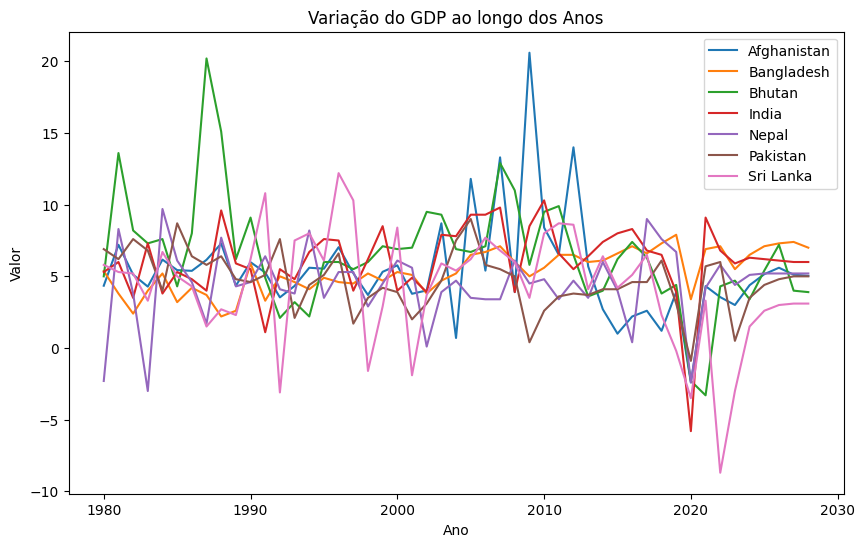

In [105]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_south_asia.columns:
    plt.plot(df_south_asia.index, df_south_asia[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [106]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v10 = df_transposed_copy_inputting_v9.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v10.update(df_south_asia)

print(df_transposed_copy_inputting_v10)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

In [107]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v10.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for advanced_economies: 0
Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for south_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0
Sum of NaN occurrences for soviet_union_countries: 0
Sum of NaN occurrences for middle_east: 48
Sum o

### Países de Middle East

In [108]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v10.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['middle_east']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Bahrain                  0
Iran                     0
Iraq                    19
Israel                   0
Jordan                   0
Kuwait                   0
Lebanon                  0
Oman                     0
Qatar                    0
Saudi Arabia             0
Syria                   18
United Arab Emirates     0
Yemen                   11
dtype: int64


In [109]:

group_name = "middle_east"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v10[country_group_selected]
df_middle_east = pd.DataFrame(selected_columns)

print(df_middle_east)

Real GDP growth (Annual percent change)  Bahrain  Iran  Iraq  Israel  Jordan  \
year                                                                           
1980-01-01                                   7.5 -21.6   NaN     3.6    11.1   
1981-01-01                                   2.8  -5.7   NaN     4.7    15.0   
1982-01-01                                   6.4  23.2   NaN     1.4     5.8   
1983-01-01                                   7.0  11.1   NaN     2.6     1.4   
1984-01-01                                   4.2  -7.1   NaN     2.2     5.5   
1985-01-01                                  -0.9   1.9   NaN     4.5    -1.1   
1986-01-01                                   0.5  -9.8   NaN     3.6     5.9   
1987-01-01                                  -1.2  -0.2   NaN     7.5     2.7   
1988-01-01                                   6.0  -6.1   NaN     3.6     2.9   
1989-01-01                                   1.0   6.1   NaN     1.4   -10.7   
1990-01-01                              

In [110]:

for country in df_middle_east.columns:
    last_non_null_year = df_middle_east[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_middle_east.columns:
    first_non_null_year = df_middle_east[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Bahrain: 2028
Ultima ocorrência não nula para Iran: 2028
Ultima ocorrência não nula para Iraq: 2028
Ultima ocorrência não nula para Israel: 2028
Ultima ocorrência não nula para Jordan: 2028
Ultima ocorrência não nula para Kuwait: 2028
Ultima ocorrência não nula para Lebanon: 2028
Ultima ocorrência não nula para Oman: 2028
Ultima ocorrência não nula para Qatar: 2028
Ultima ocorrência não nula para Saudi Arabia: 2028
Ultima ocorrência não nula para Syria: 2010
Ultima ocorrência não nula para United Arab Emirates: 2028
Ultima ocorrência não nula para Yemen: 2028
Primeira ocorrência não nula para Bahrain: 1980
Primeira ocorrência não nula para Iran: 1980
Primeira ocorrência não nula para Iraq: 1999
Primeira ocorrência não nula para Israel: 1980
Primeira ocorrência não nula para Jordan: 1980
Primeira ocorrência não nula para Kuwait: 1980
Primeira ocorrência não nula para Lebanon: 1980
Primeira ocorrência não nula para Oman: 1980
Primeira ocorrência não nula p

In [111]:

# Para cada coluna (país) nas colunas a serem preenchidas
for column in df_middle_east.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_middle_east[df_middle_east[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_middle_east[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_middle_east.at[index, column] = value
df_middle_east

Real GDP growth (Annual percent change),Bahrain,Iran,Iraq,Israel,Jordan,Kuwait,Lebanon,Oman,Qatar,Saudi Arabia,Syria,United Arab Emirates,Yemen
year,,,,,,,,,,,,,
1980-01-01,7.5,-21.6,-4.343227,3.6,11.1,-20.4,1.500000,6.1,-1.0,5.7,10.500000,-1.8,-1.206745
1981-01-01,2.8,-5.7,3.471082,4.7,15.0,-18.9,0.500000,17.1,-3.9,1.9,8.500000,8.0,4.631401
1982-01-01,6.4,23.2,14.468618,1.4,5.8,-9.5,-36.800000,11.5,-8.2,-20.7,2.600000,-7.2,-2.868988
1983-01-01,7.0,11.1,4.569210,2.6,1.4,5.3,22.700000,15.9,-5.3,-16.1,1.600000,-5.2,5.315518
1984-01-01,4.2,-7.1,22.616893,2.2,5.5,5.2,44.500000,13.9,16.0,-4.7,-6.500000,4.5,7.629005
1985-01-01,-0.9,1.9,10.579018,4.5,-1.1,-4.3,24.300000,14.5,-13.0,-9.8,7.300000,-2.5,7.330715
1986-01-01,0.5,-9.8,11.664366,3.6,5.9,8.6,-6.800000,2.1,3.7,17.0,-4.800000,-19.3,16.067413
1987-01-01,-1.2,-0.2,-6.526979,7.5,2.7,8.1,16.700000,-4.0,0.9,-6.6,1.300000,5.3,-9.163765
1988-01-01,6.0,-6.1,20.922651,3.6,2.9,-10.0,-28.200000,5.2,4.7,13.1,12.700000,-2.6,-5.121179


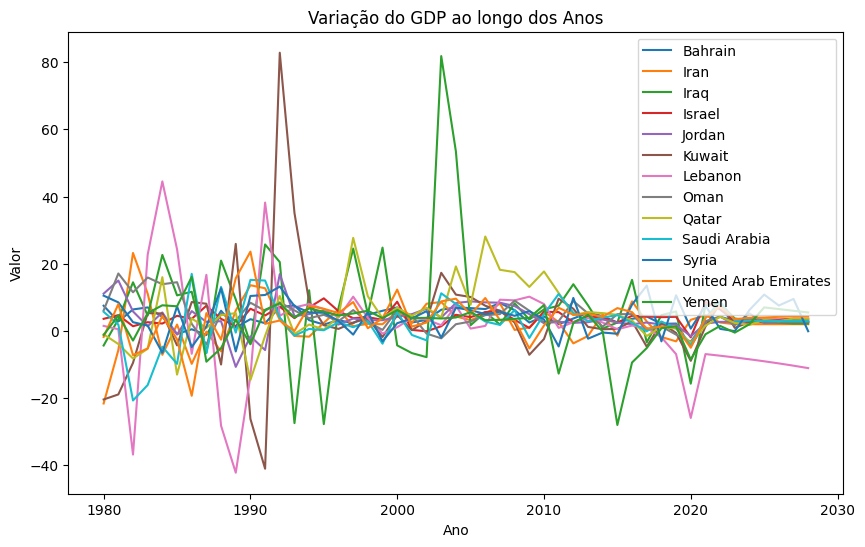

In [112]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_middle_east.columns:
    plt.plot(df_middle_east.index, df_middle_east[country], label=country)
 

plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [113]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v11 = df_transposed_copy_inputting_v10.copy()
# Update the values of df_transposed_copy_inputting...
df_transposed_copy_inputting_v11.update(df_middle_east)

print(df_transposed_copy_inputting_v11)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

In [114]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v11.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for advanced_economies: 0
Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for middle_east: 0
Sum of NaN occurrences for south_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for middle_east_and_central_asia: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurrences for latin_america_and_the_caribbean: 0


### Países do Sudeste da Ásia

In [115]:

# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v11.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['southeast_asia']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Brunei Darussalam     6
Cambodia              8
Indonesia             0
Lao P.D.R.            0
Malaysia              0
Myanmar              19
Philippines           0
Singapore             0
Thailand              0
Timor-Leste          21
Vietnam               0
dtype: int64


In [116]:

group_name = "southeast_asia"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v11[country_group_selected]
df_southeast_asia = pd.DataFrame(selected_columns)

print(df_southeast_asia)

Real GDP growth (Annual percent change)  Brunei Darussalam  Cambodia  \
year                                                                   
1980-01-01                                             NaN       NaN   
1981-01-01                                             NaN       NaN   
1982-01-01                                             NaN       NaN   
1983-01-01                                             NaN       NaN   
1984-01-01                                             NaN       NaN   
1985-01-01                                             NaN       NaN   
1986-01-01                                            -2.7       NaN   
1987-01-01                                             2.0       NaN   
1988-01-01                                             1.1       9.6   
1989-01-01                                            -1.1       3.3   
1990-01-01                                             1.1       1.1   
1991-01-01                                             3.1      

In [117]:

for country in df_southeast_asia.columns:
    last_non_null_year = df_southeast_asia[country].last_valid_index().year
    print(f"Ultima ocorrência não nula para {country}: {last_non_null_year}")


for country in df_southeast_asia.columns:
    first_non_null_year = df_southeast_asia[country].first_valid_index().year
    print(f"Primeira ocorrência não nula para {country}: {first_non_null_year}")


Ultima ocorrência não nula para Brunei Darussalam: 2028
Ultima ocorrência não nula para Cambodia: 2028
Ultima ocorrência não nula para Indonesia: 2028
Ultima ocorrência não nula para Lao P.D.R.: 2028
Ultima ocorrência não nula para Malaysia: 2028
Ultima ocorrência não nula para Myanmar: 2028
Ultima ocorrência não nula para Philippines: 2028
Ultima ocorrência não nula para Singapore: 2028
Ultima ocorrência não nula para Thailand: 2028
Ultima ocorrência não nula para Timor-Leste: 2028
Ultima ocorrência não nula para Vietnam: 2028
Primeira ocorrência não nula para Brunei Darussalam: 1986
Primeira ocorrência não nula para Cambodia: 1988
Primeira ocorrência não nula para Indonesia: 1980
Primeira ocorrência não nula para Lao P.D.R.: 1980
Primeira ocorrência não nula para Malaysia: 1980
Primeira ocorrência não nula para Myanmar: 1999
Primeira ocorrência não nula para Philippines: 1980
Primeira ocorrência não nula para Singapore: 1980
Primeira ocorrência não nula para Thailand: 1980
Primeira o

In [118]:

# Para cada coluna (país) nas colunas a serem preenchidas
for column in df_southeast_asia.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_southeast_asia[df_southeast_asia[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_southeast_asia[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_southeast_asia.at[index, column] = value
df_southeast_asia

Real GDP growth (Annual percent change),Brunei Darussalam,Cambodia,Indonesia,Lao P.D.R.,Malaysia,Myanmar,Philippines,Singapore,Thailand,Timor-Leste,Vietnam
year,,,,,,,,,,,
1980-01-01,-1.363465,8.932402,9.9,10.0,7.4,9.976027,5.1,10.1,4.6,8.273747,-3.5
1981-01-01,0.558547,8.183044,7.6,15.3,6.9,7.916074,3.4,10.8,5.9,6.544317,5.8
1982-01-01,4.446081,9.277850,2.2,4.7,5.9,20.441895,3.6,7.1,5.4,0.790663,8.2
1983-01-01,-4.650473,4.781492,4.2,3.0,6.3,4.818295,1.9,8.6,5.6,2.883698,7.1
1984-01-01,1.350697,14.319290,7.6,6.4,7.8,3.745992,-7.3,8.8,5.8,2.220636,8.4
1985-01-01,0.139206,0.635771,3.9,9.1,-0.9,-0.993281,-7.3,-0.6,4.6,-0.063067,5.6
1986-01-01,-2.700000,7.037773,7.2,4.8,1.2,7.335737,3.4,1.3,5.5,-4.989866,3.4
1987-01-01,2.000000,5.254615,6.6,-1.0,5.4,14.451084,4.3,10.8,9.5,3.011801,2.5
1988-01-01,1.100000,9.600000,7.0,-2.1,9.9,15.725936,6.8,11.3,13.3,7.670213,5.1


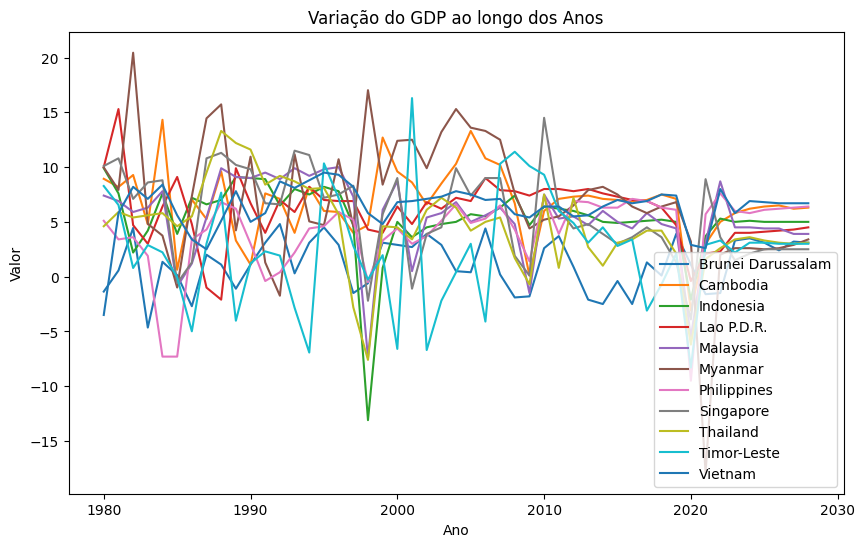

In [119]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_southeast_asia.columns:
    plt.plot(df_southeast_asia.index, df_southeast_asia[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [120]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v12 = df_transposed_copy_inputting_v11.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v12.update(df_southeast_asia)

print(df_transposed_copy_inputting_v12)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

In [121]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v12.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for advanced_economies: 0
Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for middle_east: 0
Sum of NaN occurrences for southeast_asia: 0
Sum of NaN occurrences for south_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for middle_east_and_central_asia: 0
Sum of NaN occurrences for central_asia_and_the_caucasus: 0
Sum of NaN occurr

### Países das ilhas do pacífico

In [122]:

# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v12.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['pacific_islands']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Fiji                          0
Kiribati                      0
Marshall Islands             18
Fed. States of Micronesia    16
Nauru                        25
Palau                        21
Papua New Guinea              0
Solomon Islands               0
Tonga                         0
Tuvalu                       21
Vanuatu                       0
dtype: int64


In [123]:
group_name = "pacific_islands"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v12[country_group_selected]
df_pacific_islands = pd.DataFrame(selected_columns)

print(df_pacific_islands)

Real GDP growth (Annual percent change)  Fiji  Kiribati  Marshall Islands  \
year                                                                        
1980-01-01                               -1.7       0.1               NaN   
1981-01-01                                6.0       0.2               NaN   
1982-01-01                               -1.1       0.7               NaN   
1983-01-01                               -4.2      -2.7               NaN   
1984-01-01                               10.1       2.4               NaN   
1985-01-01                               -3.8      -4.5               NaN   
1986-01-01                                6.6       1.0               NaN   
1987-01-01                               -7.2       0.4               NaN   
1988-01-01                                3.5       9.1               NaN   
1989-01-01                               13.9      -3.1               NaN   
1990-01-01                                5.8      -1.3               NaN   

In [124]:
for column in df_pacific_islands.columns:
    missing_rows = df_pacific_islands[df_pacific_islands[column].isna()]
    aux = missing_rows.drop(columns=[column]).mean(axis=1)
    df_pacific_islands.loc[missing_rows.index, column] = aux
df_pacific_islands

Real GDP growth (Annual percent change),Fiji,Kiribati,Marshall Islands,Fed. States of Micronesia,Nauru,Palau,Papua New Guinea,Solomon Islands,Tonga,Tuvalu,Vanuatu
year,,,,,,,,,,,
1980-01-01,-1.7,0.1,2.450000,2.450000,2.450000,2.450000,-2.3,-2.7,15.8,2.450000,5.5
1981-01-01,6.0,0.2,3.983333,3.983333,3.983333,3.983333,1.1,-1.8,14.0,3.983333,4.4
1982-01-01,-1.1,0.7,2.250000,2.250000,2.250000,2.250000,0.8,-1.7,12.8,2.250000,2.0
1983-01-01,-4.2,-2.7,1.533333,1.533333,1.533333,1.533333,3.4,3.9,5.8,1.533333,3.0
1984-01-01,10.1,2.4,10.900000,10.900000,10.900000,10.900000,-1.0,0.2,44.1,10.900000,9.6
1985-01-01,-3.8,-4.5,-0.200000,-0.200000,-0.200000,-0.200000,3.6,-3.1,5.6,-0.200000,1.0
1986-01-01,6.6,1.0,3.633333,3.633333,3.633333,3.633333,5.7,-0.2,8.8,3.633333,-0.1
1987-01-01,-7.2,0.4,0.533333,0.533333,0.533333,0.533333,2.8,8.4,1.7,0.533333,-2.9
1988-01-01,3.5,9.1,1.933333,1.933333,1.933333,1.933333,2.9,1.3,-3.5,1.933333,-1.7


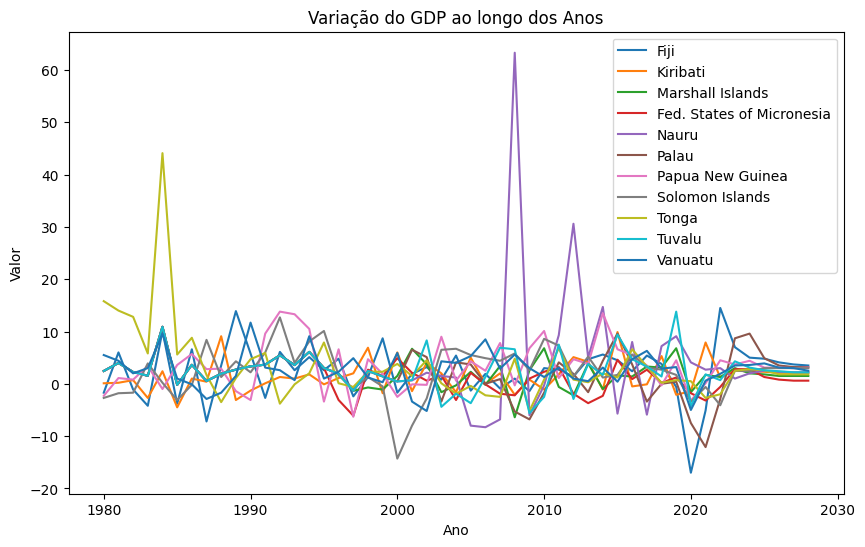

In [125]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_pacific_islands.columns:
    plt.plot(df_pacific_islands.index, df_pacific_islands[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [126]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v13 = df_transposed_copy_inputting_v12.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v13.update(df_pacific_islands)

print(df_transposed_copy_inputting_v13)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

In [127]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v13.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for advanced_economies: 0
Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for middle_east: 0
Sum of NaN occurrences for southeast_asia: 0
Sum of NaN occurrences for south_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for pacific_islands: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum of NaN occurrences for asia_and_pacific: 0
Sum of NaN occurrences for middle_east_and_

### Países da Africa

In [128]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v13.isna().sum()
# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    countries_names = groups['africa']
    nan_counts_group = nan_counts[countries_names]

print(nan_counts_group)


Real GDP growth (Annual percent change)
Algeria                      0
Egypt                        0
Libya                        0
Morocco                      0
Sudan                        0
Tunisia                      0
Angola                       0
Benin                        0
Botswana                     0
Burkina Faso                 0
Burundi                      0
Cabo Verde                   0
Cameroon                     0
Central African Republic     0
Chad                         0
Comoros                      0
Dem. Rep. of the Congo       0
Republic of Congo            0
Côte d'Ivoire                0
Djibouti                    11
Equatorial Guinea            0
Eritrea                     13
Eswatini                     0
Ethiopia                     0
Gabon                        0
The Gambia                   0
Ghana                        0
Guinea                       0
Guinea-Bissau                0
Kenya                        0
Lesotho                      0

In [129]:

group_name = "africa"

# Select countries from a specific group
country_group_selected = groups[group_name]

# Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v13[country_group_selected]
df_africa = pd.DataFrame(selected_columns)

print(df_africa)

Real GDP growth (Annual percent change)  Algeria  Egypt  Libya  Morocco  \
year                                                                      
1980-01-01                                  -5.4    3.4    0.6      3.8   
1981-01-01                                   3.0    2.2  -20.0     -2.8   
1982-01-01                                   6.4    7.3    1.5      9.6   
1983-01-01                                   5.4    8.9   -4.7     -0.6   
1984-01-01                                   5.6    8.0   -8.3      4.3   
1985-01-01                                   5.6    7.4    0.6      6.3   
1986-01-01                                  -0.2    4.8  -11.4      8.3   
1987-01-01                                  -0.7    4.3  -14.7     -2.5   
1988-01-01                                  -1.9    4.0    7.6     10.4   
1989-01-01                                   4.8    3.0    7.2      2.4   
1990-01-01                                   0.8    2.3    3.7      4.0   
1991-01-01               

In [130]:
duplicate_columns = df_africa.columns[df_africa.columns.duplicated()]

# Drop duplicate columns
df_africa = df_africa.drop(columns=duplicate_columns)
# Para cada coluna (país) nas colunas a serem preenchidas
for column in df_africa.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_africa[df_africa[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_africa[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_africa.at[index, column] = value
df_africa

Real GDP growth (Annual percent change),Algeria,Egypt,Libya,Morocco,Tunisia,Angola,Benin,Botswana,Burkina Faso,Burundi,...,Seychelles,Sierra Leone,Somalia,South Africa,Republic of South Sudan,Tanzania,Togo,Uganda,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,-5.4,3.4,0.6,3.8,7.4,2.4,9.3,12.0,4.0,-6.8,...,-2.3,-0.6,1.399576,6.6,-1.388246,3.3,-2.3,-3.4,3.9,9.194143
1981-01-01,3.0,2.2,-20.0,-2.8,5.5,-4.4,1.9,8.2,2.7,12.2,...,-3.9,1.9,3.961701,5.4,-5.692839,0.5,-3.4,3.9,6.6,-0.709250
1982-01-01,6.4,7.3,1.5,9.6,-0.5,0.0,1.7,15.9,1.4,-1.1,...,-2.1,1.8,3.976478,-0.4,28.353794,0.6,-3.7,8.2,-2.9,13.459898
1983-01-01,5.4,8.9,-4.7,-0.6,4.7,4.2,-2.0,10.8,-1.2,3.7,...,-0.6,-1.6,5.839551,-1.8,-0.158741,2.4,-5.2,4.9,-1.1,-0.190611
1984-01-01,5.6,8.0,-8.3,4.3,5.7,6.0,0.4,6.5,1.6,0.2,...,4.3,1.7,1.182544,5.1,-26.866426,3.4,5.9,-3.0,-1.7,7.781316
1985-01-01,5.6,7.4,0.6,6.3,5.7,3.5,4.3,7.7,11.3,11.8,...,10.3,-6.7,1.675219,-1.2,20.245660,4.6,3.7,-3.0,1.2,-6.550674
1986-01-01,-0.2,4.8,-11.4,8.3,-1.5,2.9,2.7,8.6,8.0,3.2,...,0.8,0.1,3.822718,0.0,-21.781955,6.6,3.3,0.9,1.7,4.380044
1987-01-01,-0.7,4.3,-14.7,-2.5,6.7,4.1,-2.1,14.9,-0.2,5.5,...,4.9,2.4,6.065861,2.1,-2.037982,5.9,-2.5,4.0,1.5,-5.905539
1988-01-01,-1.9,4.0,7.6,10.4,0.1,6.1,3.4,23.4,5.8,5.0,...,5.3,2.1,2.742656,4.2,-6.810827,4.4,10.1,8.3,9.3,-1.527056


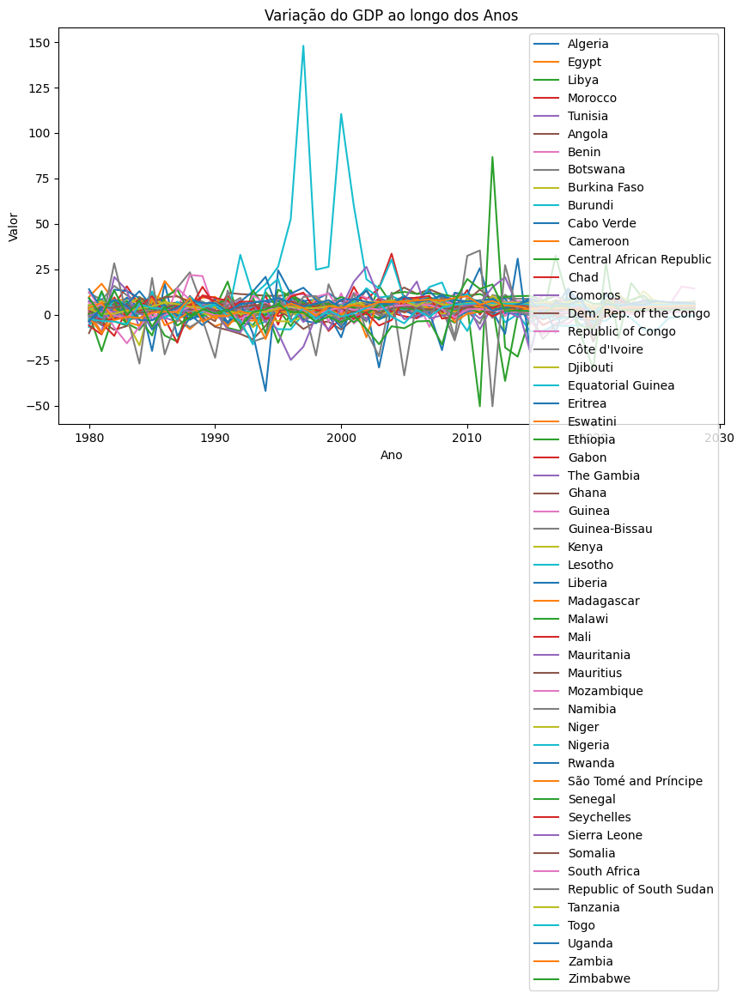

In [131]:
# Set the size of graph
plt.figure(figsize=(10, 6))

# Create the line chart
for country in df_africa.columns:
    plt.plot(df_africa.index, df_africa[country], label=country)


plt.legend()
plt.xlabel('Ano')
plt.ylabel('Valor')
plt.title('Variação do GDP ao longo dos Anos')

plt.show()

In [132]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v14 = df_transposed_copy_inputting_v13.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v14.update(df_africa)

print(df_transposed_copy_inputting_v14)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

In [133]:
# Assuming nan_counts is a DataFrame containing NaN counts for all countries
nan_counts = df_transposed_copy_inputting_v14.isna().sum()

# Create an empty dictionary to store the sums of NaN occurrences for each group
nan_sums = {}

# Calculate the sum of NaN occurrences for each group
for group_name, group_countries in groups.items():
    nan_counts_group = nan_counts[group_countries]
    nan_sum = nan_counts_group.sum()
    nan_sums[group_name] = nan_sum

# Organize nan_sums in ascending order
sorted_nan_sums = sorted(nan_sums.items(), key=lambda x: x[1])

# Print the sorted sums of NaN occurrences for each group
for group_name, nan_sum in sorted_nan_sums:
    print(f"Sum of NaN occurrences for {group_name}: {nan_sum}")


Sum of NaN occurrences for advanced_economies: 0
Sum of NaN occurrences for emerging_and_developing_europe: 0
Sum of NaN occurrences for asean_5: 0
Sum of NaN occurrences for sub_saharan_africa: 0
Sum of NaN occurrences for north_africa: 0
Sum of NaN occurrences for africa: 0
Sum of NaN occurrences for euro_area: 0
Sum of NaN occurrences for european_union: 0
Sum of NaN occurrences for europe: 0
Sum of NaN occurrences for western_europe: 0
Sum of NaN occurrences for emerging_and_developing_asia: 0
Sum of NaN occurrences for middle_east: 0
Sum of NaN occurrences for southeast_asia: 0
Sum of NaN occurrences for south_asia: 0
Sum of NaN occurrences for east_asia: 0
Sum of NaN occurrences for pacific_islands: 0
Sum of NaN occurrences for australia_and_new_zealand: 0
Sum of NaN occurrences for western_hemisphere: 0
Sum of NaN occurrences for south_america: 0
Sum of NaN occurrences for north_america: 0
Sum of NaN occurrences for central_america: 0
Sum of NaN occurrences for caribbean: 0
Sum 

### Verificando a existência de valores nulos para colunas de grupos de regiões

In [135]:
nan_counts = df_transposed_copy_inputting_v14.isna().sum()
nan_counts

Real GDP growth (Annual percent change)
Afghanistan                       0
Albania                           0
Algeria                           0
Andorra                           0
Angola                            0
                                 ..
Major advanced economies (G7)     0
Middle East and Central Asia      0
Other advanced economies          0
Sub-Saharan Africa               11
World                             0
Length: 228, dtype: int64

In [138]:

# Encontre as colunas que têm valores NaN
columns_with_nan = df_transposed_copy_inputting_v14.columns[df_transposed_copy_inputting_v14.isna().any()].tolist()

# Crie um novo DataFrame apenas com as colunas que têm valores NaN
df_missing_columns = df_transposed_copy_inputting_v14[columns_with_nan]

print(df_missing_columns)



Real GDP growth (Annual percent change)  West Bank and Gaza  Africa (Region)  \
year                                                                           
1980-01-01                                              NaN              NaN   
1981-01-01                                              NaN              NaN   
1982-01-01                                              NaN              NaN   
1983-01-01                                              NaN              NaN   
1984-01-01                                              NaN              NaN   
1985-01-01                                              NaN              NaN   
1986-01-01                                              NaN              NaN   
1987-01-01                                              NaN              NaN   
1988-01-01                                              NaN              NaN   
1989-01-01                                              NaN              NaN   
1990-01-01                              

In [179]:
groups2 = { "neighboring_west_bank_and_gaza": ["Israel", "Jordan","Egypt", "West Bank and Gaza"],
            "central_asia_and_caucasus": ["Central Asia and the Caucasus", "Armenia", "Azerbaijan", "Georgia", "Kazakhstan", "Kyrgyz Republic", "Tajikistan", "Turkmenistan", "Uzbekistan"],
            "euro_area" : ["Euro area", "Austria","Belgium","Cyprus","Estonia","Finland","France","Germany","Greece","Ireland","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Portugal","Slovak Republic","Slovenia","Spain"],
           "sub_saharan_africa" : ["Sub-Saharan Africa", "Sub-Saharan Africa (Region) ",  "Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Chad","Comoros","Dem. Rep. of the Congo","Republic of Congo","Côte d'Ivoire","Djibouti","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","The Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mauritius","Mozambique","Namibia","Niger","Nigeria","Rwanda","São Tomé and Príncipe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","Republic of South Sudan","Sudan","Tanzania","Togo","Uganda","Zambia","Zimbabwe"],
           "africa" : ["Africa (Region)", "Algeria","Egypt","Libya","Morocco","Tunisia","Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Chad","Comoros","Dem. Rep. of the Congo","Republic of Congo","Côte d'Ivoire","Djibouti","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","The Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mauritius","Mozambique","Namibia","Niger","Nigeria","Rwanda","São Tomé and Príncipe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","Republic of South Sudan","Sudan","Tanzania","Togo","Uganda","Zambia","Zimbabwe"],

}

#### Inputando dados para a coluna Africa do Grupo Africa

In [147]:


group_name = "africa"

## Select countries from a specific group
country_group_selected = groups2[group_name]

## Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v14[country_group_selected]
df_africa2 = pd.DataFrame(selected_columns)
#
print(df_africa2) 

Real GDP growth (Annual percent change)  Africa (Region)  Algeria  Egypt  \
year                                                                       
1980-01-01                                           NaN     -5.4    3.4   
1981-01-01                                           NaN      3.0    2.2   
1982-01-01                                           NaN      6.4    7.3   
1983-01-01                                           NaN      5.4    8.9   
1984-01-01                                           NaN      5.6    8.0   
1985-01-01                                           NaN      5.6    7.4   
1986-01-01                                           NaN     -0.2    4.8   
1987-01-01                                           NaN     -0.7    4.3   
1988-01-01                                           NaN     -1.9    4.0   
1989-01-01                                           NaN      4.8    3.0   
1990-01-01                                           NaN      0.8    2.3   
1991-01-01  

In [148]:

## Para cada coluna (país) nas colunas a serem preenchidas
for column in df_africa2.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_africa2[df_africa2[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_africa2[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_africa2.at[index, column] = value
df_africa2

Real GDP growth (Annual percent change),Africa (Region),Algeria,Egypt,Libya,Morocco,Tunisia,Angola,Benin,Botswana,Burkina Faso,...,Sierra Leone,Somalia,South Africa,Republic of South Sudan,Sudan,Tanzania,Togo,Uganda,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,6.026476,-5.4,3.4,0.6,3.8,7.4,2.4,9.3,12.0,4.0,...,-0.6,1.399576,6.6,-1.388246,2.5,3.3,-2.3,-3.4,3.9,9.194143
1981-01-01,4.356594,3.0,2.2,-20.0,-2.8,5.5,-4.4,1.9,8.2,2.7,...,1.9,3.961701,5.4,-5.692839,6.3,0.5,-3.4,3.9,6.6,-0.709250
1982-01-01,4.134801,6.4,7.3,1.5,9.6,-0.5,0.0,1.7,15.9,1.4,...,1.8,3.976478,-0.4,28.353794,4.1,0.6,-3.7,8.2,-2.9,13.459898
1983-01-01,3.272731,5.4,8.9,-4.7,-0.6,4.7,4.2,-2.0,10.8,-1.2,...,-1.6,5.839551,-1.8,-0.158741,-1.5,2.4,-5.2,4.9,-1.1,-0.190611
1984-01-01,3.718864,5.6,8.0,-8.3,4.3,5.7,6.0,0.4,6.5,1.6,...,1.7,1.182544,5.1,-26.866426,-5.6,3.4,5.9,-3.0,-1.7,7.781316
1985-01-01,1.240552,5.6,7.4,0.6,6.3,5.7,3.5,4.3,7.7,11.3,...,-6.7,1.675219,-1.2,20.245660,-0.6,4.6,3.7,-3.0,1.2,-6.550674
1986-01-01,0.946740,-0.2,4.8,-11.4,8.3,-1.5,2.9,2.7,8.6,8.0,...,0.1,3.822718,0.0,-21.781955,9.9,6.6,3.3,0.9,1.7,4.380044
1987-01-01,6.874797,-0.7,4.3,-14.7,-2.5,6.7,4.1,-2.1,14.9,-0.2,...,2.4,6.065861,2.1,-2.037982,6.5,5.9,-2.5,4.0,1.5,-5.905539
1988-01-01,4.885815,-1.9,4.0,7.6,10.4,0.1,6.1,3.4,23.4,5.8,...,2.1,2.742656,4.2,-6.810827,4.3,4.4,10.1,8.3,9.3,-1.527056


In [149]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v15 = df_transposed_copy_inputting_v14.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v15.update(df_africa2)

print(df_transposed_copy_inputting_v15)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

#### Inputando dados da coluna Sub-Saharan Africa para o grupo Sub-Saharan Africa

In [162]:

group_name = "sub_saharan_africa"

## Select countries from a specific group
country_group_selected = groups2[group_name]

## Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v15[country_group_selected]
df_subsaharan_africa2 = pd.DataFrame(selected_columns)
#
print(df_subsaharan_africa2) 

Real GDP growth (Annual percent change)  Sub-Saharan Africa  \
year                                                          
1980-01-01                                              NaN   
1981-01-01                                              NaN   
1982-01-01                                              NaN   
1983-01-01                                              NaN   
1984-01-01                                              NaN   
1985-01-01                                              NaN   
1986-01-01                                              NaN   
1987-01-01                                              NaN   
1988-01-01                                              NaN   
1989-01-01                                              NaN   
1990-01-01                                              NaN   
1991-01-01                                              0.2   
1992-01-01                                              0.0   
1993-01-01                                             

In [163]:


for column in df_subsaharan_africa2.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_subsaharan_africa2[df_subsaharan_africa2[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_subsaharan_africa2[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_subsaharan_africa2.at[index, column] = value
df_subsaharan_africa2

Real GDP growth (Annual percent change),Sub-Saharan Africa,Sub-Saharan Africa (Region),Angola,Benin,Botswana,Burkina Faso,Burundi,Cabo Verde,Cameroon,Central African Republic,...,Sierra Leone,Somalia,South Africa,Republic of South Sudan,Sudan,Tanzania,Togo,Uganda,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,4.234366,3.505879,2.4,9.3,12.0,4.0,-6.8,5.3,9.9,-3.0,...,-0.6,1.399576,6.6,-1.388246,2.5,3.3,-2.3,-3.4,3.9,9.194143
1981-01-01,2.337055,5.638413,-4.4,1.9,8.2,2.7,12.2,8.4,17.1,13.0,...,1.9,3.961701,5.4,-5.692839,6.3,0.5,-3.4,3.9,6.6,-0.709250
1982-01-01,2.956270,1.825036,0.0,1.7,15.9,1.4,-1.1,2.8,7.6,-3.6,...,1.8,3.976478,-0.4,28.353794,4.1,0.6,-3.7,8.2,-2.9,13.459898
1983-01-01,2.986986,-0.057171,4.2,-2.0,10.8,-1.2,3.7,9.5,6.8,-6.0,...,-1.6,5.839551,-1.8,-0.158741,-1.5,2.4,-5.2,4.9,-1.1,-0.190611
1984-01-01,2.426560,5.433970,6.0,0.4,6.5,1.6,0.2,3.8,7.5,9.9,...,1.7,1.182544,5.1,-26.866426,-5.6,3.4,5.9,-3.0,-1.7,7.781316
1985-01-01,3.610474,5.196227,3.5,4.3,7.7,11.3,11.8,8.6,8.1,3.7,...,-6.7,1.675219,-1.2,20.245660,-0.6,4.6,3.7,-3.0,1.2,-6.550674
1986-01-01,5.055692,3.069922,2.9,2.7,8.6,8.0,3.2,2.9,6.8,7.2,...,0.1,3.822718,0.0,-21.781955,9.9,6.6,3.3,0.9,1.7,4.380044
1987-01-01,3.330448,6.611680,4.1,-2.1,14.9,-0.2,5.5,4.3,-2.2,0.0,...,2.4,6.065861,2.1,-2.037982,6.5,5.9,-2.5,4.0,1.5,-5.905539
1988-01-01,3.573293,4.245696,6.1,3.4,23.4,5.8,5.0,6.0,-7.9,1.7,...,2.1,2.742656,4.2,-6.810827,4.3,4.4,10.1,8.3,9.3,-1.527056


In [164]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v16 = df_transposed_copy_inputting_v15.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v16.update(df_subsaharan_africa2)

print(df_transposed_copy_inputting_v16)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

#### Inputando dados para a coluna Euro_Area do grupo Euro Area

In [165]:


group_name = "euro_area"

## Select countries from a specific group
country_group_selected = groups2[group_name]

## Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v14[country_group_selected]
df_euroarea2 = pd.DataFrame(selected_columns)
#
print(df_euroarea2) 

Real GDP growth (Annual percent change)  Euro area  Austria  Belgium  Cyprus  \
year                                                                           
1980-01-01                                     NaN      2.3      4.4     5.9   
1981-01-01                                     NaN     -0.1     -0.3     3.1   
1982-01-01                                     NaN      1.9      0.6     6.3   
1983-01-01                                     NaN      2.8      0.3     5.3   
1984-01-01                                     NaN      0.3      2.5     8.8   
1985-01-01                                     NaN      2.2      1.7     4.7   
1986-01-01                                     NaN      2.3      1.8     3.6   
1987-01-01                                     NaN      1.7      2.3     7.1   
1988-01-01                                     NaN      1.0      4.7     8.3   
1989-01-01                                     NaN      3.9      3.5     8.1   
1990-01-01                              

In [166]:
for column in df_euroarea2.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_euroarea2[df_euroarea2[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_euroarea2[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_euroarea2.at[index, column] = value
df_euroarea2

Real GDP growth (Annual percent change),Euro area,Austria,Belgium,Cyprus,Estonia,Finland,France,Germany,Greece,Ireland,Italy,Latvia,Lithuania,Luxembourg,Malta,Netherlands,Portugal,Slovak Republic,Slovenia,Spain
year,,,,,,,,,,,,,,,,,,,,
1980-01-01,1.858750,2.3,4.4,5.9,3.550000,5.7,1.8,1.3,0.7,2.9,3.1,2.950000,3.750000,3.2,7.0,2.041667,6.7,3.440686,3.440686,1.2
1981-01-01,-0.347457,-0.1,-0.3,3.1,3.182143,1.3,1.1,0.1,-1.6,2.5,0.6,1.846154,3.840625,0.8,2.7,-0.500000,3.5,1.274642,1.274642,-0.4
1982-01-01,1.848839,1.9,0.6,6.3,2.814286,3.1,2.5,-0.8,-1.1,1.5,0.2,0.742308,3.931250,1.0,0.1,-1.300000,2.2,1.463991,1.463991,1.2
1983-01-01,3.424405,2.8,0.3,5.3,2.446429,3.1,1.3,1.6,-1.1,-0.7,0.9,-0.361538,4.021875,1.9,2.6,1.800000,1.0,1.682751,1.682751,1.7
1984-01-01,-0.443353,0.3,2.5,8.8,2.078571,3.2,1.6,2.8,2.0,3.2,3.0,-1.465385,4.112500,4.7,0.8,3.100000,-1.0,2.436805,2.436805,1.7
1985-01-01,0.249279,2.2,1.7,4.7,1.710714,3.5,1.7,2.2,2.5,1.9,2.6,-2.569231,4.203125,5.6,2.4,2.700000,1.6,2.414389,2.414389,2.4
1986-01-01,1.440453,2.3,1.8,3.6,1.342857,2.7,2.3,2.4,0.5,0.4,2.7,-3.673077,4.293750,10.0,3.8,3.100000,3.3,2.603737,2.603737,3.4
1987-01-01,1.714302,1.7,2.3,7.1,0.975000,3.6,2.6,1.5,-2.3,3.6,3.1,-4.776923,4.384375,4.0,5.7,1.900000,7.6,2.863674,2.863674,5.7
1988-01-01,2.389039,1.0,4.7,8.3,0.607143,5.2,4.6,3.7,4.3,3.0,4.0,-5.880769,4.475000,8.5,6.8,4.600000,5.3,4.029493,4.029493,5.3


In [167]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v17 = df_transposed_copy_inputting_v16.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v17.update(df_euroarea2)

print(df_transposed_copy_inputting_v17)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

#### Inputando dados para a coluna  Central Asia and Caucasus 

In [169]:


group_name = "central_asia_and_caucasus"

## Select countries from a specific group
country_group_selected = groups2[group_name]

## Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v17[country_group_selected]
df_centralasia_caucasus2 = pd.DataFrame(selected_columns)
#
print(df_centralasia_caucasus2) 

Real GDP growth (Annual percent change)  Central Asia and the Caucasus  \
year                                                                     
1980-01-01                                                         NaN   
1981-01-01                                                         NaN   
1982-01-01                                                         NaN   
1983-01-01                                                         NaN   
1984-01-01                                                         NaN   
1985-01-01                                                         NaN   
1986-01-01                                                         NaN   
1987-01-01                                                         NaN   
1988-01-01                                                         NaN   
1989-01-01                                                         NaN   
1990-01-01                                                         NaN   
1991-01-01                            

In [170]:
for column in df_centralasia_caucasus2.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_centralasia_caucasus2[df_centralasia_caucasus2[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_centralasia_caucasus2[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_centralasia_caucasus2.at[index, column] = value
df_centralasia_caucasus2

Real GDP growth (Annual percent change),Central Asia and the Caucasus,Armenia,Azerbaijan,Georgia,Kazakhstan,Kyrgyz Republic,Tajikistan,Turkmenistan,Uzbekistan
year,,,,,,,,,
1980-01-01,3.658527,5.290000,4.46,1.980000,3.550000,2.720000,4.470000,4.82,4.700000
1981-01-01,2.621755,3.798462,2.34,-0.118182,2.569231,1.510769,3.272308,3.68,3.383333
1982-01-01,2.865330,2.306923,0.22,-2.216364,1.588462,0.301538,2.074615,2.54,2.066667
1983-01-01,-1.007688,0.815385,-1.90,-4.314545,0.607692,-0.907692,0.876923,1.40,0.750000
1984-01-01,10.319973,-0.676154,-4.02,-6.412727,-0.373077,-2.116923,-0.320769,0.26,-0.566667
1985-01-01,10.003354,-2.167692,-6.14,-8.510909,-1.353846,-3.326154,-1.518462,-0.88,-1.883333
1986-01-01,3.431467,-3.659231,-8.26,-10.609091,-2.334615,-4.535385,-2.716154,-2.02,-3.200000
1987-01-01,2.672106,-5.150769,-10.38,-12.707273,-3.315385,-5.744615,-3.913846,-3.16,-4.516667
1988-01-01,6.698631,-6.642308,-12.50,-14.805455,-4.296154,-6.953846,-5.111538,-4.30,-5.833333


In [171]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v18 = df_transposed_copy_inputting_v17.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v18.update(df_centralasia_caucasus2)

print(df_transposed_copy_inputting_v18)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

#### Preenchendo valores para a coluna da Faixa de Gaza

In [180]:

group_name = "neighboring_west_bank_and_gaza"

## Select countries from a specific group
country_group_selected = groups2[group_name]

## Select the correspondent columns from the desired group
selected_columns = df_transposed_copy_inputting_v18[country_group_selected]
df_neighboring_west_bank_and_gaza = pd.DataFrame(selected_columns)
#
print(df_neighboring_west_bank_and_gaza) 

Real GDP growth (Annual percent change)  Israel  Jordan  Egypt  \
year                                                             
1980-01-01                                  3.6    11.1    3.4   
1981-01-01                                  4.7    15.0    2.2   
1982-01-01                                  1.4     5.8    7.3   
1983-01-01                                  2.6     1.4    8.9   
1984-01-01                                  2.2     5.5    8.0   
1985-01-01                                  4.5    -1.1    7.4   
1986-01-01                                  3.6     5.9    4.8   
1987-01-01                                  7.5     2.7    4.3   
1988-01-01                                  3.6     2.9    4.0   
1989-01-01                                  1.4   -10.7    3.0   
1990-01-01                                  6.6    -1.6    2.3   
1991-01-01                                  4.6    -5.7    2.1   
1992-01-01                                  7.2    16.9    0.3   
1993-01-01

In [181]:


for column in df_neighboring_west_bank_and_gaza.columns:
    # Selecione as linhas onde os valores estão ausentes para essa coluna
    missing_rows = df_neighboring_west_bank_and_gaza[df_neighboring_west_bank_and_gaza[column].isna()]
    
    if not missing_rows.empty:
        # Se a lista de valores ausentes não estiver vazia
        # Calcule a média e o desvio padrão desses valores não ausentes para essa coluna
        non_nan_values = df_neighboring_west_bank_and_gaza[column].dropna()
        mean = non_nan_values.mean()
        std_dev = non_nan_values.std()
        
        # Preencha os valores ausentes com base na média, desvio padrão e relação com a média
        for index, row in missing_rows.iterrows():
            value = np.random.normal(mean, std_dev)  # Gerando valor aleatório da distribuição normal
            # Se o valor gerado estiver muito distante da média, ajuste-o para um valor próximo
            if abs(value - mean) > std_dev * 3:
                value = mean + (std_dev * 3 * np.sign(value - mean))
            df_neighboring_west_bank_and_gaza.at[index, column] = value
df_neighboring_west_bank_and_gaza

Real GDP growth (Annual percent change),Israel,Jordan,Egypt,West Bank and Gaza
year,,,,
1980-01-01,3.6,11.1,3.4,-2.184098
1981-01-01,4.7,15.0,2.2,0.718473
1982-01-01,1.4,5.8,7.3,7.916483
1983-01-01,2.6,1.4,8.9,1.405018
1984-01-01,2.2,5.5,8.0,-1.950809
1985-01-01,4.5,-1.1,7.4,13.216114
1986-01-01,3.6,5.9,4.8,1.820209
1987-01-01,7.5,2.7,4.3,2.164371
1988-01-01,3.6,2.9,4.0,1.174398


In [182]:
# Update the original dataframe. But for security it will be updated a copy of that dataframe

df_transposed_copy_inputting_v19 = df_transposed_copy_inputting_v18.copy()
# Update the values of df_transposed_copy_inputting_v1 with df_countries_5 values
df_transposed_copy_inputting_v19.update(df_neighboring_west_bank_and_gaza)

print(df_transposed_copy_inputting_v19)
#df_transposed_copy_inputting_v7.to_csv('Projeto/df_transposed_copy_inputting_v7.csv')

Real GDP growth (Annual percent change)  Afghanistan  Albania  Algeria  \
year                                                                     
1980-01-01                                  4.345486      2.7     -5.4   
1981-01-01                                  7.200000      5.7      3.0   
1982-01-01                                  5.116667      2.9      6.4   
1983-01-01                                  4.283333      1.1      5.4   
1984-01-01                                  6.166667      2.0      5.6   
1985-01-01                                  5.433333     -1.5      5.6   
1986-01-01                                  5.383333      5.6     -0.2   
1987-01-01                                  6.150000     -0.8     -0.7   
1988-01-01                                  7.283333     -1.4     -1.9   
1989-01-01                                  4.350000      9.8      4.8   
1990-01-01                                  5.983333    -10.0      0.8   
1991-01-01                            

In [184]:

# Encontre as colunas que têm valores NaN
columns_with_nan = df_transposed_copy_inputting_v19.columns[df_transposed_copy_inputting_v19.isna().any()].tolist()

# Crie um novo DataFrame apenas com as colunas que têm valores NaN
df_missing_columns = df_transposed_copy_inputting_v19[columns_with_nan]

print(df_missing_columns)



Empty DataFrame
Columns: []
Index: [1980-01-01 00:00:00, 1981-01-01 00:00:00, 1982-01-01 00:00:00, 1983-01-01 00:00:00, 1984-01-01 00:00:00, 1985-01-01 00:00:00, 1986-01-01 00:00:00, 1987-01-01 00:00:00, 1988-01-01 00:00:00, 1989-01-01 00:00:00, 1990-01-01 00:00:00, 1991-01-01 00:00:00, 1992-01-01 00:00:00, 1993-01-01 00:00:00, 1994-01-01 00:00:00, 1995-01-01 00:00:00, 1996-01-01 00:00:00, 1997-01-01 00:00:00, 1998-01-01 00:00:00, 1999-01-01 00:00:00, 2000-01-01 00:00:00, 2001-01-01 00:00:00, 2002-01-01 00:00:00, 2003-01-01 00:00:00, 2004-01-01 00:00:00, 2005-01-01 00:00:00, 2006-01-01 00:00:00, 2007-01-01 00:00:00, 2008-01-01 00:00:00, 2009-01-01 00:00:00, 2010-01-01 00:00:00, 2011-01-01 00:00:00, 2012-01-01 00:00:00, 2013-01-01 00:00:00, 2014-01-01 00:00:00, 2015-01-01 00:00:00, 2016-01-01 00:00:00, 2017-01-01 00:00:00, 2018-01-01 00:00:00, 2019-01-01 00:00:00, 2020-01-01 00:00:00, 2021-01-01 00:00:00, 2022-01-01 00:00:00, 2023-01-01 00:00:00, 2024-01-01 00:00:00, 2025-01-01 00:00:00